<a href="https://colab.research.google.com/github/matthew110395/12004210_DataAnalytics/blob/main/12004210_DAOTW_Assignment1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Introduction
This assignment will explore the relationship between weather and the number of vehicle collisions withing New York City.

Part one of the Assignment will analyse the data to idenitfy patterns, anomolys and relationships.

#Hypothesis
As weather conditions worsen (temperature decrese, precipitation increase, windspeed increase) the number of collisions will increase.

#Methodology
##Get Data

Data for this assignment will be sourced from Google BigQuery. The two main datasets utlised will be NYPD Motor Vehicle Collisions and Global Surface Summary of the Day (GSOD) Weather Data. 

As a starting point two views will be created one containing weather data and another containing collision data. The script for the creation of each view is shown below.

###Create Weather Data View

```
CREATE VIEW `uhi-project-361414.assignment.weather_2012_to_2022` AS
SELECT DATE(CAST(year as INT64),CAST(mo as INT64),CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp,sndp, fog, rain_drizzle, snow_ice_pellets,hail, thunder, tornado_funnel_cloud FROM
`bigquery-public-data.noaa_gsod.gsod2012`
WHERE
  stn='725060'
UNION ALL
SELECT DATE(CAST(year as INT64),CAST(mo as INT64),CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp,sndp, fog, rain_drizzle, snow_ice_pellets,hail, thunder, tornado_funnel_cloud FROM
`bigquery-public-data.noaa_gsod.gsod2013`
WHERE
  stn='725060'
UNION ALL
SELECT DATE(CAST(year as INT64),CAST(mo as INT64),CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp,sndp, fog, rain_drizzle, snow_ice_pellets,hail, thunder, tornado_funnel_cloud FROM
`bigquery-public-data.noaa_gsod.gsod2014`
WHERE
  stn='725060' AND wban = '14756'
UNION ALL
SELECT DATE(CAST(year as INT64),CAST(mo as INT64),CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp,sndp, fog, rain_drizzle, snow_ice_pellets,hail, thunder, tornado_funnel_cloud FROM
`bigquery-public-data.noaa_gsod.gsod2015`
WHERE
  stn='725060'
UNION ALL
SELECT DATE(CAST(year as INT64),CAST(mo as INT64),CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp,sndp, fog, rain_drizzle, snow_ice_pellets,hail, thunder, tornado_funnel_cloud FROM
`bigquery-public-data.noaa_gsod.gsod2016`
WHERE
  stn='725060'
UNION ALL
SELECT DATE(CAST(year as INT64),CAST(mo as INT64),CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp,sndp, fog, rain_drizzle, snow_ice_pellets,hail, thunder, tornado_funnel_cloud FROM
`bigquery-public-data.noaa_gsod.gsod2017`
WHERE
  stn='725060'
UNION ALL
SELECT DATE(CAST(year as INT64),CAST(mo as INT64),CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp,sndp, fog, rain_drizzle, snow_ice_pellets,hail, thunder, tornado_funnel_cloud FROM
`bigquery-public-data.noaa_gsod.gsod2018`
WHERE
  stn='725060'
UNION ALL
SELECT DATE(CAST(year as INT64),CAST(mo as INT64),CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp,sndp, fog, rain_drizzle, snow_ice_pellets,hail, thunder, tornado_funnel_cloud FROM
`bigquery-public-data.noaa_gsod.gsod2019`
WHERE
  stn='725060'
UNION ALL
SELECT DATE(CAST(year as INT64),CAST(mo as INT64),CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp,sndp, fog, rain_drizzle, snow_ice_pellets,hail, thunder, tornado_funnel_cloud FROM
`bigquery-public-data.noaa_gsod.gsod2020`
WHERE
  stn='725060'
UNION ALL
SELECT DATE(CAST(year as INT64),CAST(mo as INT64),CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp,sndp, fog, rain_drizzle, snow_ice_pellets,hail, thunder, tornado_funnel_cloud FROM
`bigquery-public-data.noaa_gsod.gsod2021`
WHERE
  stn='725060'
UNION ALL
SELECT DATE(CAST(year as INT64),CAST(mo as INT64),CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp,sndp, fog, rain_drizzle, snow_ice_pellets,hail, thunder, tornado_funnel_cloud FROM
`bigquery-public-data.noaa_gsod.gsod2022`
WHERE
  stn='725060'
ORDER BY year, mo, da;
```
###Create Collision Data View

```
CREATE VIEW `uhi-project-361414.assignment.collision_data` AS
SELECT CAST(timestamp as DATE) as collision_date,FORMAT_DATE("%u", timestamp) as day, COUNT(CAST(timestamp as DATE)) AS NUM_COLLISIONS  FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions` 
GROUP BY collision_date,day
```
###Create Collated Data Table
In order to easily export the data a collated table containing both the weather and collision data has been created. 
```
CREATE TABLE `uhi-project-361414.assignment.collated_collision_data` AS
SELECT day, year, mo, da, collision_date,NUM_COLLISIONS, temp, dewp, slp, visib, wdsp, mxpsd, gust,max, min, prcp, sndp, fog, rain_drizzle, snow_ice_pellets, hail, thunder, tornado_funnel_cloud	FROM `uhi-project-361414.assignment.weather_2012_to_2022` as weather, `uhi-project-361414.assignment.collision_data` as collisions
WHERE collisions.collision_date = weather.date
```
This table was then exported as a CSV and uploaded to github.

##Import the Data
In order to analyse the data, the data is imported from the CSV created above.

To ensure the data has imported correctly the head command is used to display the first 6 data rows of the file.

In [49]:
coldata <- read.csv("https://raw.githubusercontent.com/matthew110395/12004210_DataAnalytics/main/collated_collision_data.csv", stringsAsFactors = TRUE)
head(coldata)

,day,year,mo,da,collision_date,NUM_COLLISIONS,temp,dewp,slp,visib,⋯,max,min,prcp,sndp,fog,rain_drizzle,snow_ice_pellets,hail,thunder,tornado_funnel_cloud
,<int>,<int>,<int>,<int>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>
1,5,2020,1,24,2020-01-24,524,37.3,33.7,1028.5,6.5,⋯,46.0,19.9,0.00,999.9,1,0,0,0,0,0
2,2,2021,1,12,2021-01-12,278,37.0,29.1,1019.0,10.0,⋯,44.1,21.0,0.00,999.9,0,0,0,0,0,0
3,5,2021,1,22,2021-01-22,254,36.5,28.4,1003.1,10.0,⋯,44.1,19.9,0.00,999.9,0,0,0,0,0,0
4,3,2021,1,27,2021-01-27,262,34.6,33.8,1012.8,8.0,⋯,41.0,28.9,0.25,999.9,1,1,0,0,0,11000
5,2,2021,1,26,2021-01-26,263,31.9,23.4,1016.9,9.0,⋯,37.9,21.0,0.00,999.9,1,0,0,0,1000,1000
6,1,2022,1,24,2022-01-24,237,34.5,23.8,1010.6,9.7,⋯,39.9,25.0,0.00,999.9,1,0,0,0,1000,1000


#Analysis
##Summary
The below summary of the static CSV file shows key details of the data contained within each column of the dataset.

The key information to take from this summary is:
 
*   The dataset starts on 2012 and runs through to 2022.
*   The minimum number of recorded collisions on a particular day is 94
*   The maximum number of recorded collisions on a particular day is 1161


In [50]:
summary(coldata)

      day             year            mo               da      
 Min.   :1.000   Min.   :2012   Min.   : 1.000   Min.   : 1.0  
 1st Qu.:2.000   1st Qu.:2015   1st Qu.: 4.000   1st Qu.: 8.0  
 Median :4.000   Median :2017   Median : 7.000   Median :16.0  
 Mean   :3.999   Mean   :2017   Mean   : 6.526   Mean   :15.7  
 3rd Qu.:6.000   3rd Qu.:2020   3rd Qu.:10.000   3rd Qu.:23.0  
 Max.   :7.000   Max.   :2022   Max.   :12.000   Max.   :31.0  
                                                               
    collision_date NUM_COLLISIONS        temp            dewp         
 2012-07-01:   1   Min.   :  94.0   Min.   : 5.80   Min.   :   -6.70  
 2012-07-02:   1   1st Qu.: 392.2   1st Qu.:41.30   1st Qu.:   32.60  
 2012-07-03:   1   Median : 553.0   Median :52.30   Median :   45.60  
 2012-07-04:   1   Mean   : 520.5   Mean   :52.35   Mean   :   47.44  
 2012-07-05:   1   3rd Qu.: 637.0   3rd Qu.:64.80   3rd Qu.:   59.10  
 2012-07-06:   1   Max.   :1161.0   Max.   :86.70   Max.   : 9

##Data Quality
As highlighted in the weather dataset documentation there is some errors in the data. The summary above shows some records contain only 9's. The documentation advises if the folloeing fields contain only 9's the data is missing.


*   Temp
*   Dewp
*   slp
*   visib
*   wdsp
*   mxpsd
*   gust
*   max
*   min
*   prcp
*   sndp
*   Dewp



Rows in Dataset: 3674 
dewp Error Values: 1 (Percentage of rows 0.02721829 %) 
mxpsd Error Values: 32 (Percentage of rows 0.8709853 %) 
gust Error Values: 1396 (Percentage of rows 37.99673 %) 
prcp Error Values: 39 (Percentage of rows 1.061513 %) 
sndp Error Values: 3673 (Percentage of rows 99.97278 %) 


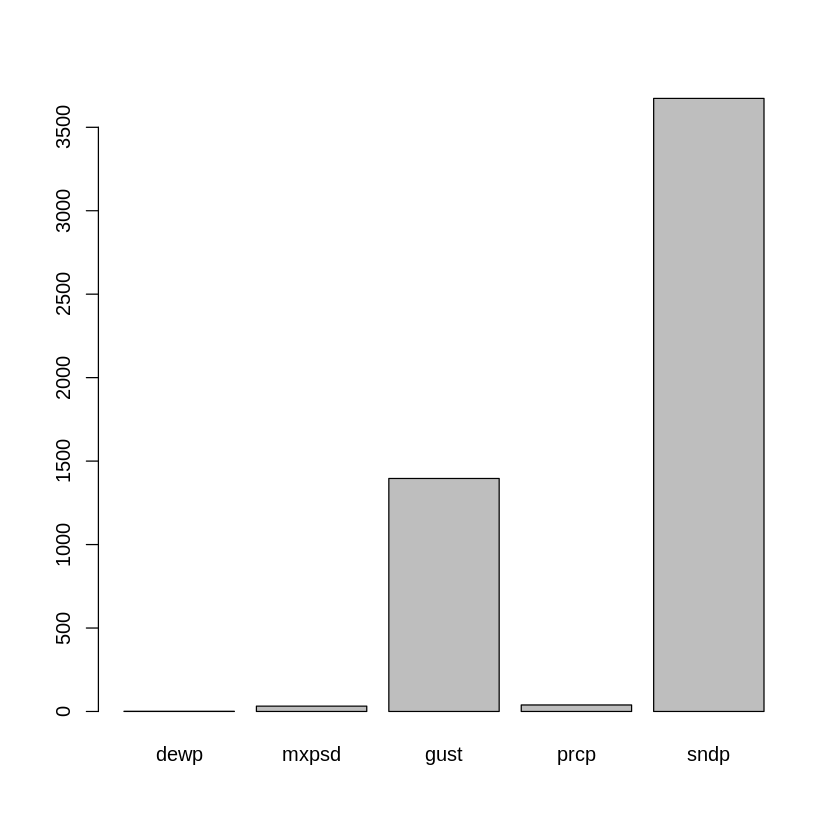

In [51]:
countMax <- function(v) { length(which(v == max(v)))}
datasetLen <- length(coldata$da)
cat("Rows in Dataset:", datasetLen,"\n")
cat("dewp Error Values:",countMax(coldata$dewp),"(Percentage of rows",(countMax(coldata$dewp)/datasetLen)*100,"%) \n")
cat("mxpsd Error Values:",countMax(coldata$mxpsd),"(Percentage of rows",(countMax(coldata$mxpsd)/datasetLen)*100,"%) \n")
cat("gust Error Values:",countMax(coldata$gust),"(Percentage of rows",(countMax(coldata$gust)/datasetLen)*100,"%) \n")
cat("prcp Error Values:",countMax(coldata$prcp),"(Percentage of rows",(countMax(coldata$prcp)/datasetLen)*100,"%) \n")
cat("sndp Error Values:",countMax(coldata$sndp),"(Percentage of rows",(countMax(coldata$sndp)/datasetLen)*100,"%) \n")
df <- data.frame(column = c("dewp", "mxpsd", "gust", "prcp", "sndp"),
                 instances = c(countMax(coldata$dewp), countMax(coldata$mxpsd), countMax(coldata$gust), countMax(coldata$prcp), countMax(coldata$sndp))
                 )

barplot(height=df$instances, names=df$column)


The large percentage of errors within the sndp column can be accounted for as the documentation confirms if no snow depth is recorded 999.9 is recorded REF. There is no explination for the large percentage of errors within the gust column.

In order to accurately analyse the data, all error values must be excluded.

In [52]:
dewp_clean <- coldata[which(coldata$dewp < 9999.9), ]
mxpsd_clean <- coldata[which(coldata$mxpsd < 999.9), ]
gust_clean <- coldata[which(coldata$gust < 999.9), ]
prcp_clean <- coldata[which(coldata$prcp < 99.9), ]
sndp_clean <- coldata[which(coldata$sndp < 999.9), ]

'Remaining Rows'
length(dewp_clean$collision_date)
length(mxpsd_clean$collision_date)
length(gust_clean$collision_date)
length(prcp_clean$collision_date)
length(sndp_clean$collision_date)

[1] "Remaining Rows"

[1] 3673

[1] 3642

[1] 2278

[1] 3635

[1] 1

As only a single row remains for snow depth, it will be excluded from any further analysis.



##Pattern Analysis


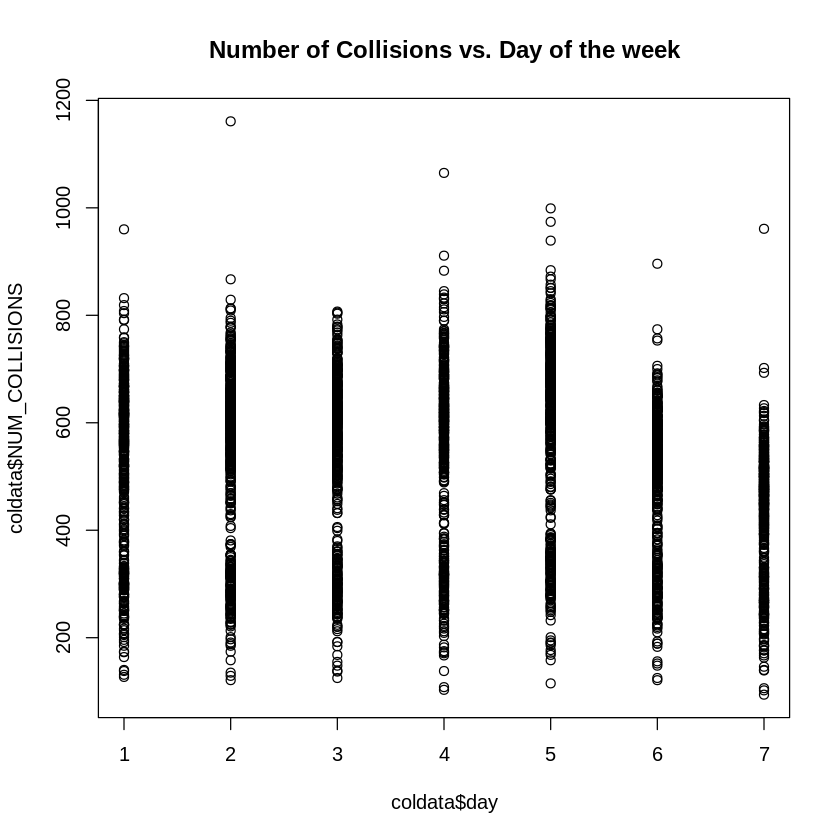

[1] 0.0675109

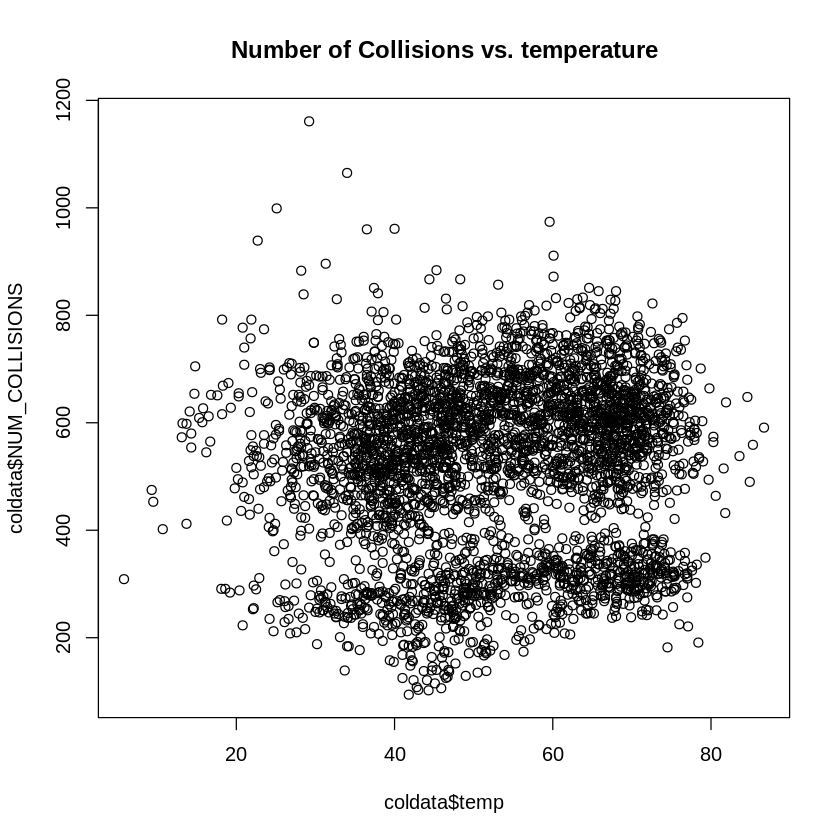

[1] -0.01432441

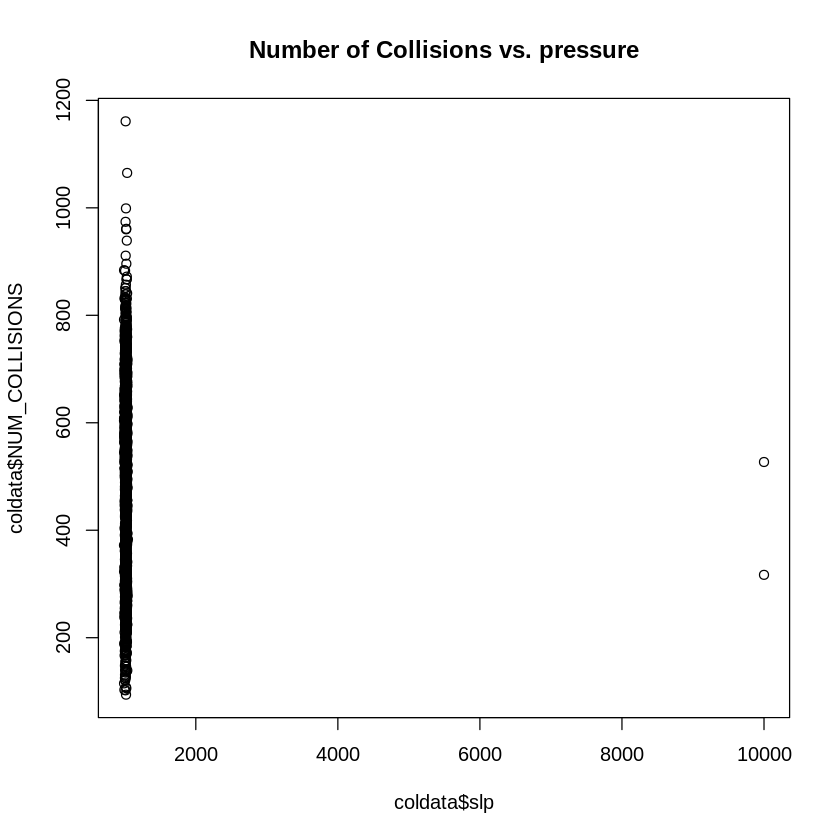

[1] -0.04713228

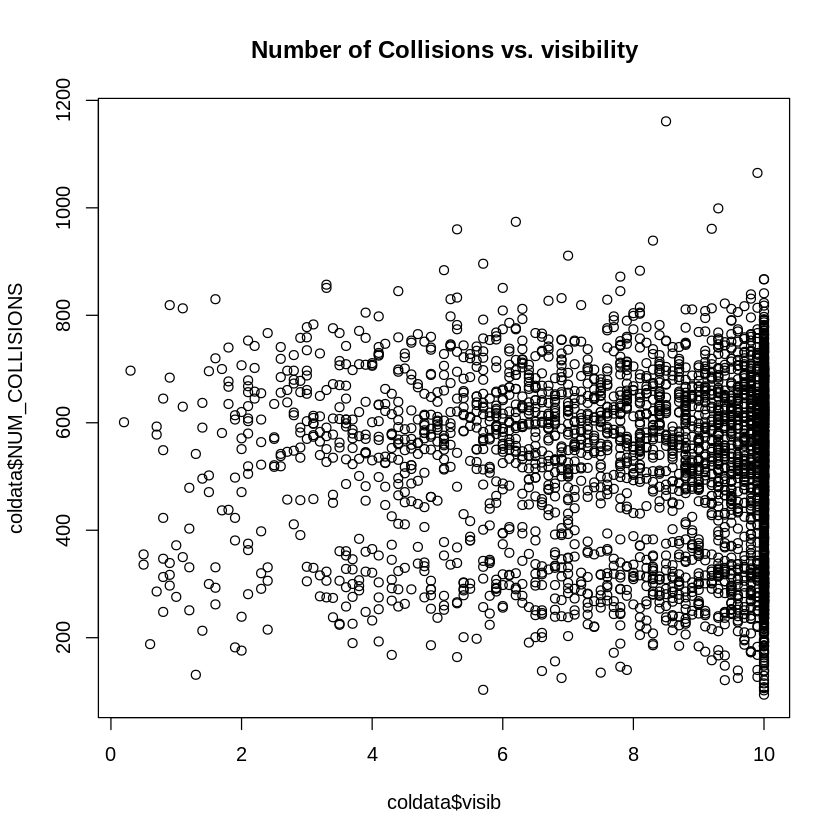

[1] -0.03250595

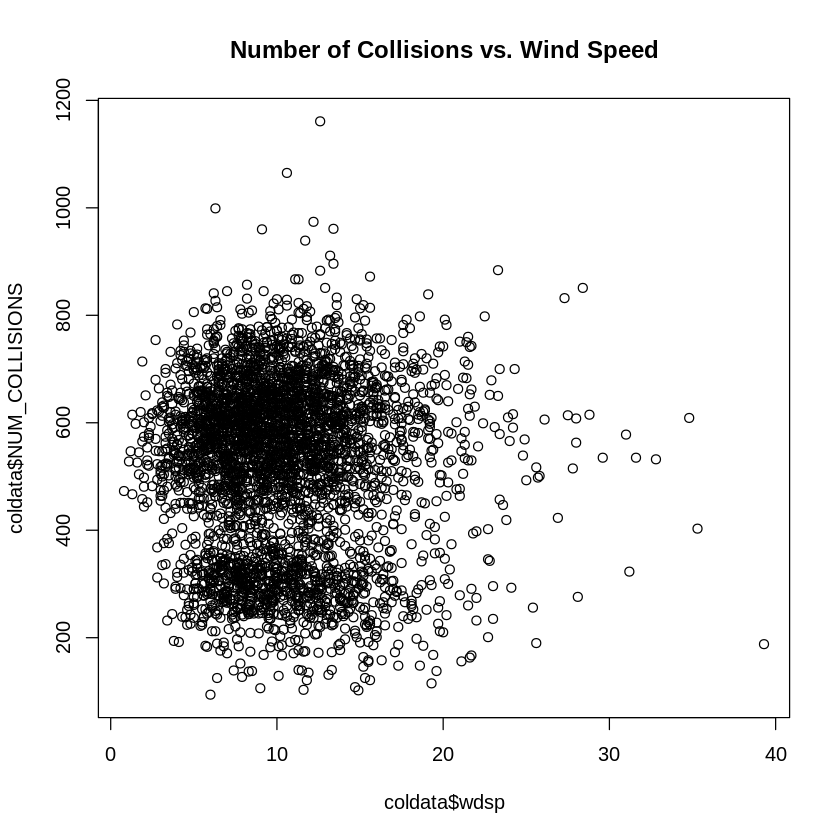

[1] 0.07151507

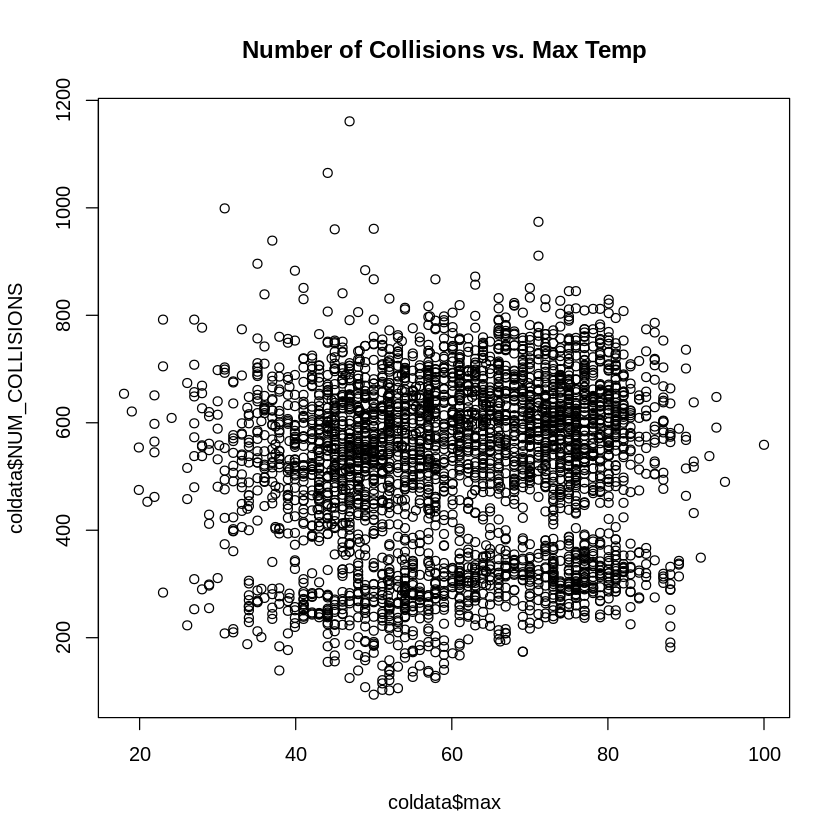

[1] 0.06266176

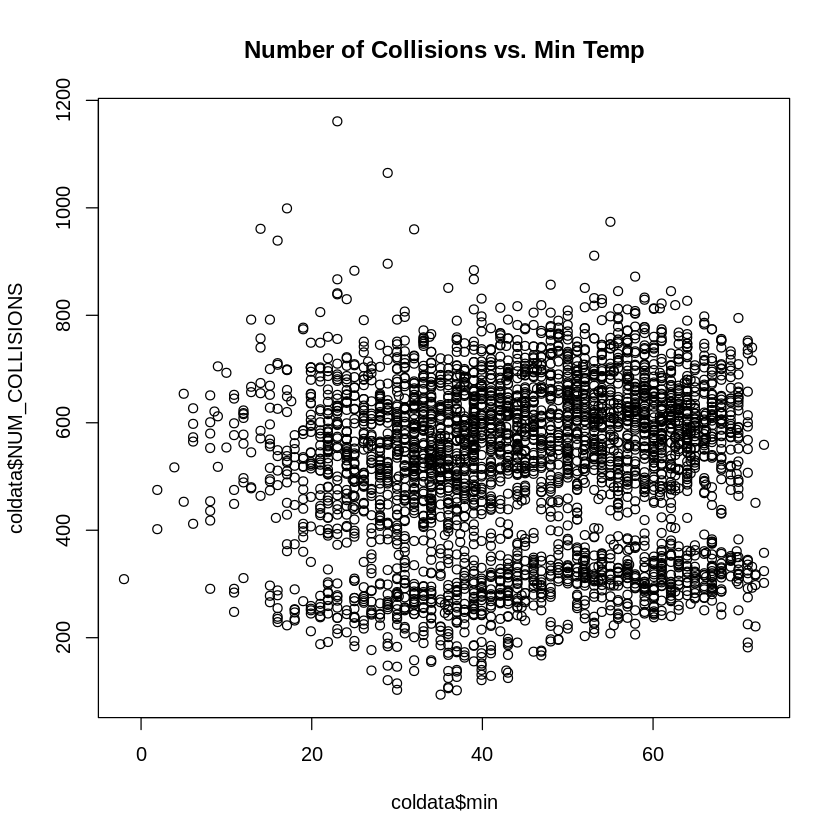

[1] 0.07560804

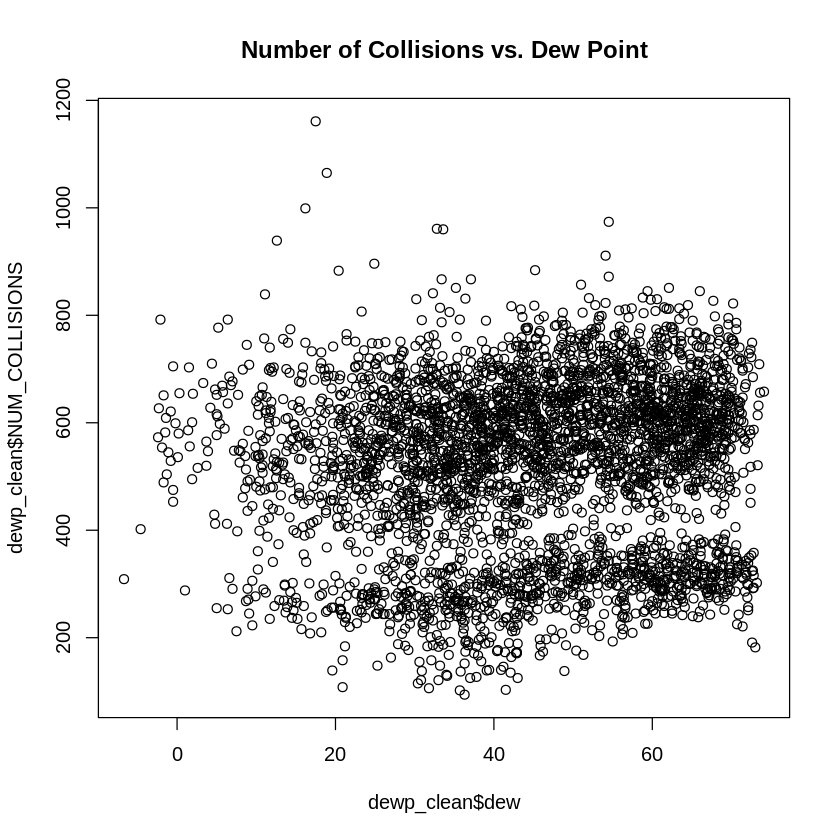

[1] -0.03618932

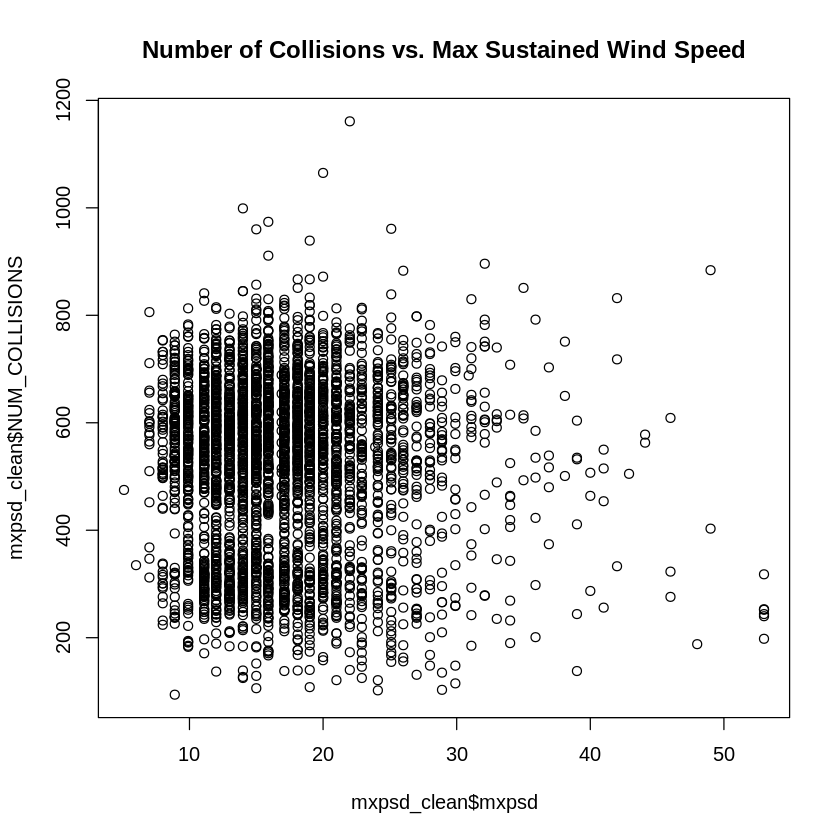

[1] -0.03511082

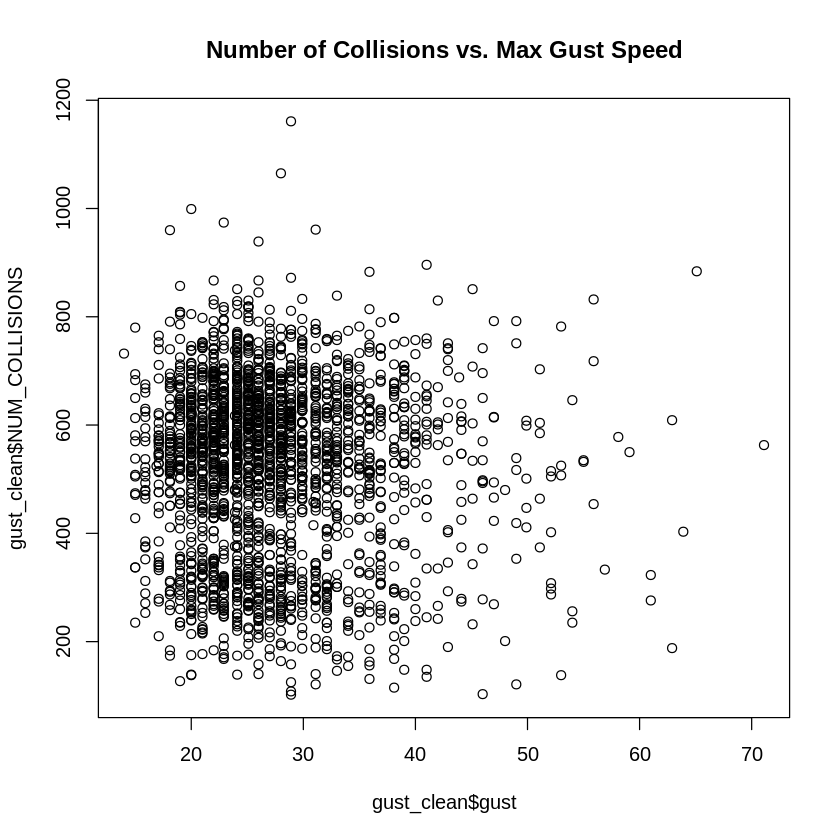

[1] 0.03241491

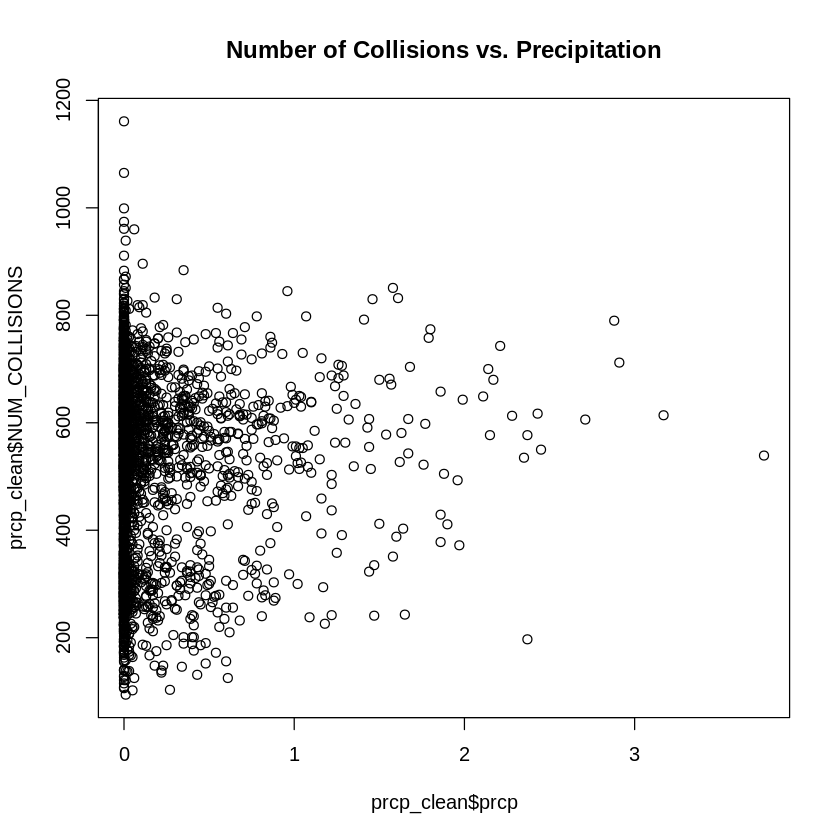

In [53]:
plot(coldata$day, coldata$NUM_COLLISIONS, main="Number of Collisions vs. Day of the week")
plot(coldata$temp, coldata$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(coldata$temp,coldata$NUM_COLLISIONS)
plot(coldata$slp, coldata$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(coldata$slp,coldata$NUM_COLLISIONS)
plot(coldata$visib, coldata$NUM_COLLISIONS, main="Number of Collisions vs. visibility")
cor(coldata$visib,coldata$NUM_COLLISIONS)
plot(coldata$wdsp, coldata$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(coldata$wdsp,coldata$NUM_COLLISIONS)
plot(coldata$max, coldata$NUM_COLLISIONS, main="Number of Collisions vs. Max Temp")
cor(coldata$max,coldata$NUM_COLLISIONS)
plot(coldata$min, coldata$NUM_COLLISIONS, main="Number of Collisions vs. Min Temp")
cor(coldata$min,coldata$NUM_COLLISIONS)

plot(dewp_clean$dew, dewp_clean$NUM_COLLISIONS, main="Number of Collisions vs. Dew Point")
cor(dewp_clean$dew, dewp_clean$NUM_COLLISIONS)
plot(mxpsd_clean$mxpsd, mxpsd_clean$NUM_COLLISIONS, main="Number of Collisions vs. Max Sustained Wind Speed")
cor(mxpsd_clean$mxpsd, mxpsd_clean$NUM_COLLISIONS)
plot(gust_clean$gust, gust_clean$NUM_COLLISIONS, main="Number of Collisions vs. Max Gust Speed")
cor(gust_clean$gust, gust_clean$NUM_COLLISIONS)
plot(prcp_clean$prcp, prcp_clean$NUM_COLLISIONS, main="Number of Collisions vs. Precipitation")
cor(prcp_clean$prcp, prcp_clean$NUM_COLLISIONS)

Looking at the dataset as a whole, there is no clear relationsips between weather condition and the number of collisions. 

To rule out the impact of any changes to the way in which data is recorded year on year and velocity of data availble in a particular year, each year must be looked at individually.

REF https://statisticsglobe.com/r-sum-by-group-example 11/09

Year,NoCollisions
<int>,<int>
2012,100545
2013,203734
2014,206033
2015,217694
2016,229831
2017,231007
2018,231563
2019,211486
2020,112911


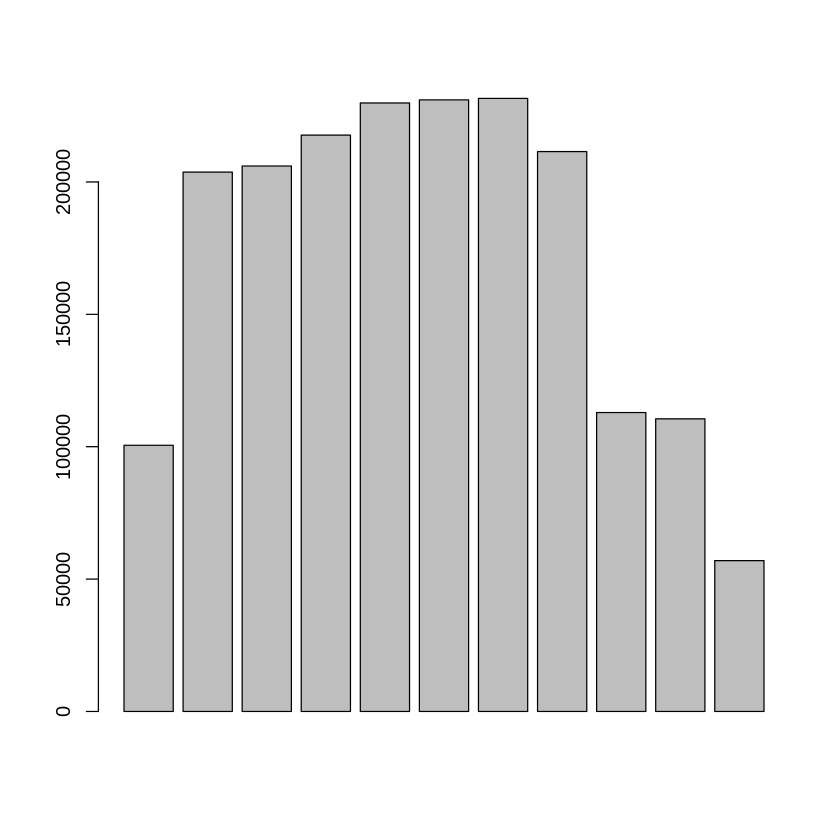

In [54]:
colPerYear <- setNames(aggregate(coldata$NUM_COLLISIONS, by = list(coldata$year), sum), c("Year","NoCollisions"))
colPerYear
barplot(height=colPerYear$NoCollisions, names=colPerYear$year)

In [55]:
cols2012 = coldata[coldata$year == 2012,]
length(cols2012$da)
cols2013 = coldata[coldata$year == 2013,]
length(cols2013$da)
cols2014 = coldata[coldata$year == 2014,]
length(cols2014$da)
cols2015 = coldata[coldata$year == 2015,]
length(cols2015$da)
cols2016 = coldata[coldata$year == 2016,]
length(cols2016$da)
cols2017 = coldata[coldata$year == 2017,]
length(cols2017$da)
cols2018 = coldata[coldata$year == 2018,]
length(cols2018$da)
cols2019 = coldata[coldata$year == 2019,]
length(cols2019$da)
cols2020 = coldata[coldata$year == 2020,]
length(cols2020$da)
cols2021 = coldata[coldata$year == 2021,]
length(cols2021$da)
cols2022 = coldata[coldata$year == 2022,]
length(cols2022$da)

[1] 184

[1] 365

[1] 365

[1] 365

[1] 366

[1] 365

[1] 365

[1] 365

[1] 366

[1] 365

[1] 203

The datasets for 2012 and 2022 are both incomplete therefore will skew analysis. This accounts for the lower number of collisions in 2012 and 2022.



###2012


[1] 0.1004133

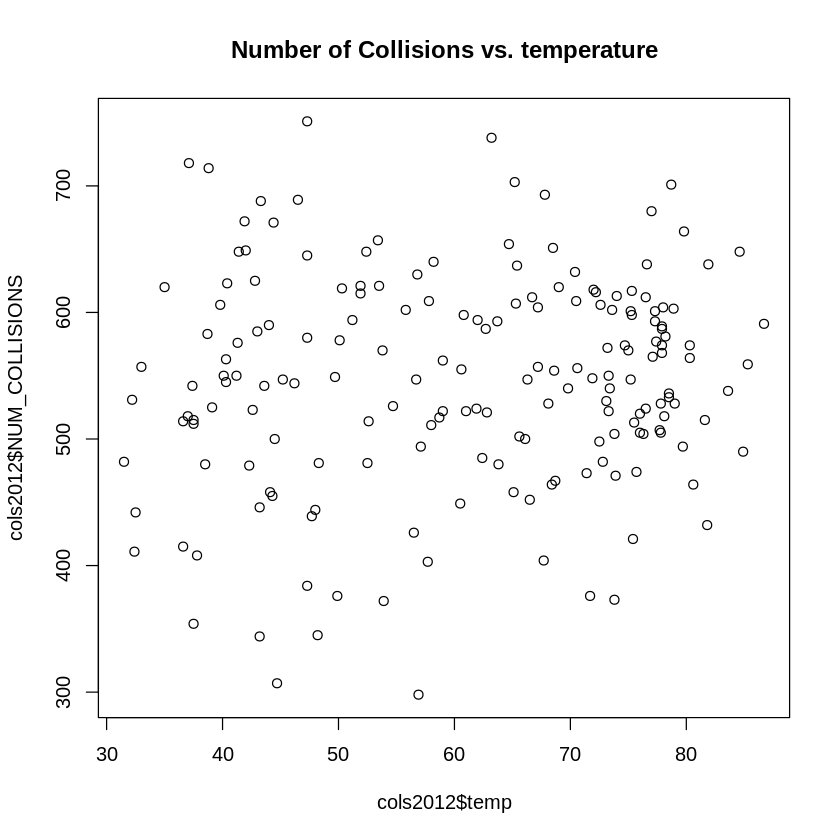

[1] 0.1006114

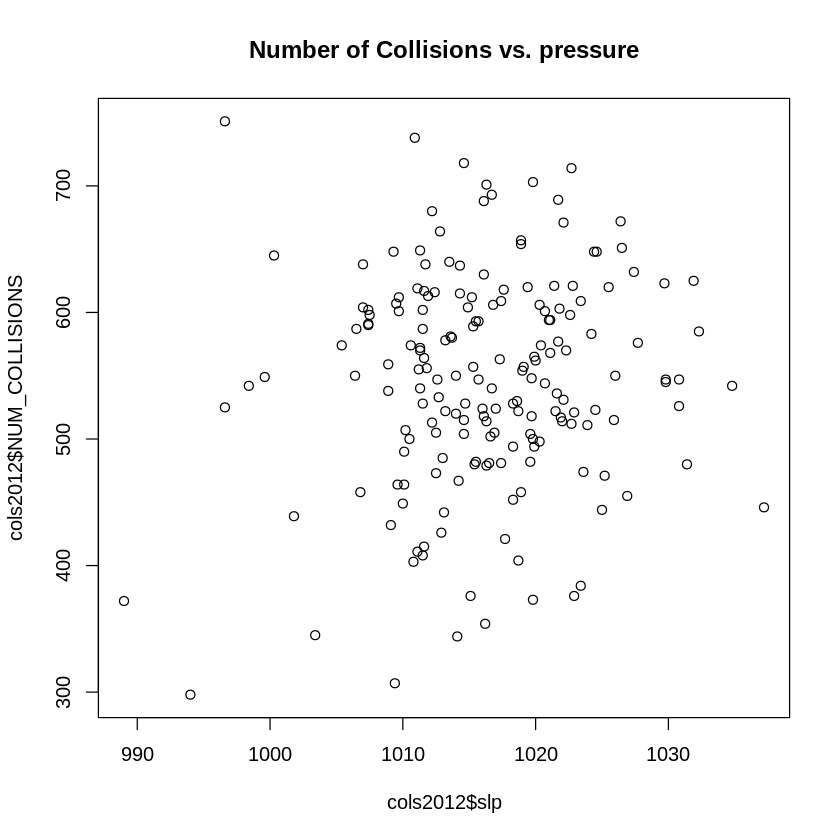

[1] -0.1124835

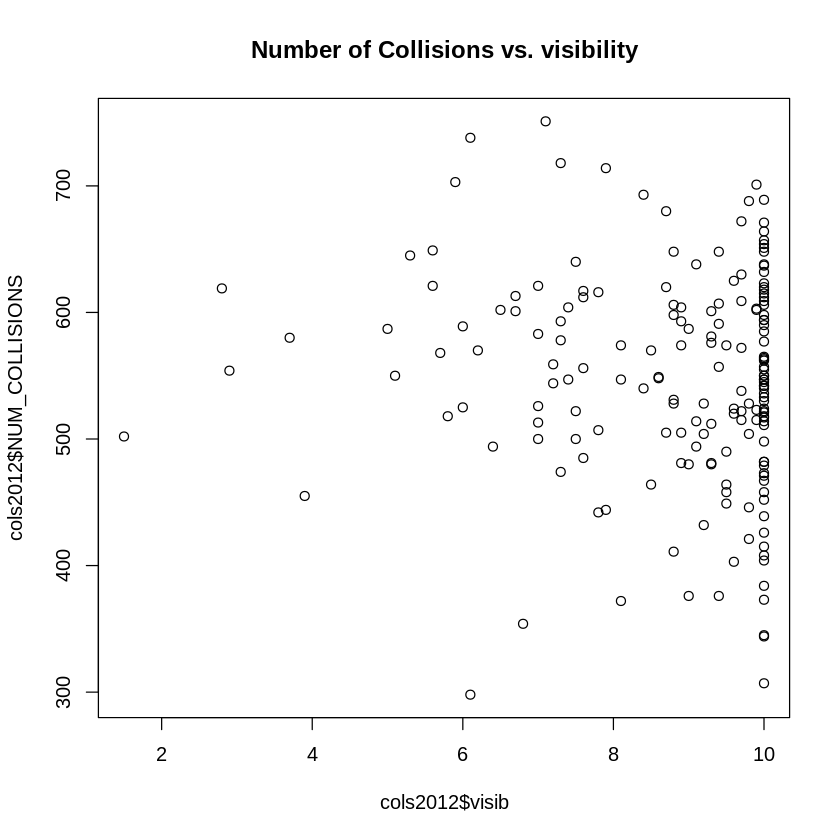

[1] -0.1140553

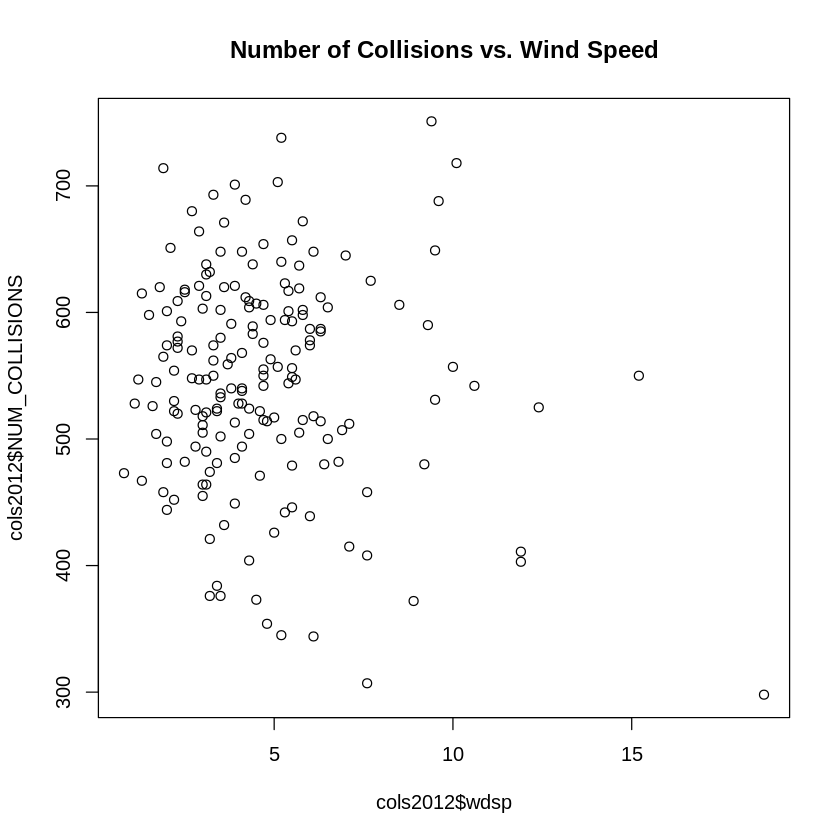

[1] 0.1099845

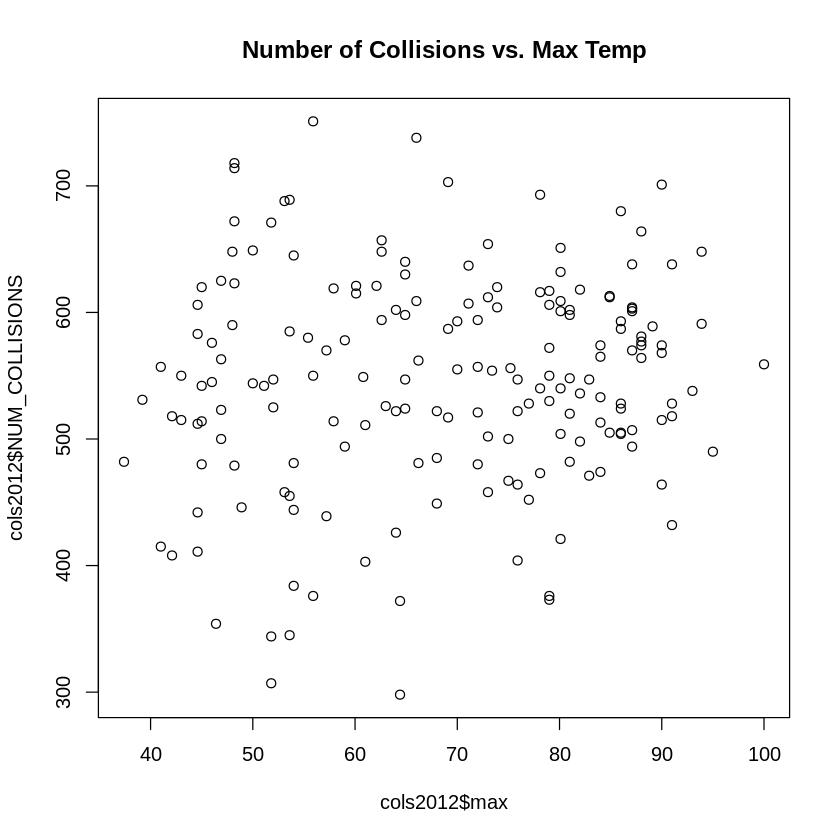

[1] 0.06080194

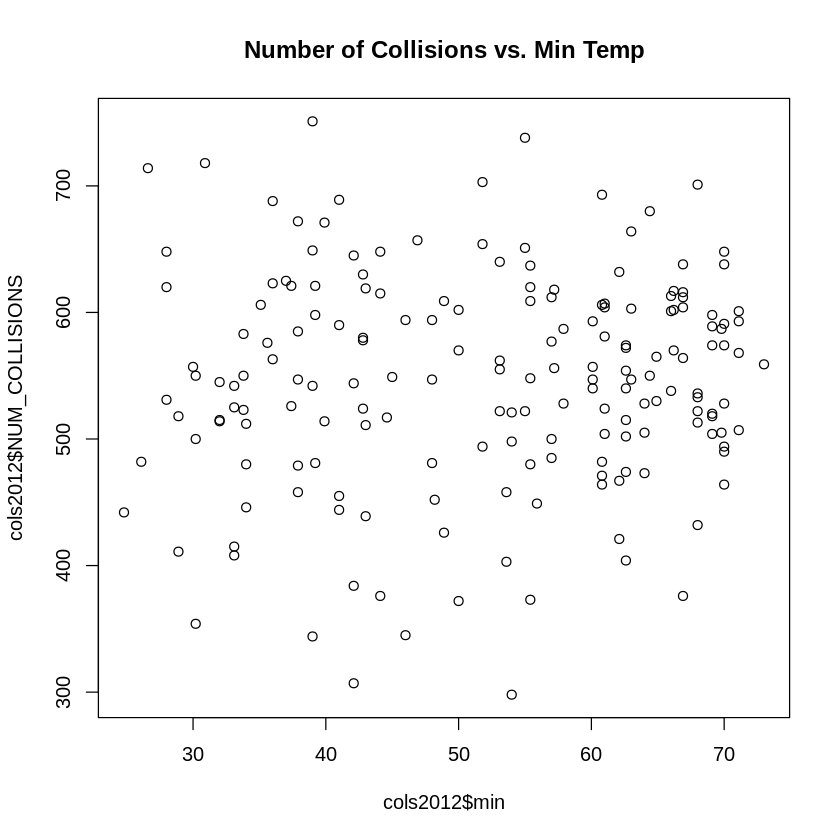

In [56]:
plot(cols2012$temp, cols2012$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2012$temp,cols2012$NUM_COLLISIONS)
plot(cols2012$slp, cols2012$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2012$slp,cols2012$NUM_COLLISIONS)
plot(cols2012$visib, cols2012$NUM_COLLISIONS, main="Number of Collisions vs. visibility")
cor(cols2012$visib,cols2012$NUM_COLLISIONS)
plot(cols2012$wdsp, cols2012$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2012$wdsp,cols2012$NUM_COLLISIONS)
plot(cols2012$max, cols2012$NUM_COLLISIONS, main="Number of Collisions vs. Max Temp")
cor(cols2012$max,cols2012$NUM_COLLISIONS)
plot(cols2012$min, cols2012$NUM_COLLISIONS, main="Number of Collisions vs. Min Temp")
cor(cols2012$min,cols2012$NUM_COLLISIONS)

##2013

[1] 0.1981793

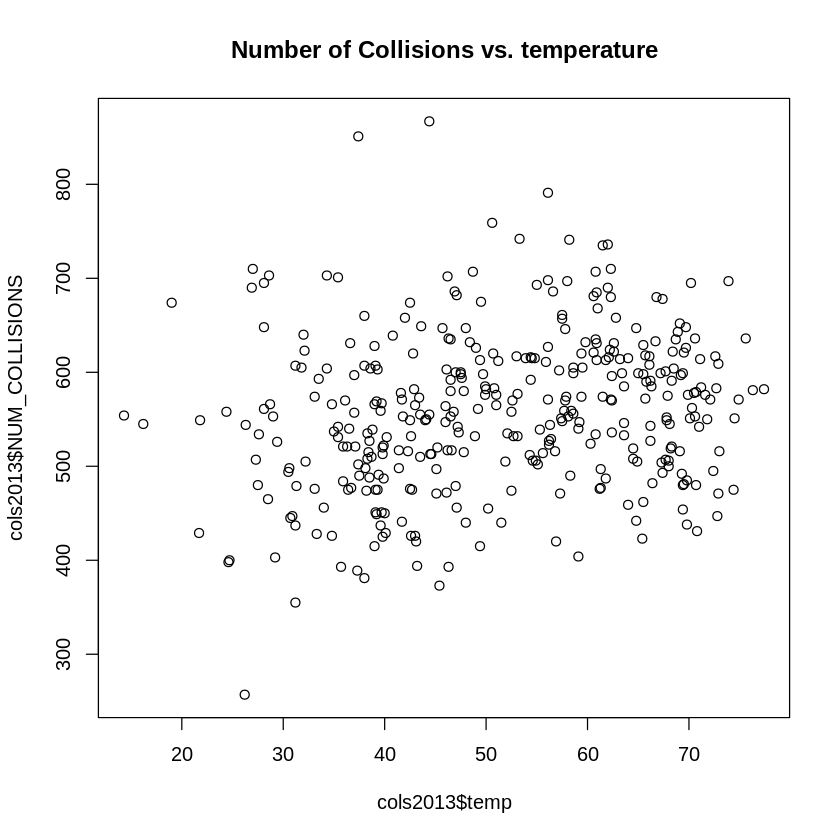

[1] 0.02121662

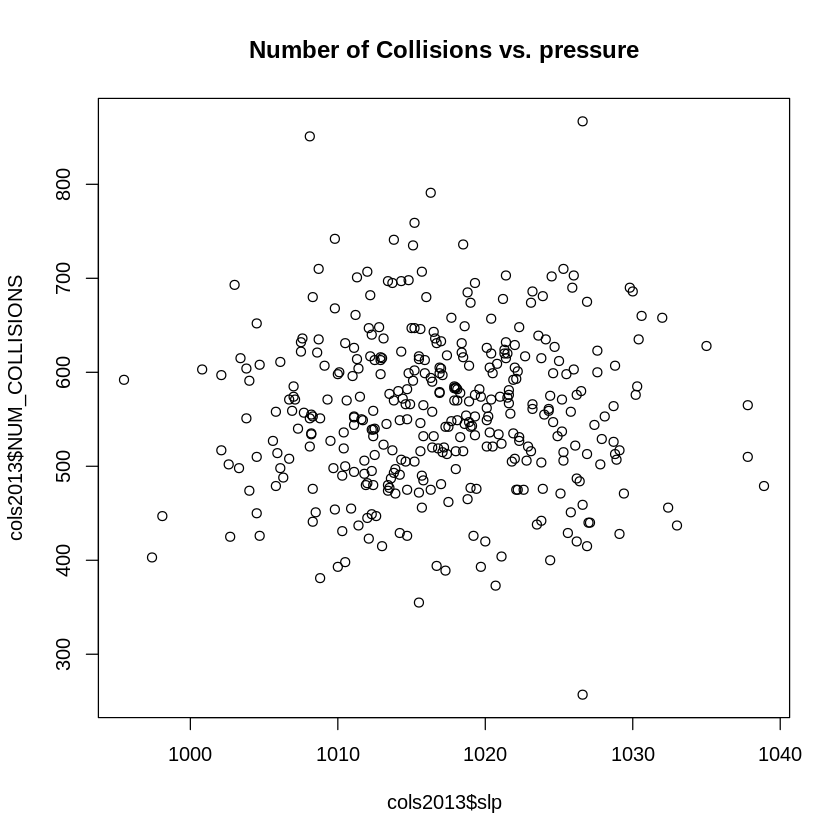

[1] -0.1465263

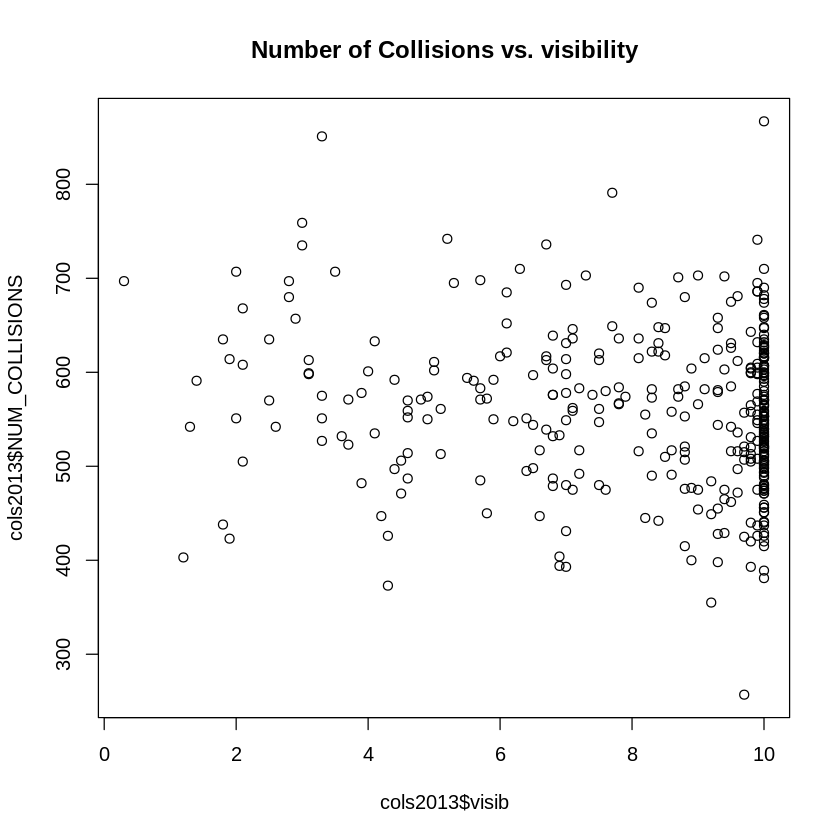

[1] 0.001132197

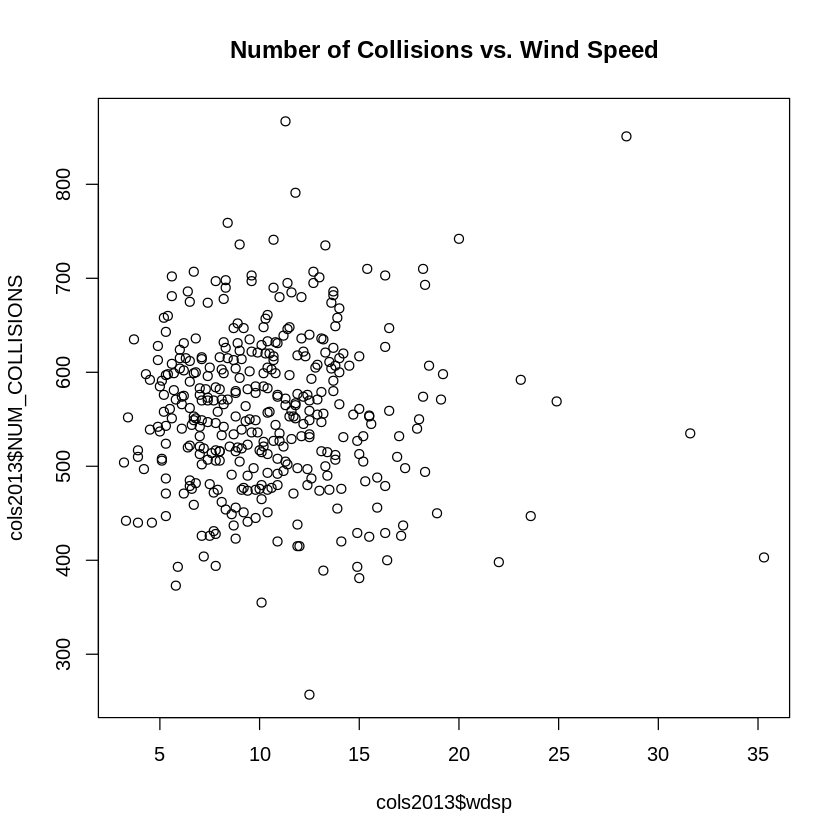

[1] 0.1846251

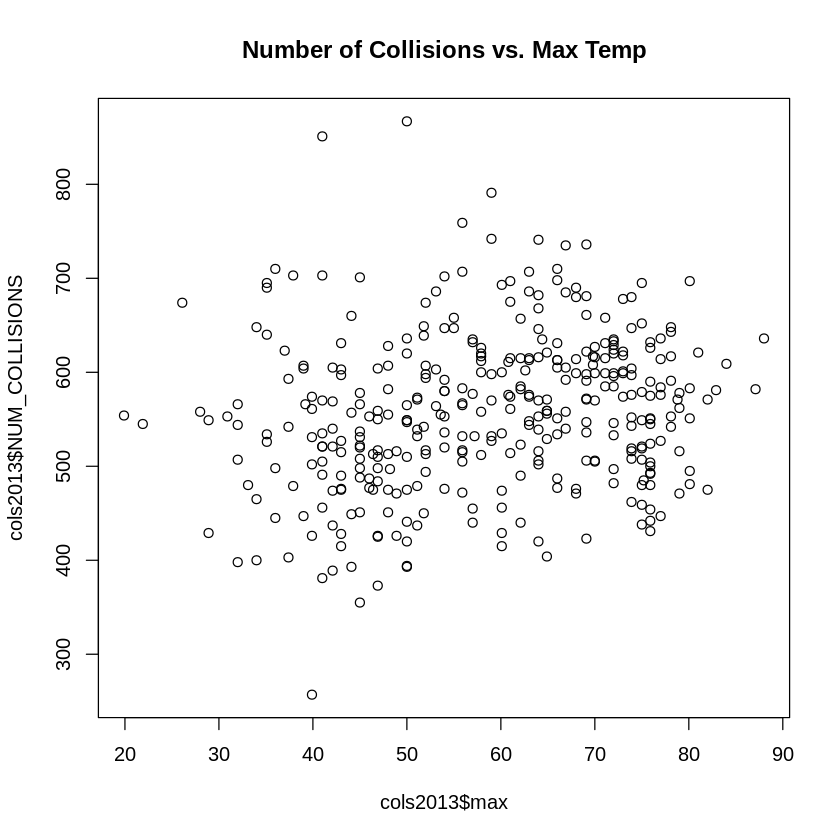

[1] 0.1802012

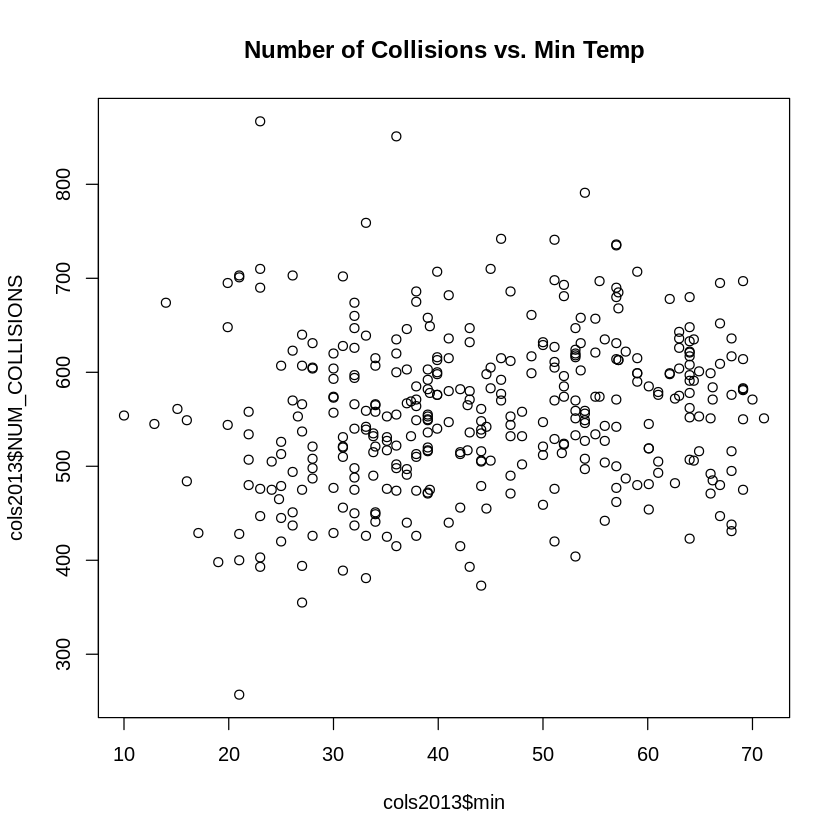

In [57]:
plot(cols2013$temp, cols2013$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2013$temp,cols2013$NUM_COLLISIONS)
plot(cols2013$slp, cols2013$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2013$slp,cols2013$NUM_COLLISIONS)
plot(cols2013$visib, cols2013$NUM_COLLISIONS, main="Number of Collisions vs. visibility")
cor(cols2013$visib,cols2013$NUM_COLLISIONS)
plot(cols2013$wdsp, cols2013$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2013$wdsp,cols2013$NUM_COLLISIONS)
plot(cols2013$max, cols2013$NUM_COLLISIONS, main="Number of Collisions vs. Max Temp")
cor(cols2013$max,cols2013$NUM_COLLISIONS)
plot(cols2013$min, cols2013$NUM_COLLISIONS, main="Number of Collisions vs. Min Temp")
cor(cols2013$min,cols2013$NUM_COLLISIONS)

###2014

[1] 0.1577755

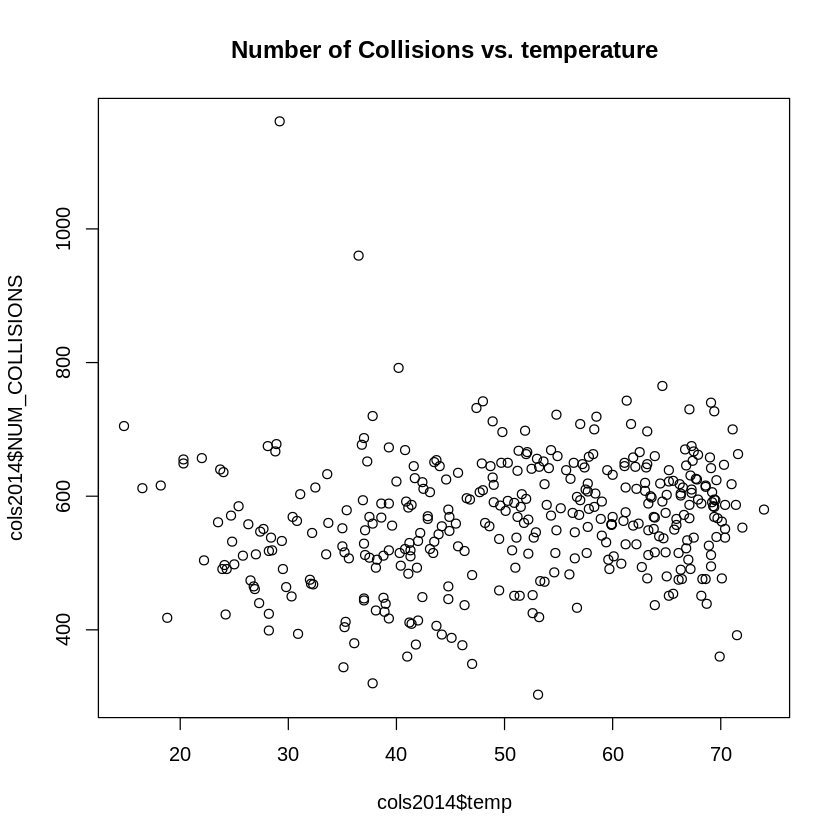

[1] -0.02982472

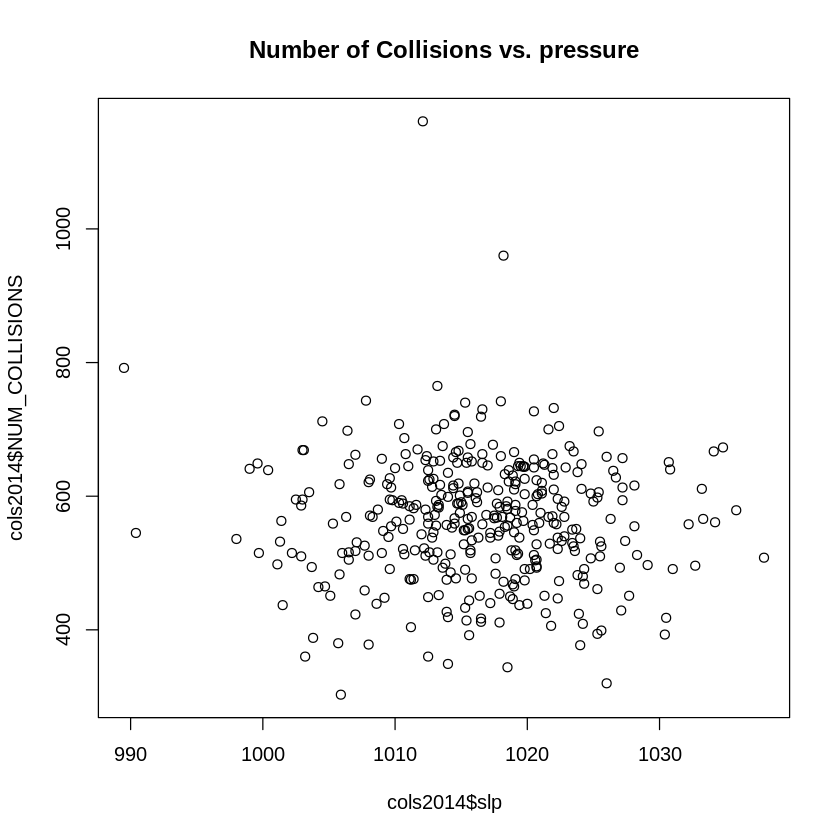

[1] -0.05466283

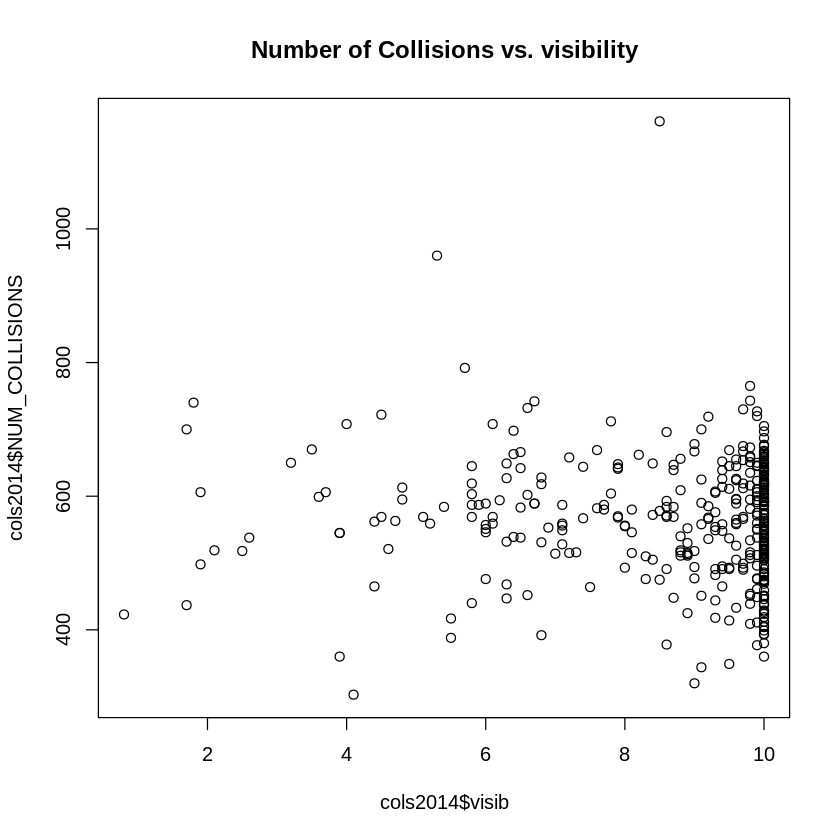

[1] -0.03885164

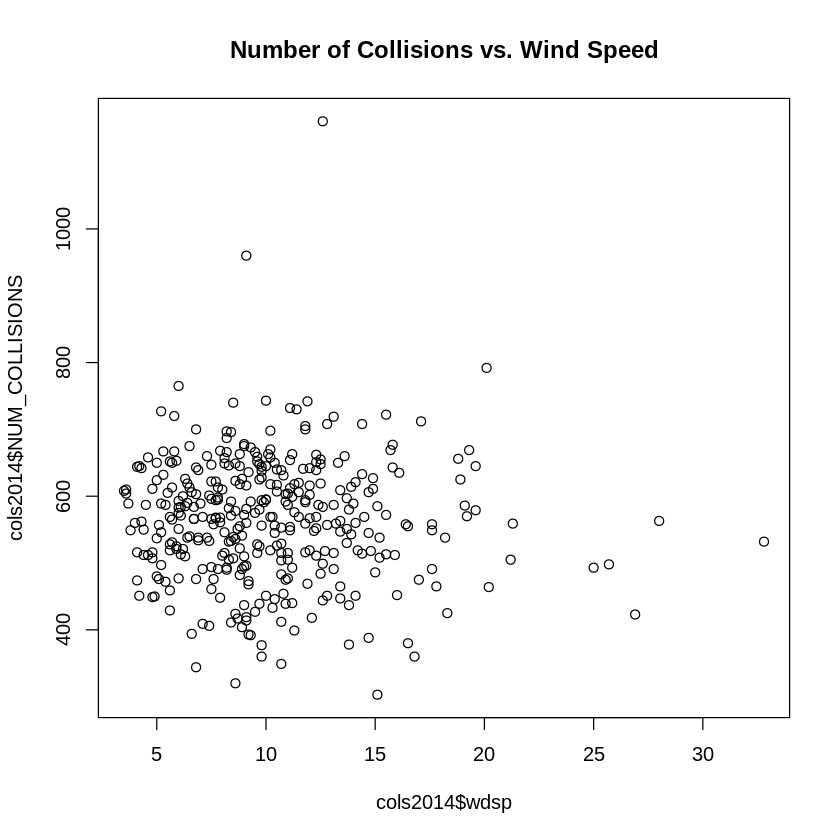

[1] 0.1780214

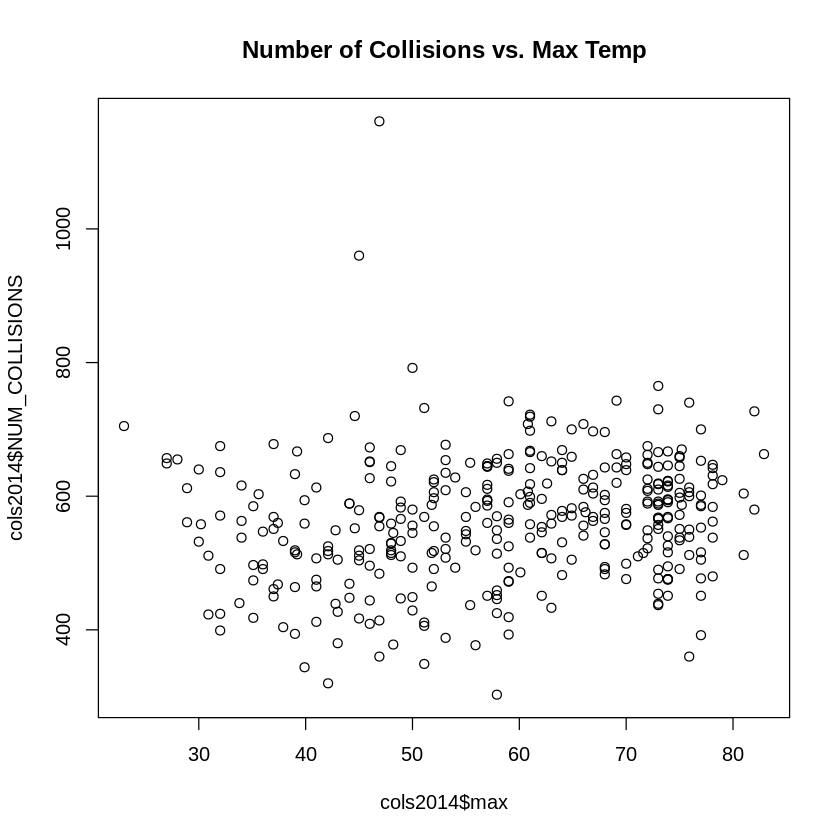

[1] 0.1729896

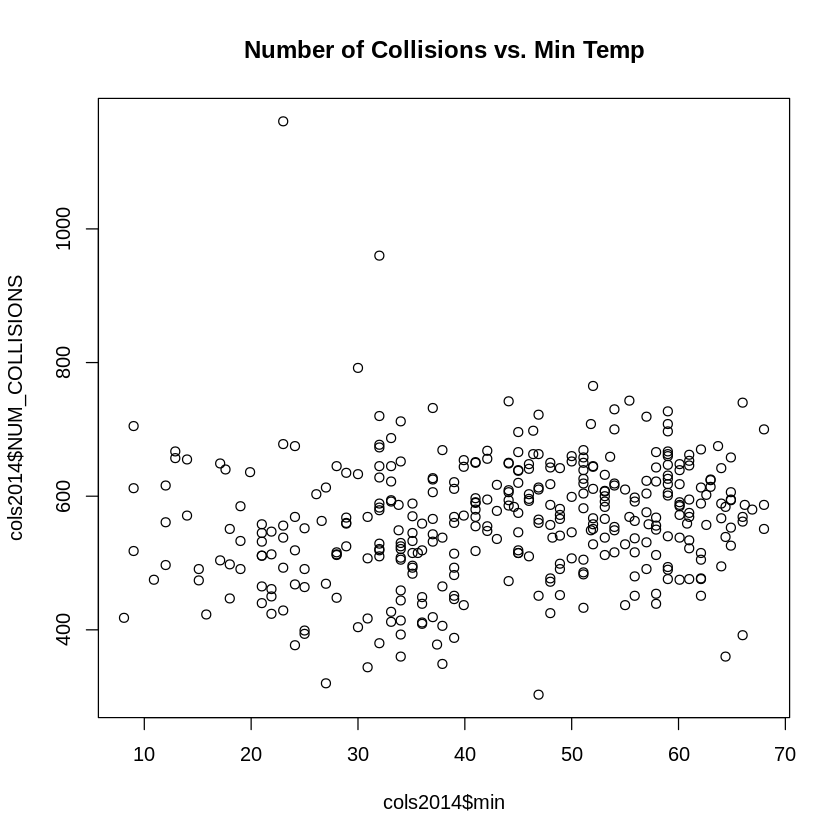

In [58]:
plot(cols2014$temp, cols2014$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2014$temp,cols2014$NUM_COLLISIONS)
plot(cols2014$slp, cols2014$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2014$slp,cols2014$NUM_COLLISIONS)
plot(cols2014$visib, cols2014$NUM_COLLISIONS, main="Number of Collisions vs. visibility")
cor(cols2014$visib,cols2014$NUM_COLLISIONS)
plot(cols2014$wdsp, cols2014$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2014$wdsp,cols2014$NUM_COLLISIONS)
plot(cols2014$max, cols2014$NUM_COLLISIONS, main="Number of Collisions vs. Max Temp")
cor(cols2014$max,cols2014$NUM_COLLISIONS)
plot(cols2014$min, cols2014$NUM_COLLISIONS, main="Number of Collisions vs. Min Temp")
cor(cols2014$min,cols2014$NUM_COLLISIONS)

###2015

[1] 0.2482423

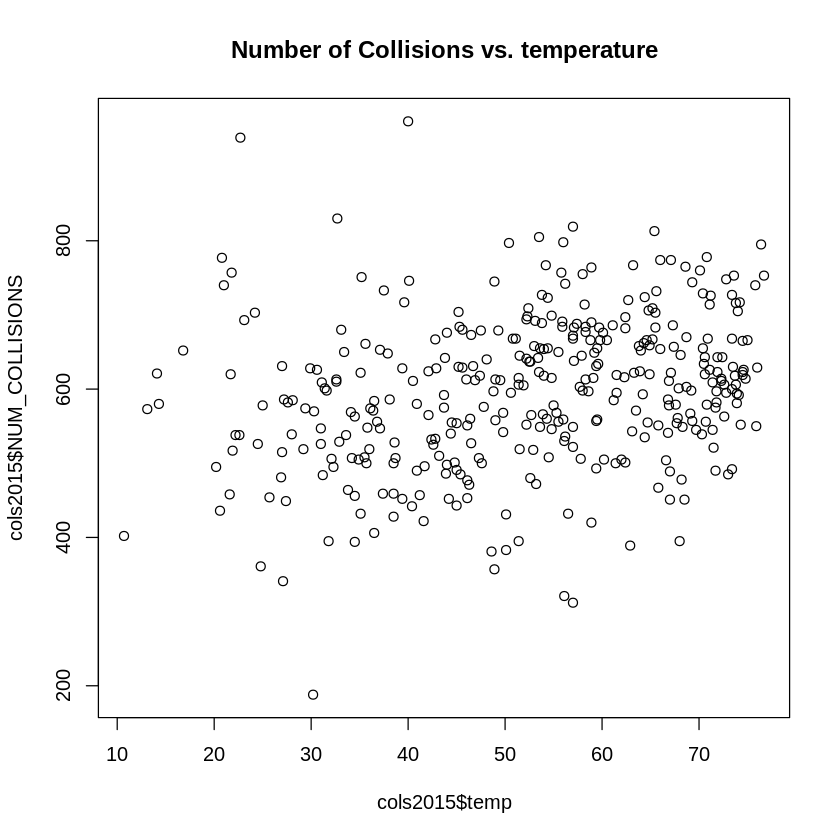

[1] -0.03588087

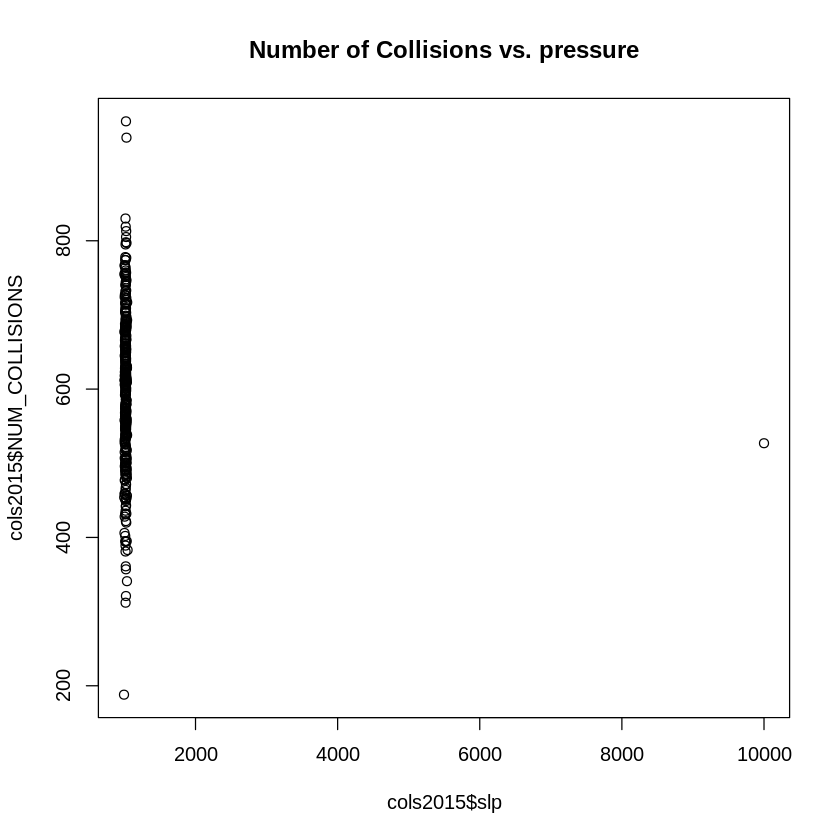

[1] -0.007399972

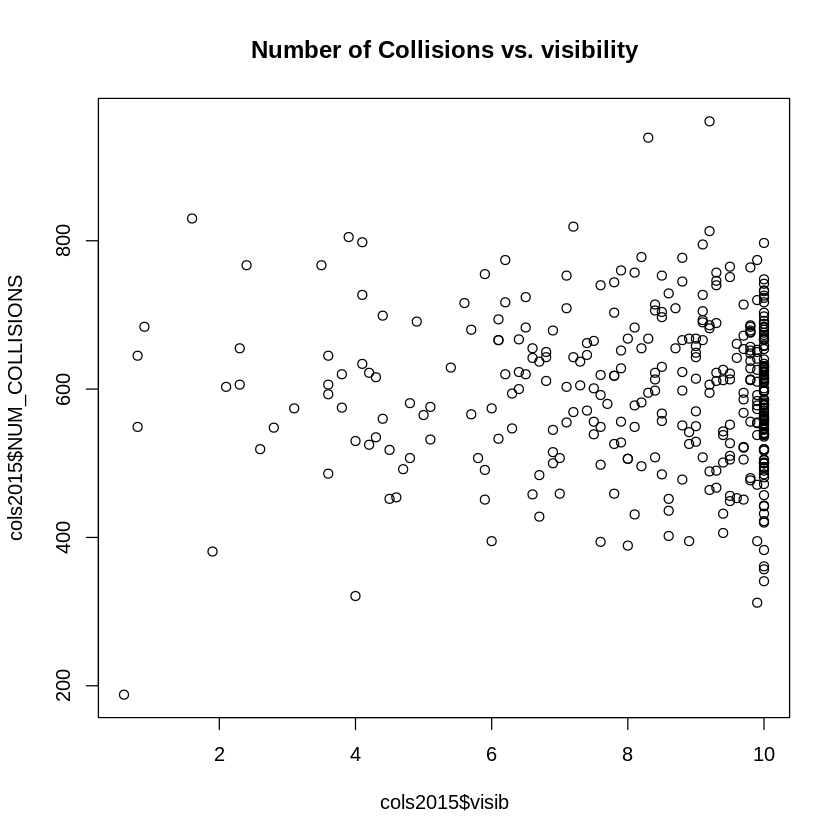

[1] -0.1029442

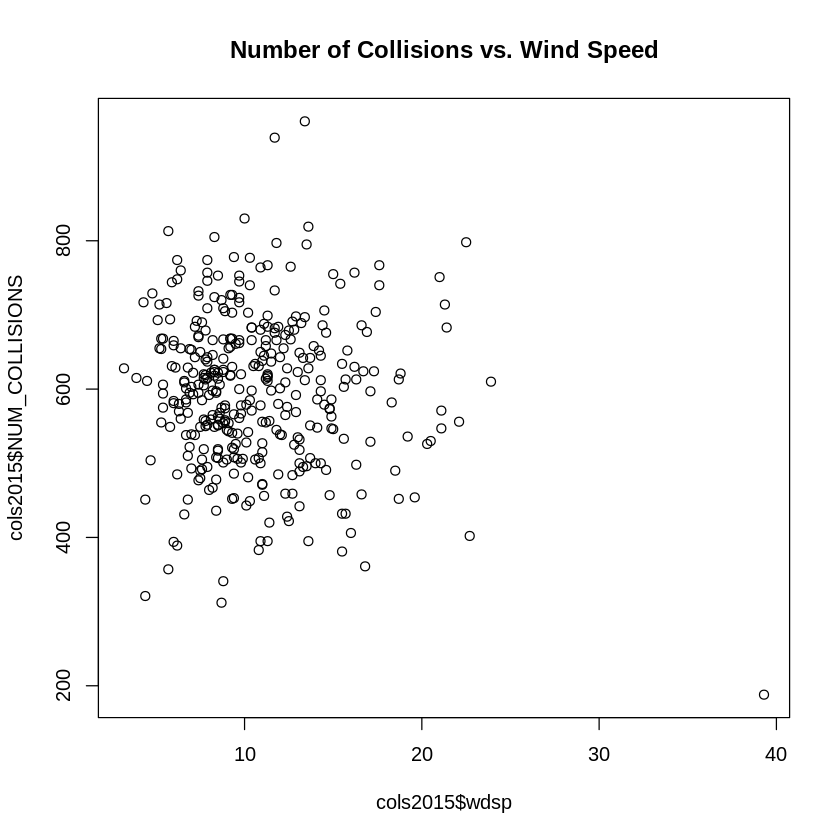

[1] 0.2520379

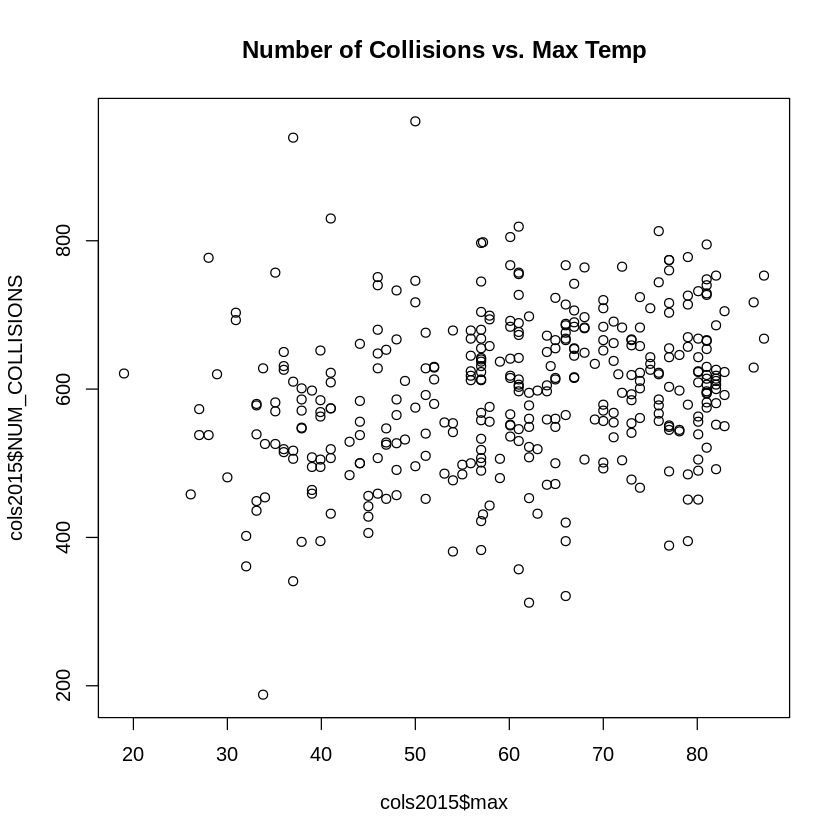

[1] 0.2328649

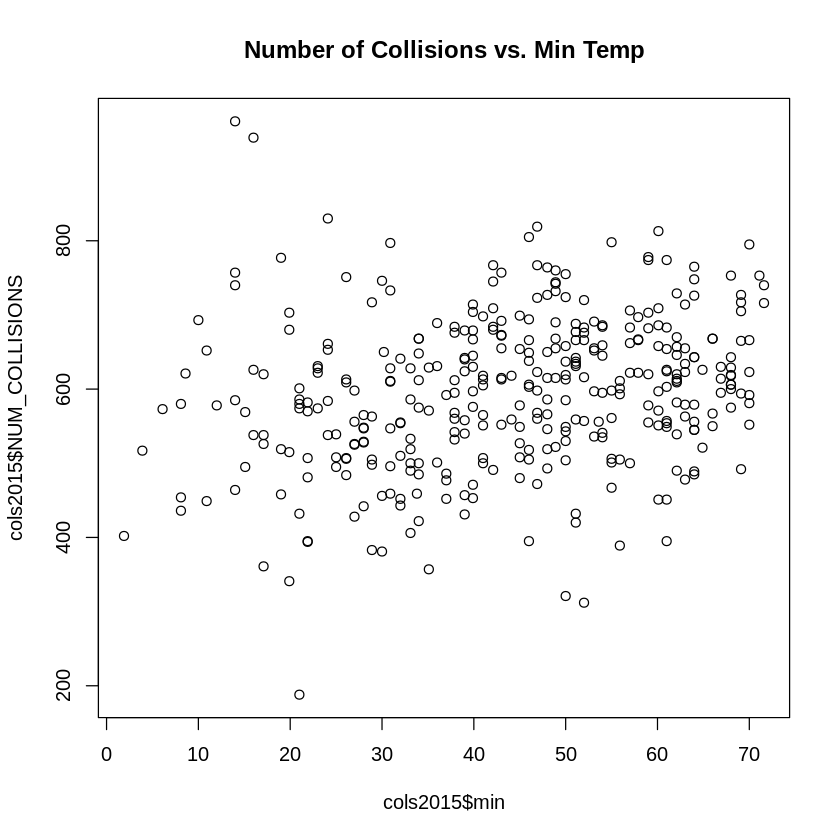

In [59]:
plot(cols2015$temp, cols2015$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2015$temp,cols2015$NUM_COLLISIONS)
plot(cols2015$slp, cols2015$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2015$slp,cols2015$NUM_COLLISIONS)
plot(cols2015$visib, cols2015$NUM_COLLISIONS, main="Number of Collisions vs. visibility")
cor(cols2015$visib,cols2015$NUM_COLLISIONS)
plot(cols2015$wdsp, cols2015$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2015$wdsp,cols2015$NUM_COLLISIONS)
plot(cols2015$max, cols2015$NUM_COLLISIONS, main="Number of Collisions vs. Max Temp")
cor(cols2015$max,cols2015$NUM_COLLISIONS)
plot(cols2015$min, cols2015$NUM_COLLISIONS, main="Number of Collisions vs. Min Temp")
cor(cols2015$min,cols2015$NUM_COLLISIONS)

###2016

[1] 0.2648438

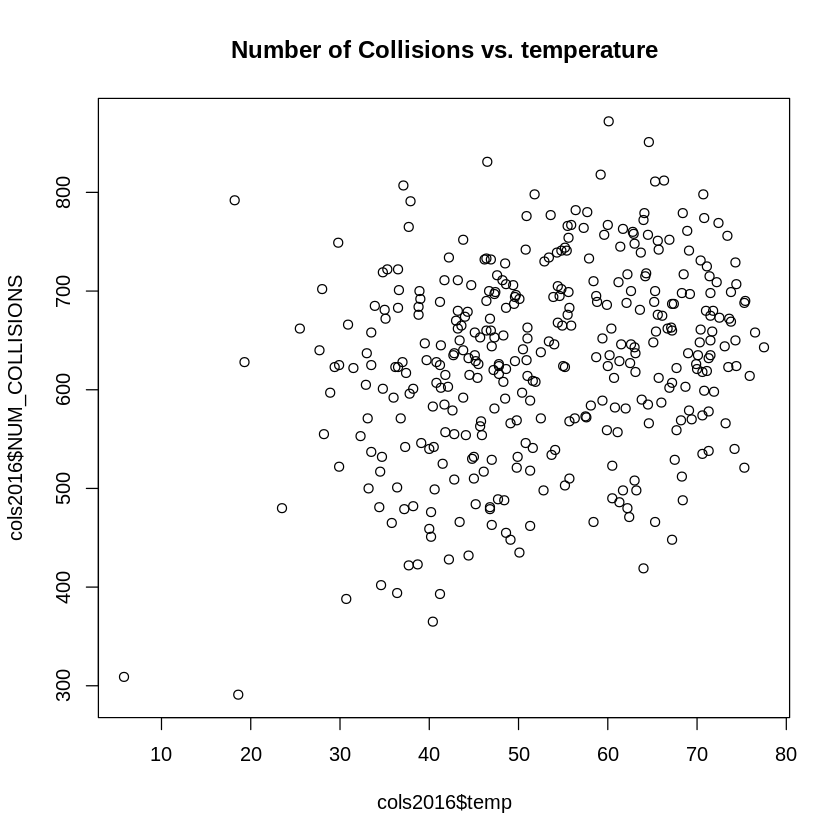

[1] -0.02305999

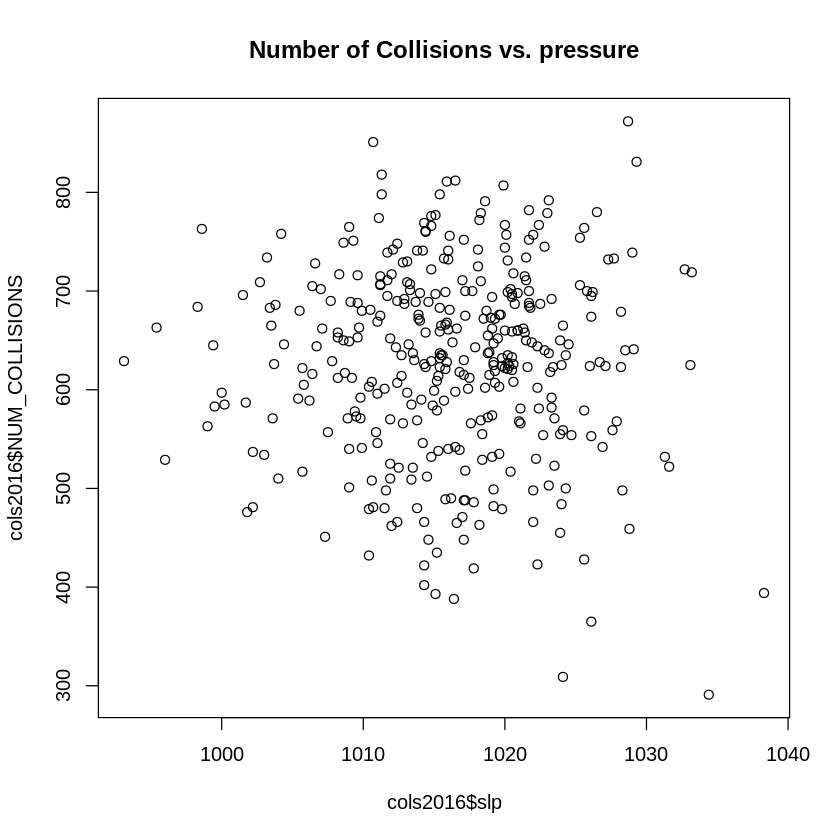

[1] 0.0112473

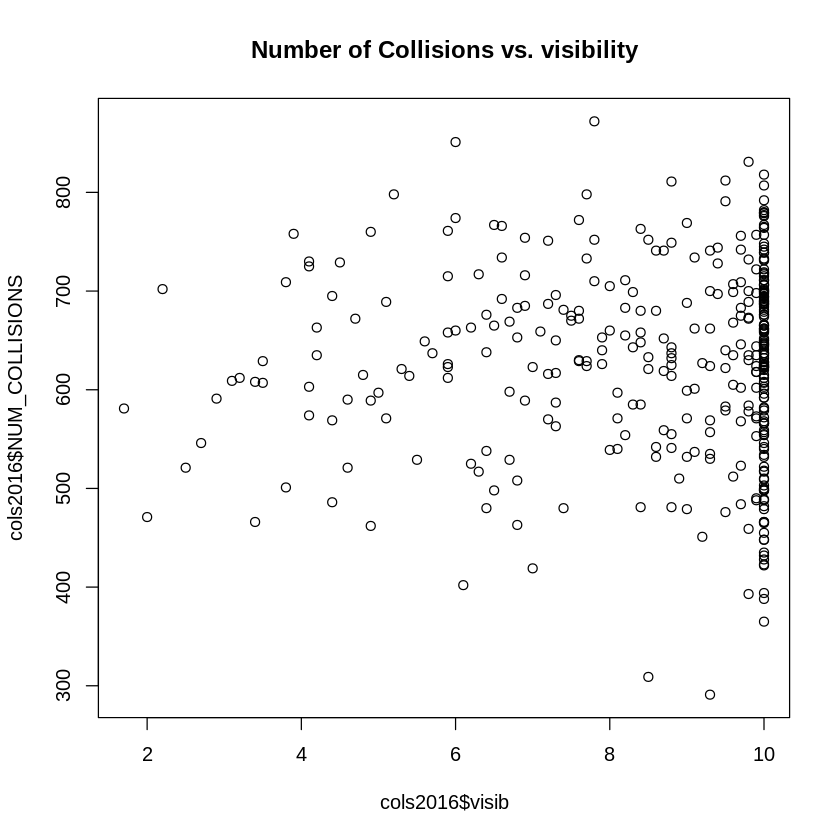

[1] -0.07836416

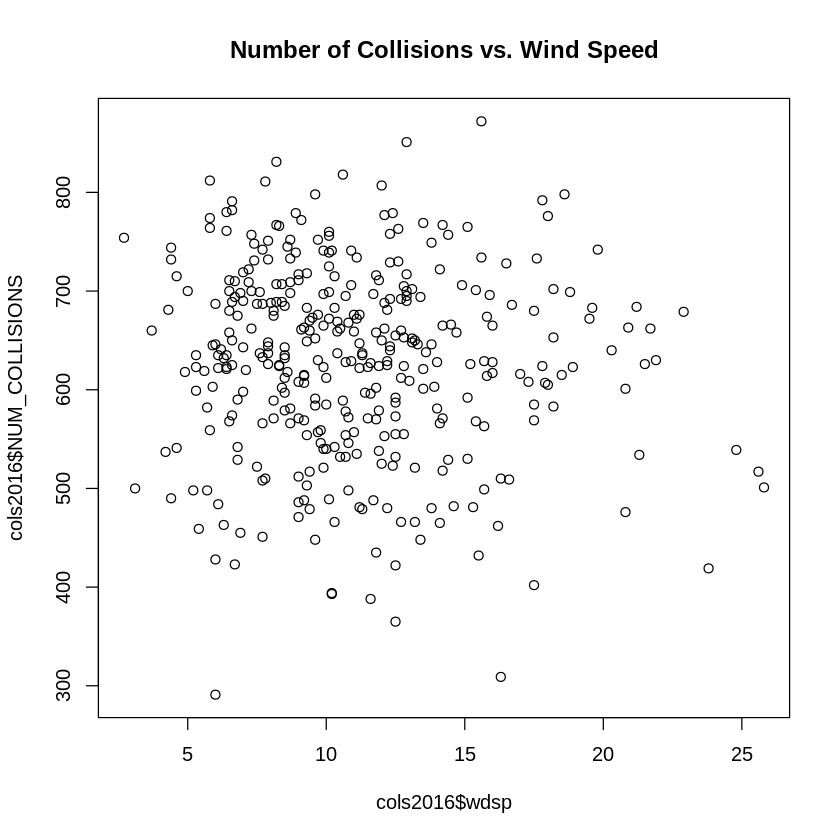

[1] 0.2569682

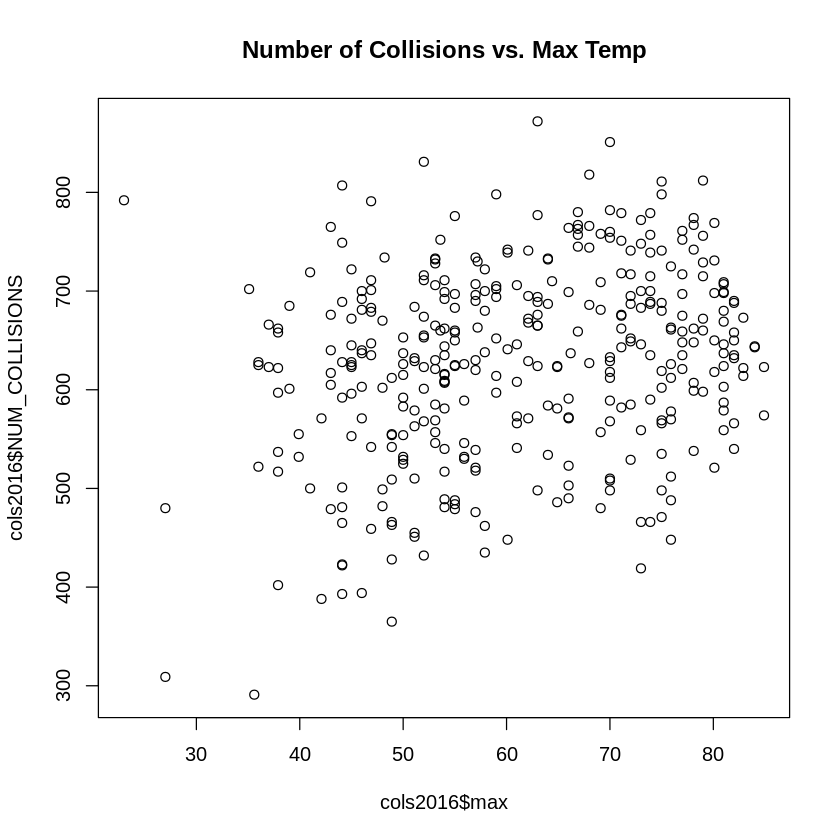

[1] 0.25261

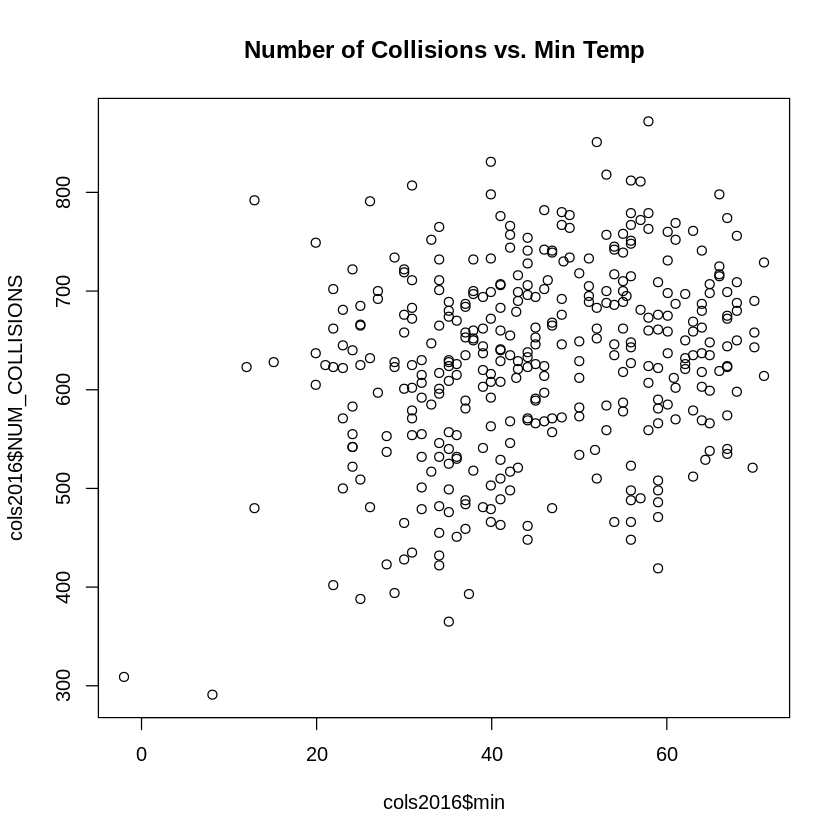

In [60]:
plot(cols2016$temp, cols2016$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2016$temp,cols2016$NUM_COLLISIONS)
plot(cols2016$slp, cols2016$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2016$slp,cols2016$NUM_COLLISIONS)
plot(cols2016$visib, cols2016$NUM_COLLISIONS, main="Number of Collisions vs. visibility")
cor(cols2016$visib,cols2016$NUM_COLLISIONS)
plot(cols2016$wdsp, cols2016$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2016$wdsp,cols2016$NUM_COLLISIONS)
plot(cols2016$max, cols2016$NUM_COLLISIONS, main="Number of Collisions vs. Max Temp")
cor(cols2016$max,cols2016$NUM_COLLISIONS)
plot(cols2016$min, cols2016$NUM_COLLISIONS, main="Number of Collisions vs. Min Temp")
cor(cols2016$min,cols2016$NUM_COLLISIONS)

###2017

[1] 0.2073396

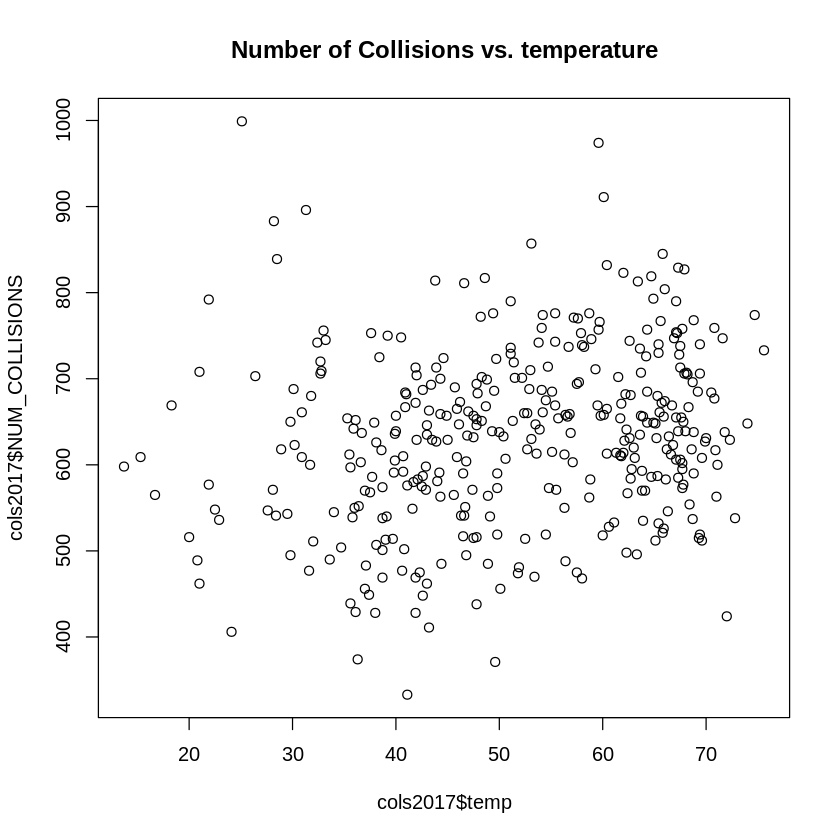

[1] -0.06928943

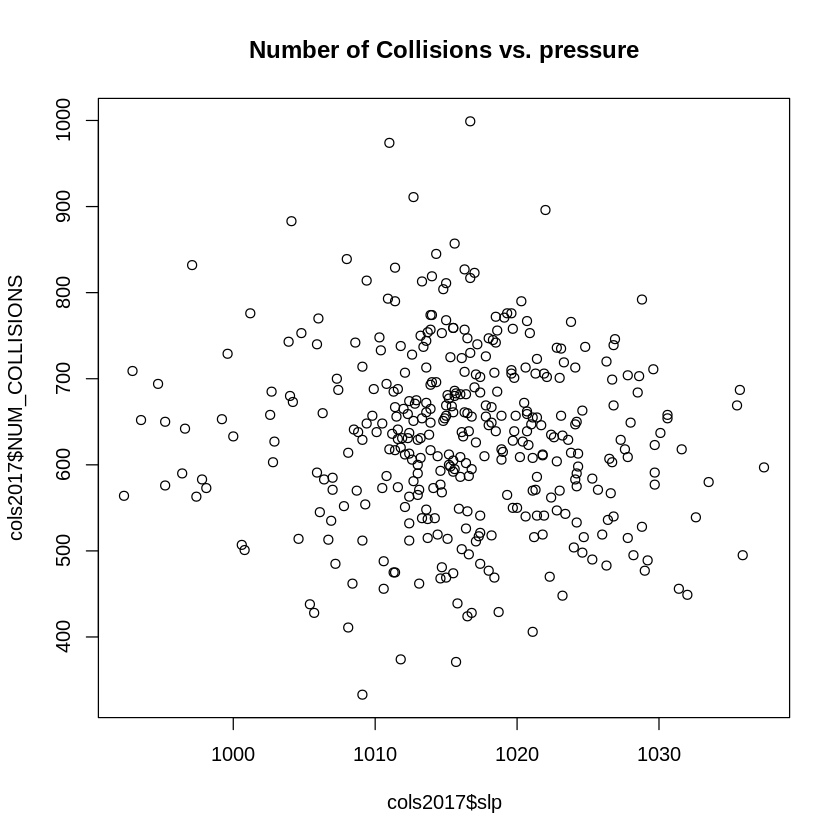

[1] -0.07451094

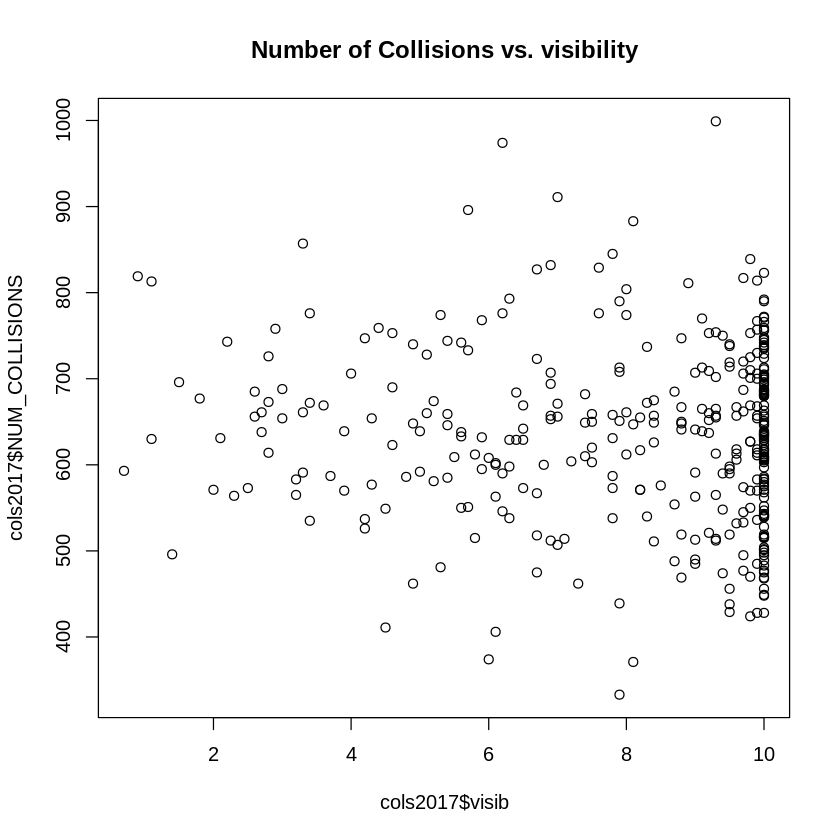

[1] 0.00987308

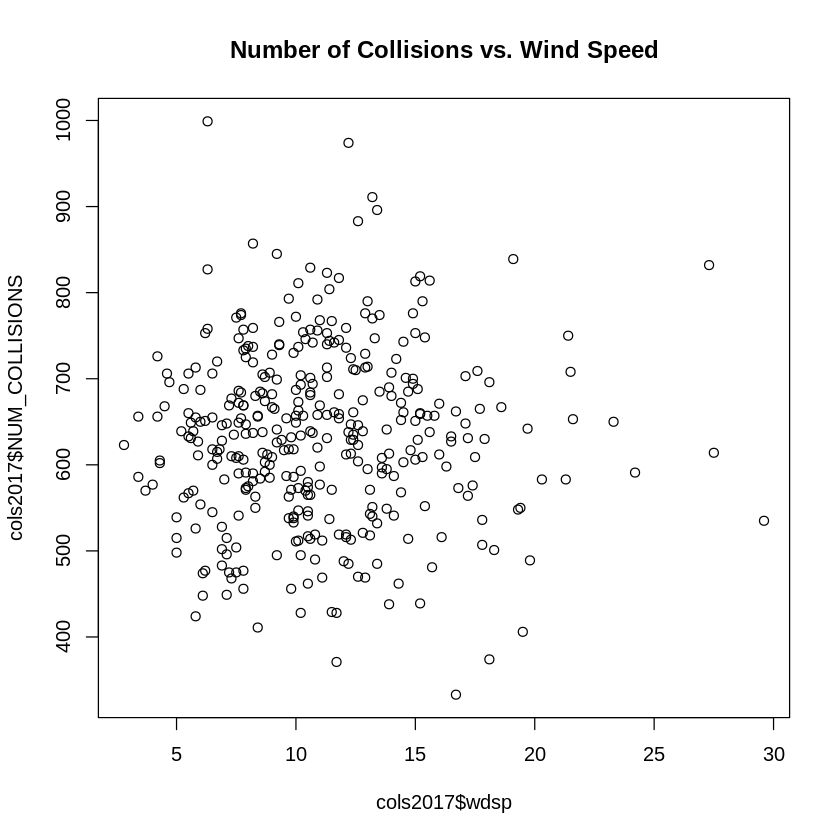

[1] 0.1881306

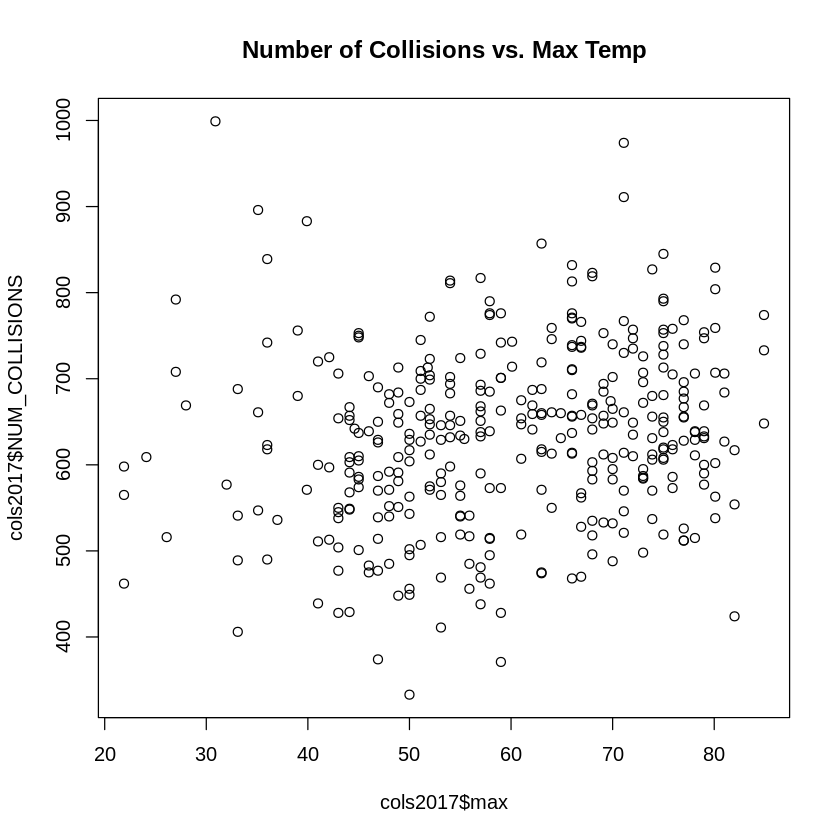

[1] 0.2204531

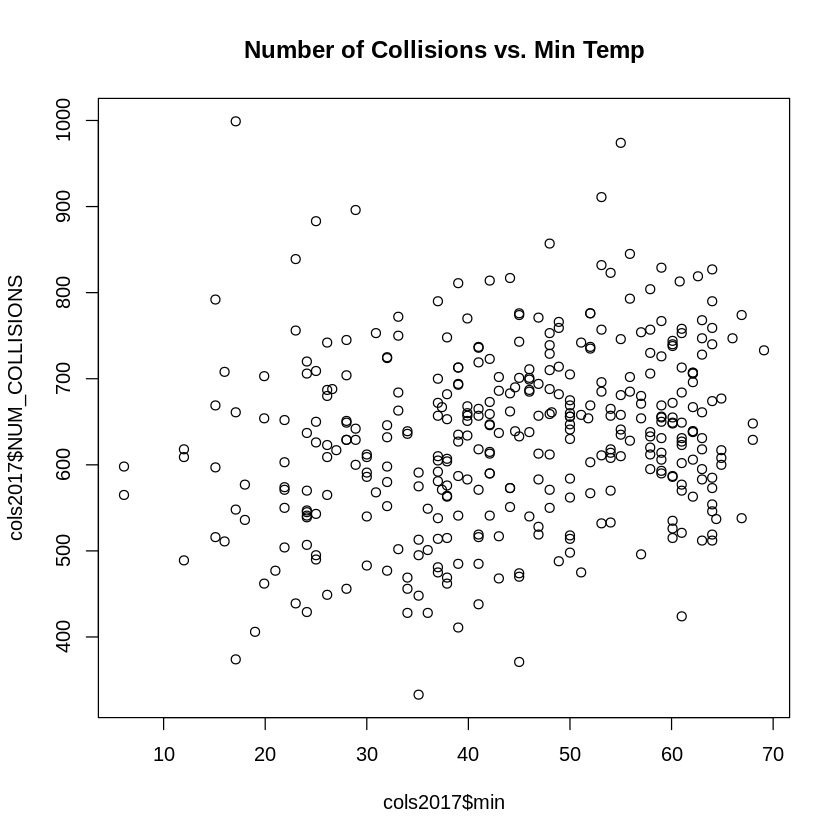

In [61]:
plot(cols2017$temp, cols2017$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2017$temp,cols2017$NUM_COLLISIONS)
plot(cols2017$slp, cols2017$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2017$slp,cols2017$NUM_COLLISIONS)
plot(cols2017$visib, cols2017$NUM_COLLISIONS, main="Number of Collisions vs. visibility")
cor(cols2017$visib,cols2017$NUM_COLLISIONS)
plot(cols2017$wdsp, cols2017$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2017$wdsp,cols2017$NUM_COLLISIONS)
plot(cols2017$max, cols2017$NUM_COLLISIONS, main="Number of Collisions vs. Max Temp")
cor(cols2017$max,cols2017$NUM_COLLISIONS)
plot(cols2017$min, cols2017$NUM_COLLISIONS, main="Number of Collisions vs. Min Temp")
cor(cols2017$min,cols2017$NUM_COLLISIONS)

###2018

[1] 0.2273406

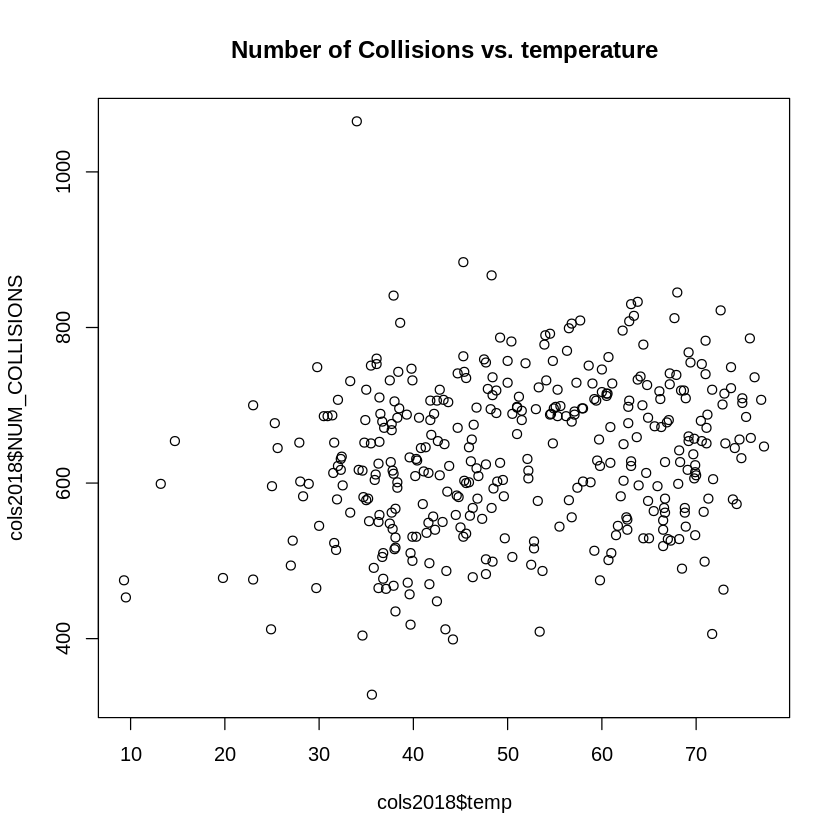

[1] -0.1536497

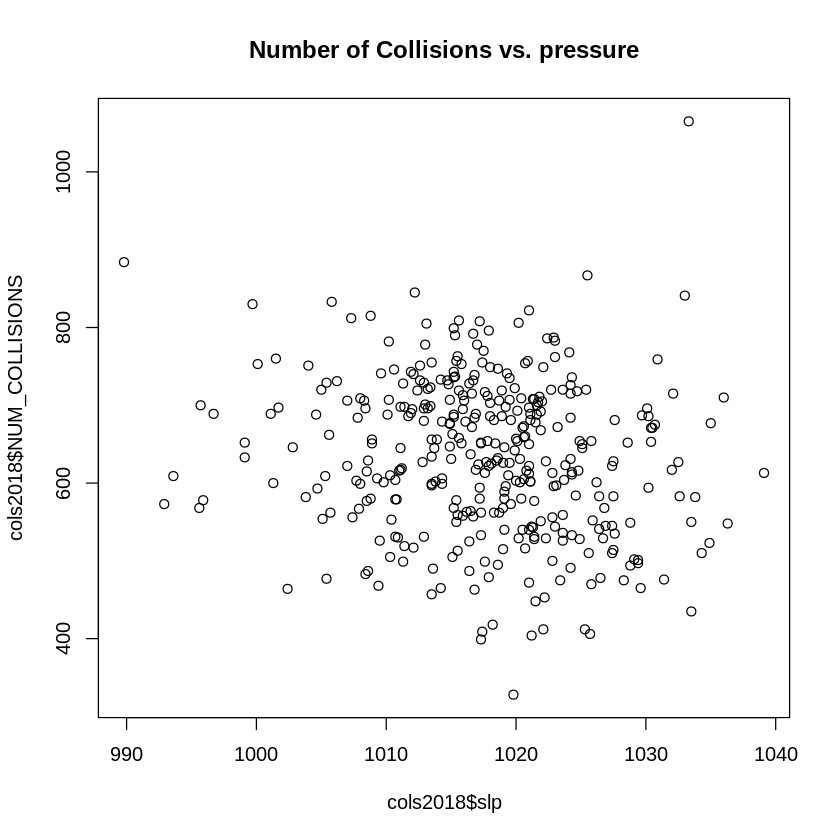

[1] -0.1012374

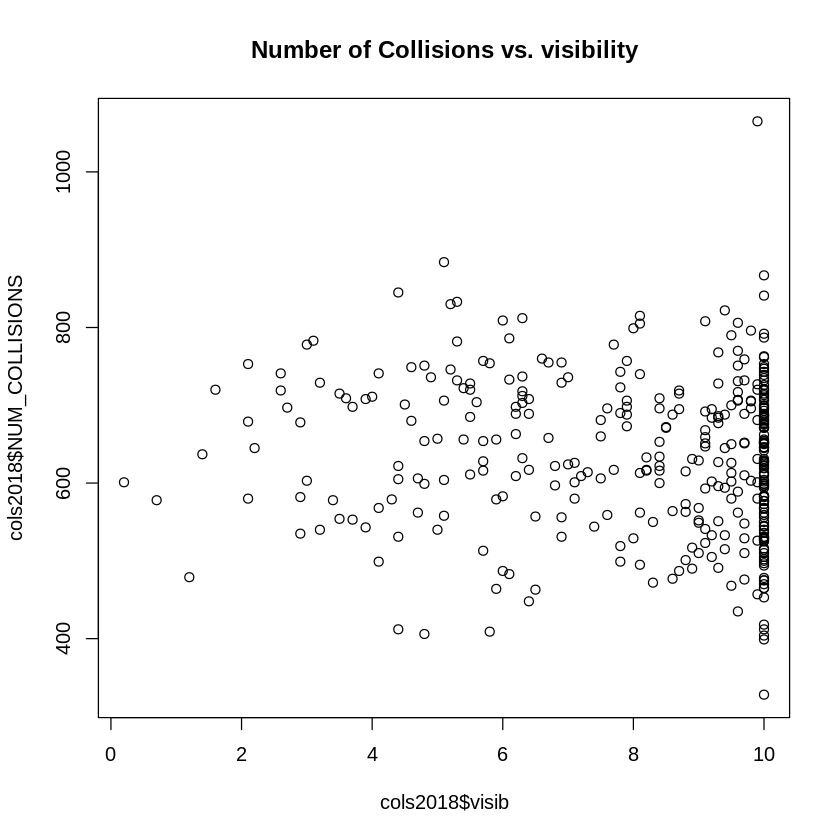

[1] -0.04627451

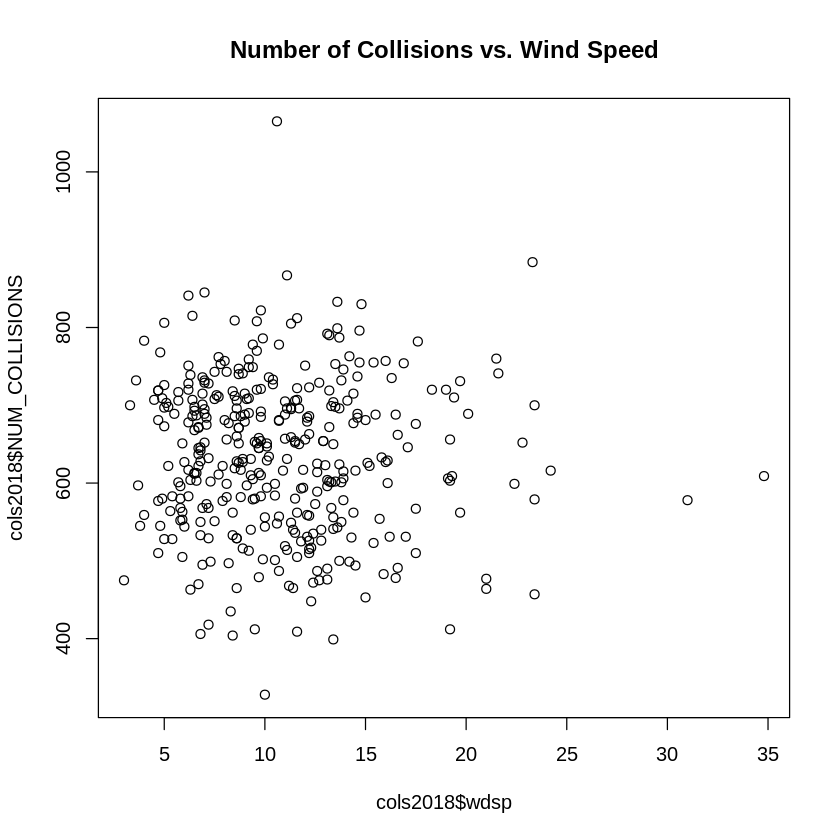

[1] 0.2257656

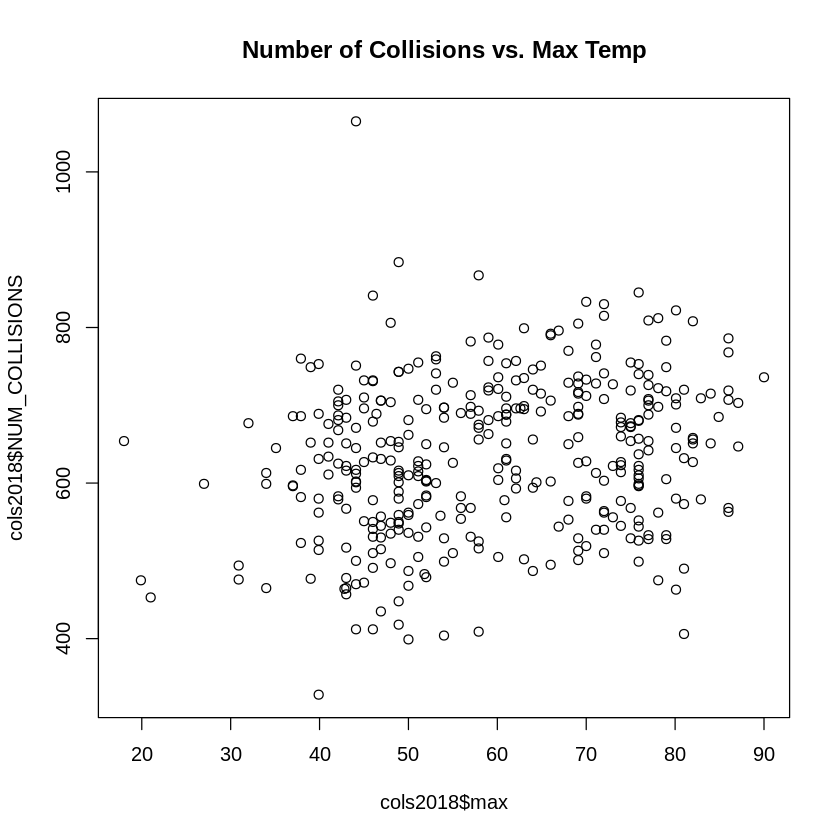

[1] 0.2193521

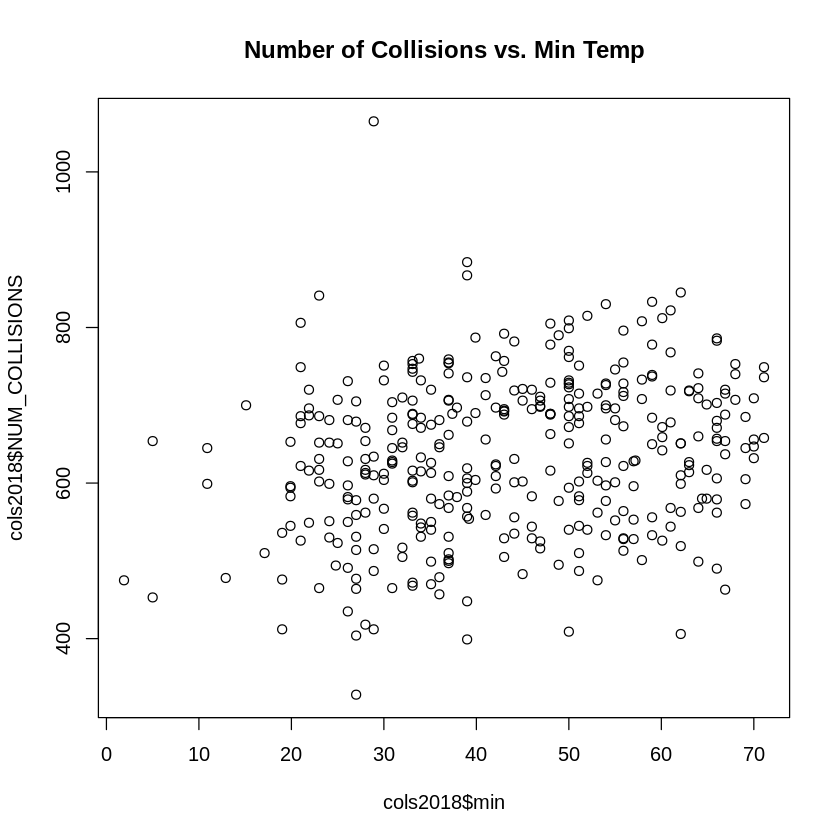

In [62]:
plot(cols2018$temp, cols2018$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2018$temp,cols2018$NUM_COLLISIONS)
plot(cols2018$slp, cols2018$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2018$slp,cols2018$NUM_COLLISIONS)
plot(cols2018$visib, cols2018$NUM_COLLISIONS, main="Number of Collisions vs. visibility")
cor(cols2018$visib,cols2018$NUM_COLLISIONS)
plot(cols2018$wdsp, cols2018$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2018$wdsp,cols2018$NUM_COLLISIONS)
plot(cols2018$max, cols2018$NUM_COLLISIONS, main="Number of Collisions vs. Max Temp")
cor(cols2018$max,cols2018$NUM_COLLISIONS)
plot(cols2018$min, cols2018$NUM_COLLISIONS, main="Number of Collisions vs. Min Temp")
cor(cols2018$min,cols2018$NUM_COLLISIONS)

###2019

[1] 0.1329058

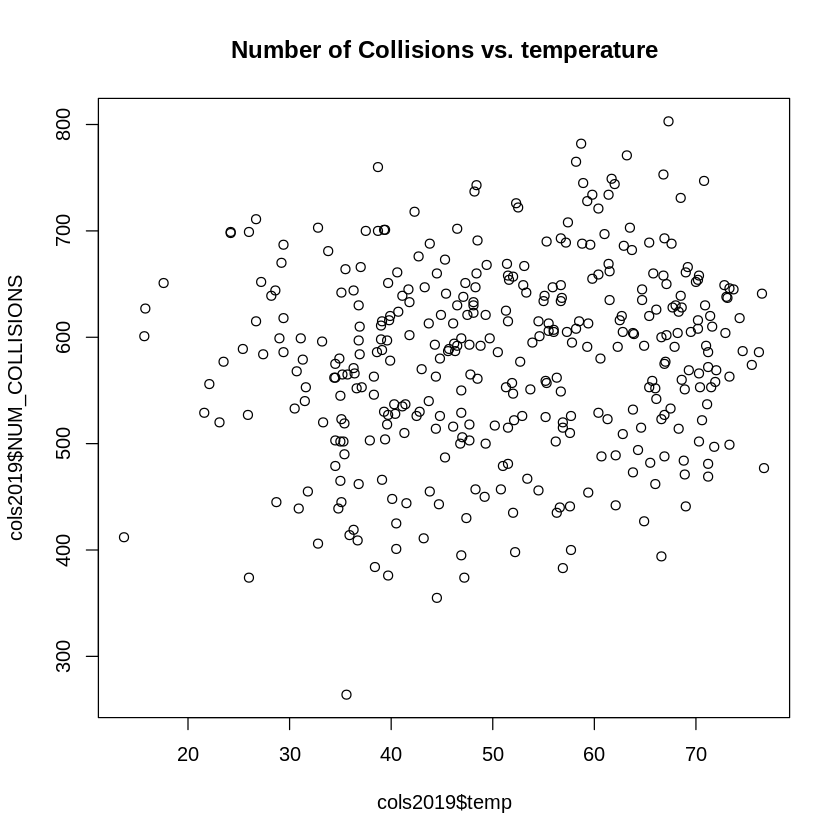

[1] -0.1208627

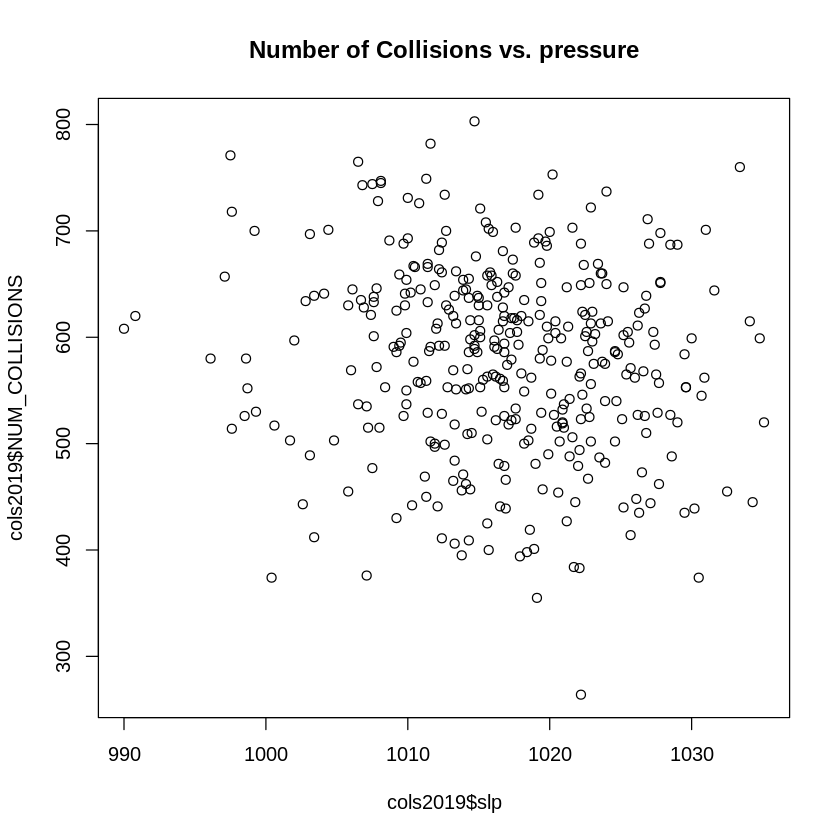

[1] -0.04950622

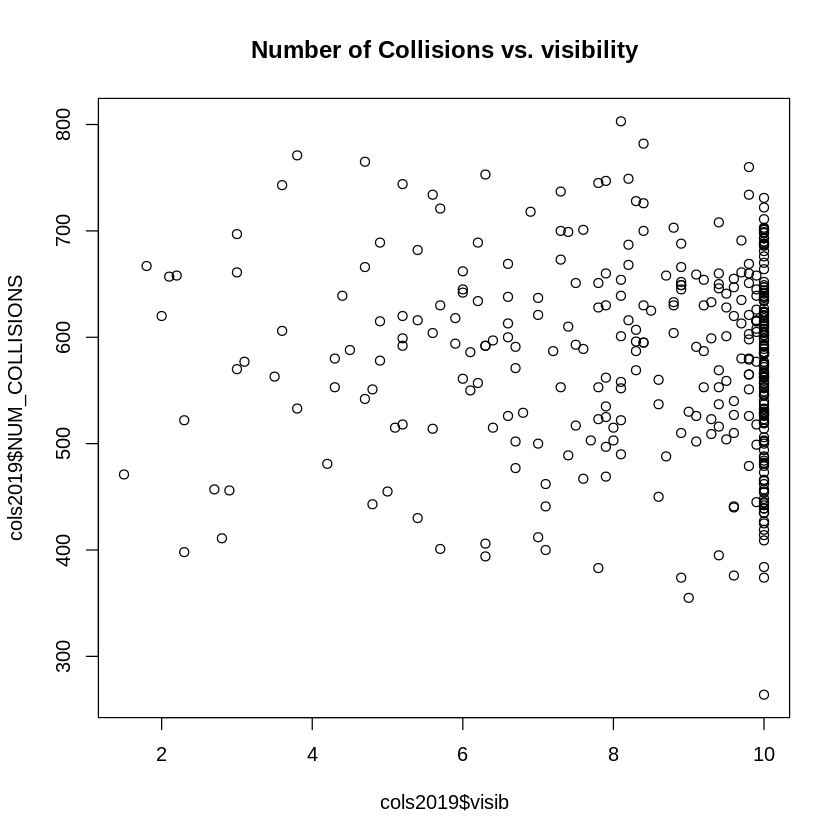

[1] 0.04430334

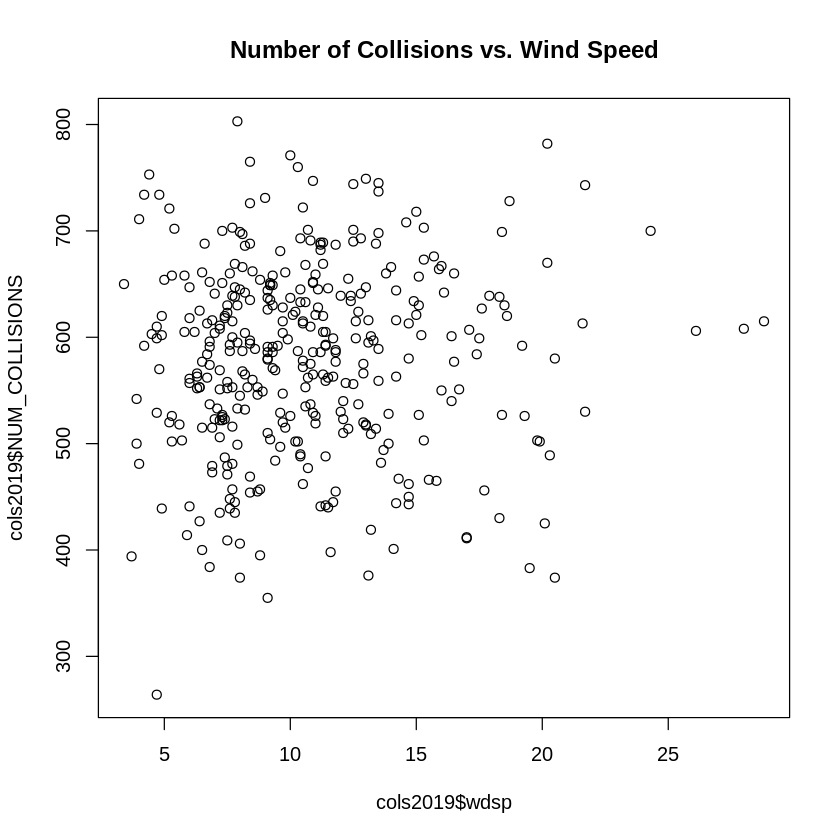

[1] 0.1164604

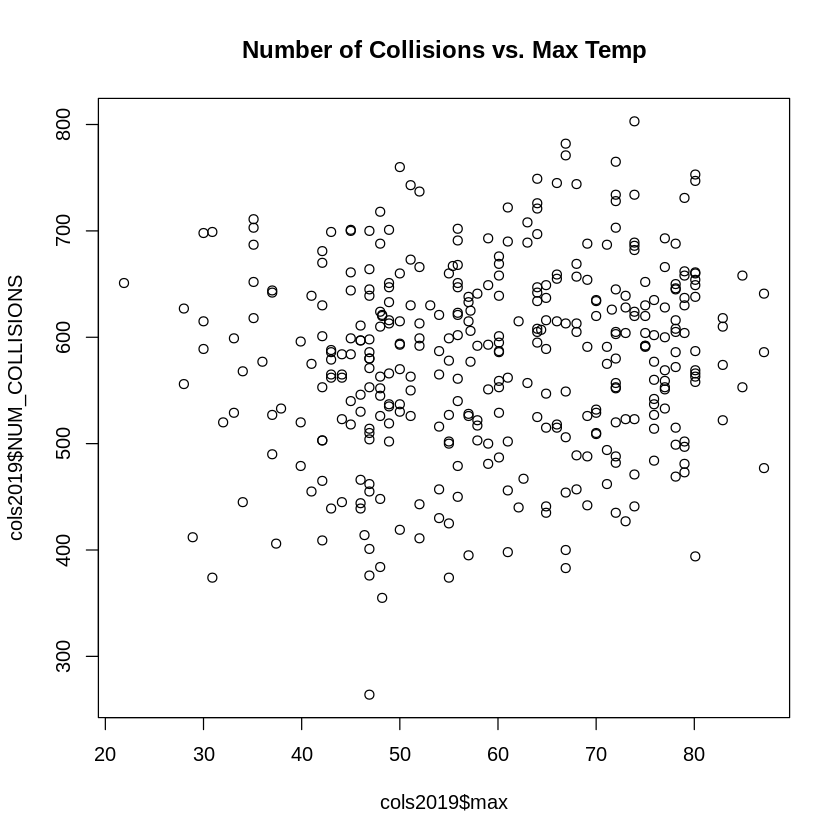

[1] 0.1361838

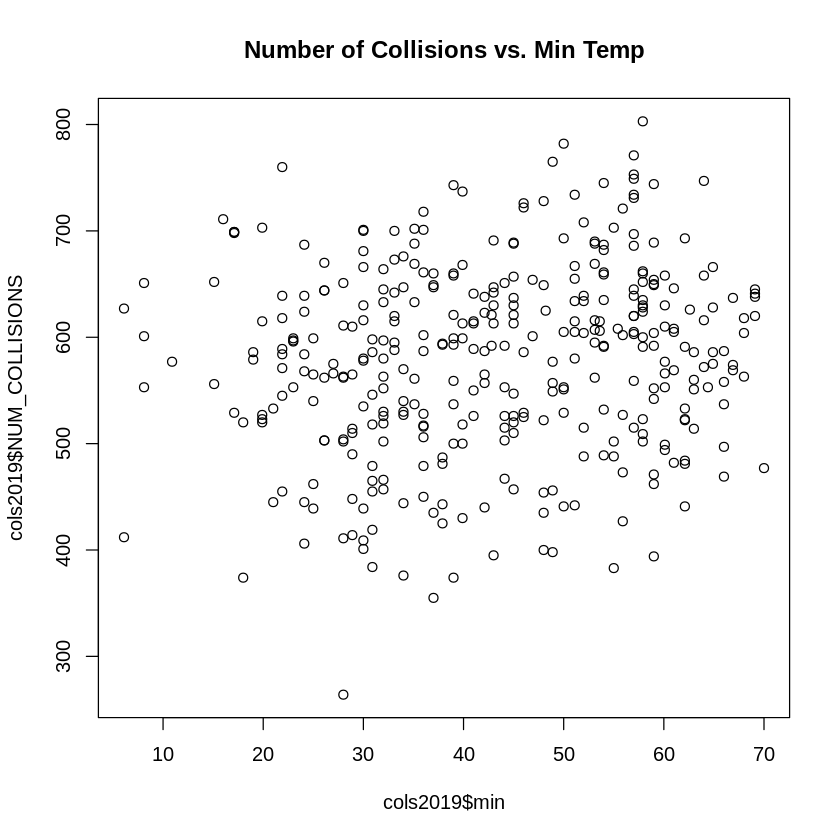

In [63]:
plot(cols2019$temp, cols2019$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2019$temp,cols2019$NUM_COLLISIONS)
plot(cols2019$slp, cols2019$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2019$slp,cols2019$NUM_COLLISIONS)
plot(cols2019$visib, cols2019$NUM_COLLISIONS, main="Number of Collisions vs. visibility")
cor(cols2019$visib,cols2019$NUM_COLLISIONS)
plot(cols2019$wdsp, cols2019$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2019$wdsp,cols2019$NUM_COLLISIONS)
plot(cols2019$max, cols2019$NUM_COLLISIONS, main="Number of Collisions vs. Max Temp")
cor(cols2019$max,cols2019$NUM_COLLISIONS)
plot(cols2019$min, cols2019$NUM_COLLISIONS, main="Number of Collisions vs. Min Temp")
cor(cols2019$min,cols2019$NUM_COLLISIONS)

###2020

[1] -0.2169696

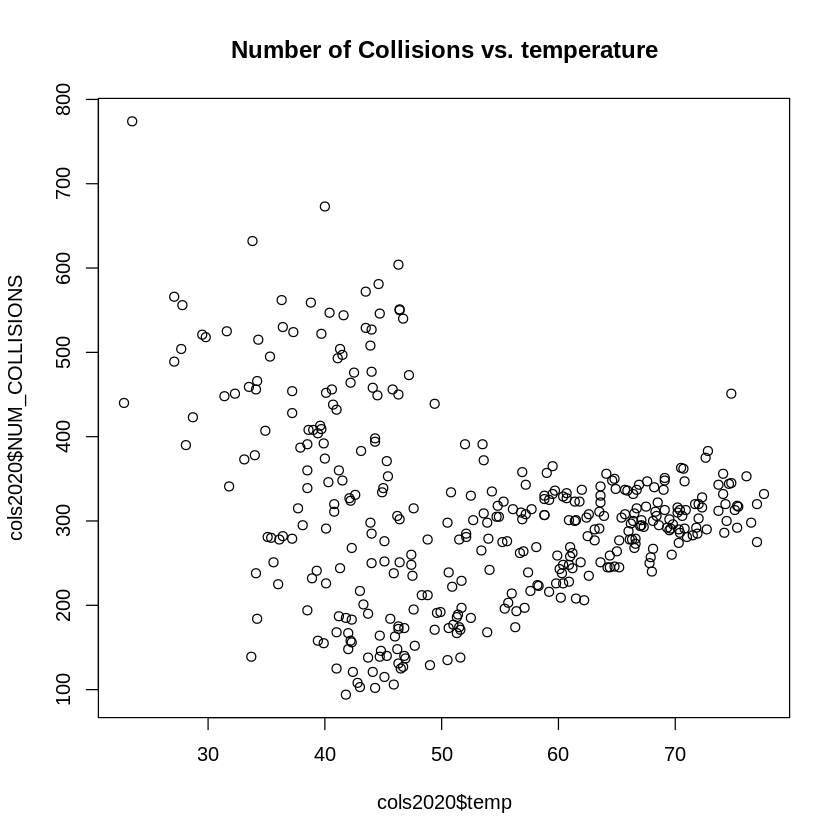

[1] 0.006426374

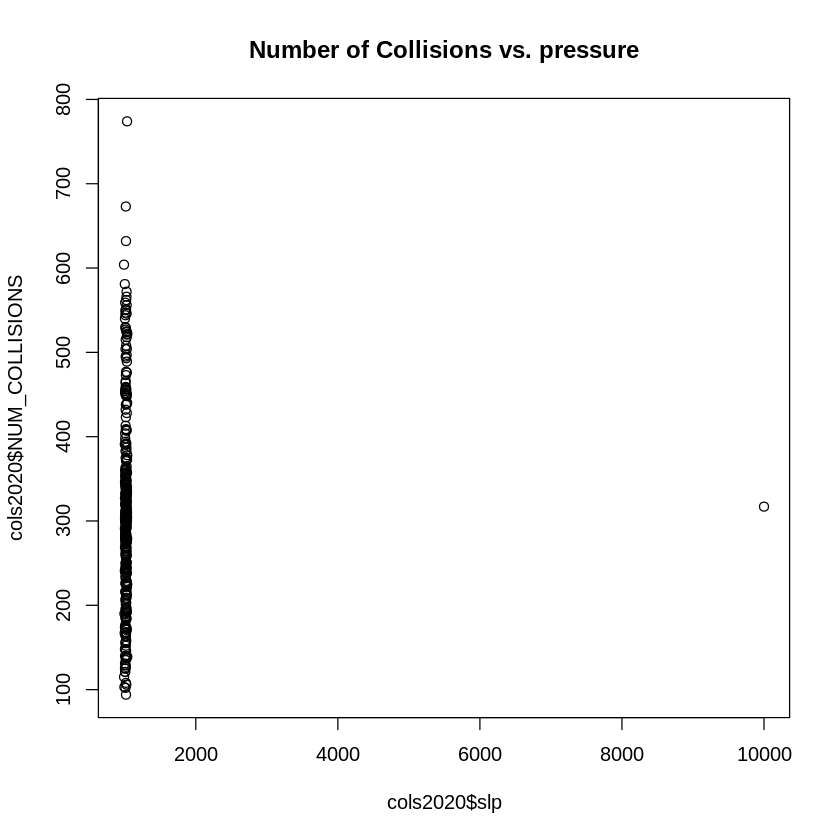

[1] -0.01825201

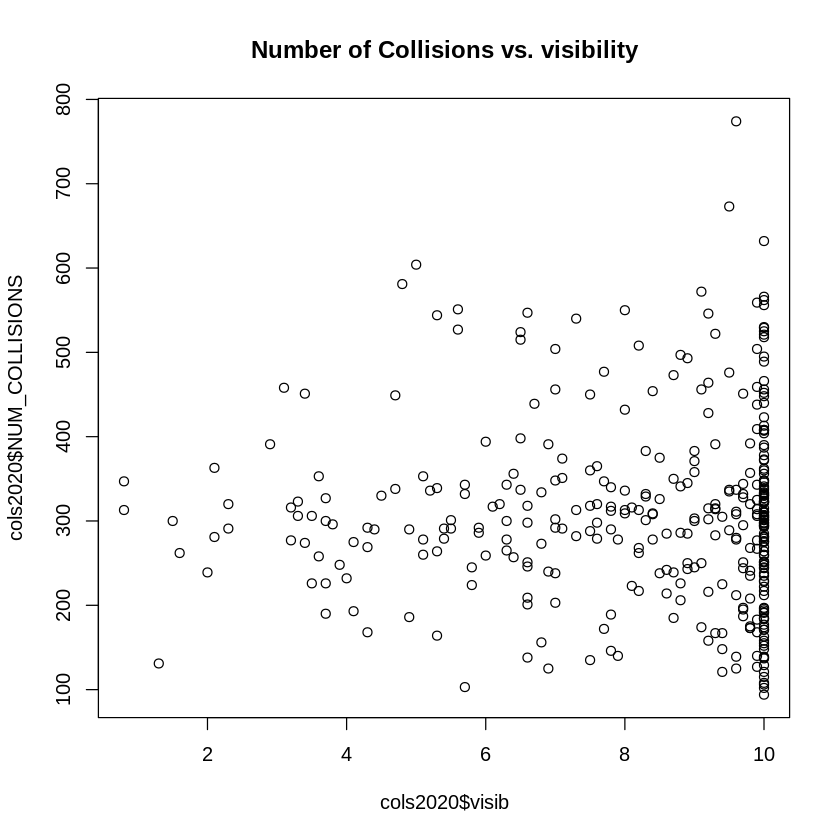

[1] -0.04976372

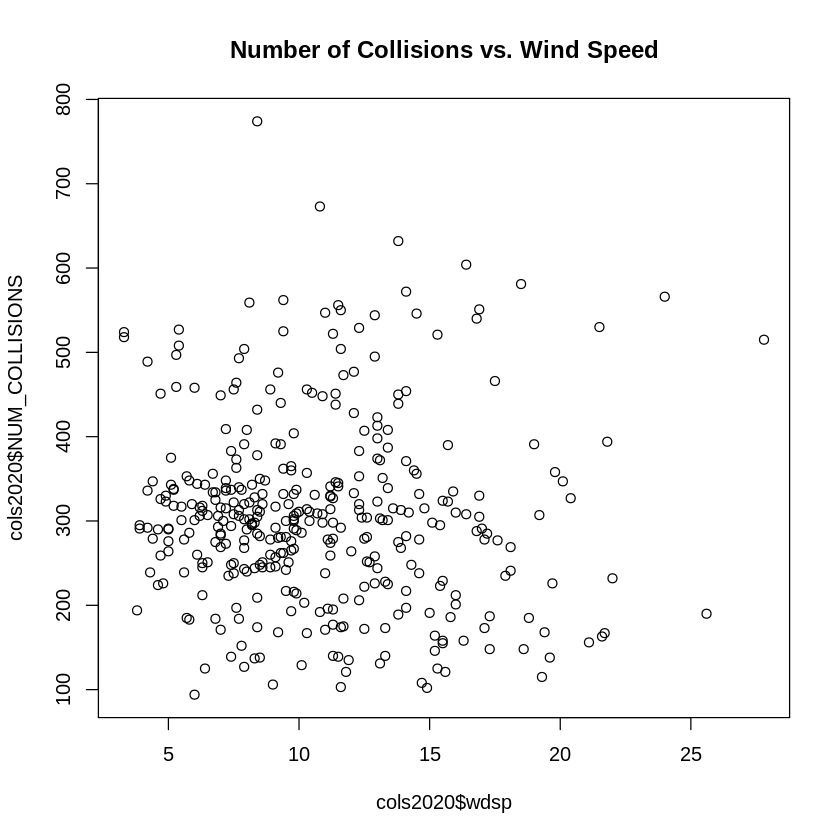

[1] -0.2177781

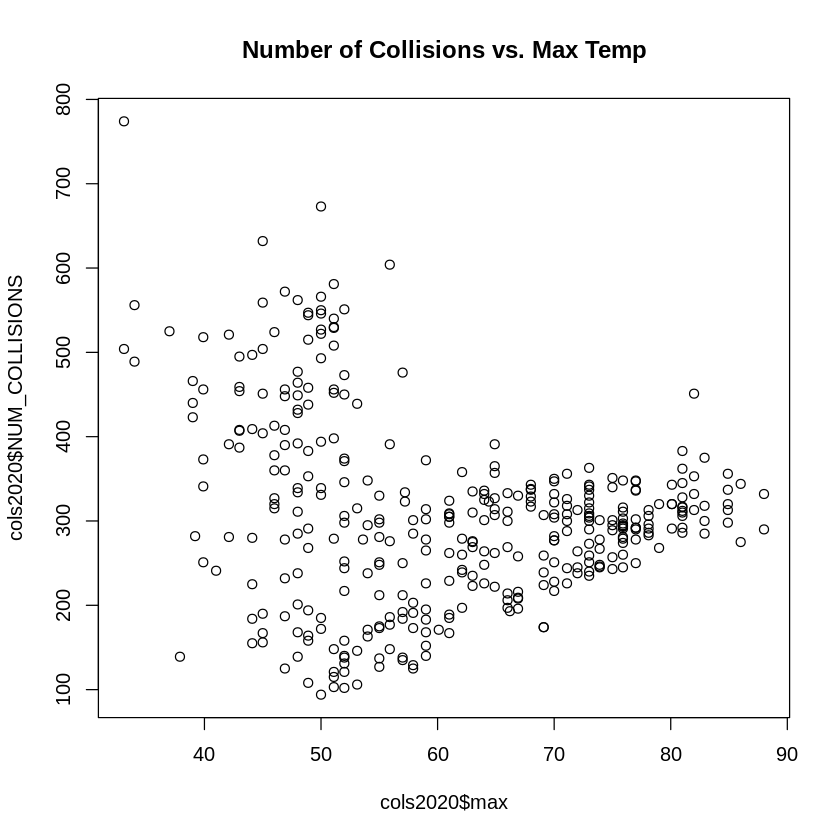

[1] -0.1970906

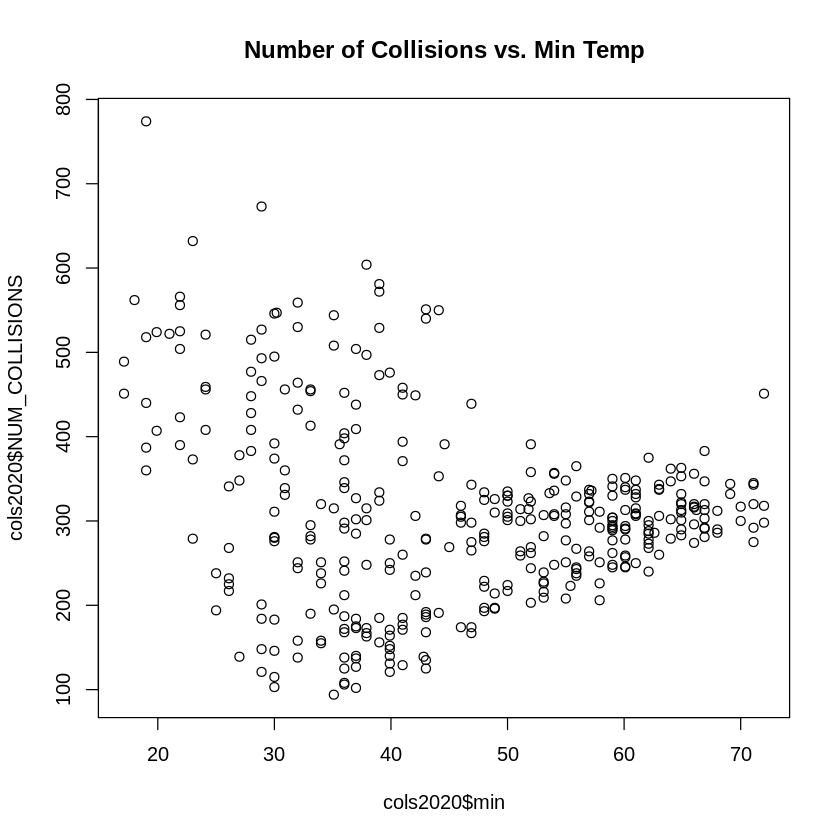

In [64]:
plot(cols2020$temp, cols2020$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2020$temp,cols2020$NUM_COLLISIONS)
plot(cols2020$slp, cols2020$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2020$slp,cols2020$NUM_COLLISIONS)
plot(cols2020$visib, cols2020$NUM_COLLISIONS, main="Number of Collisions vs. visibility")
cor(cols2020$visib,cols2020$NUM_COLLISIONS)
plot(cols2020$wdsp, cols2020$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2020$wdsp,cols2020$NUM_COLLISIONS)
plot(cols2020$max, cols2020$NUM_COLLISIONS, main="Number of Collisions vs. Max Temp")
cor(cols2020$max,cols2020$NUM_COLLISIONS)
plot(cols2020$min, cols2020$NUM_COLLISIONS, main="Number of Collisions vs. Min Temp")
cor(cols2020$min,cols2020$NUM_COLLISIONS)

###2021

[1] 0.6182618

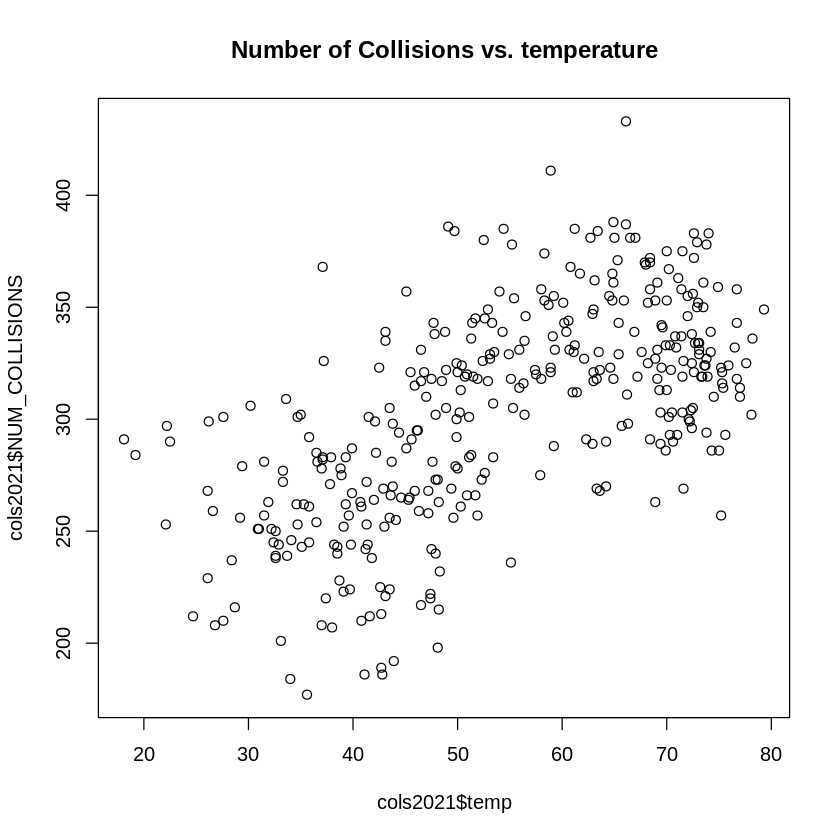

[1] 0.04460402

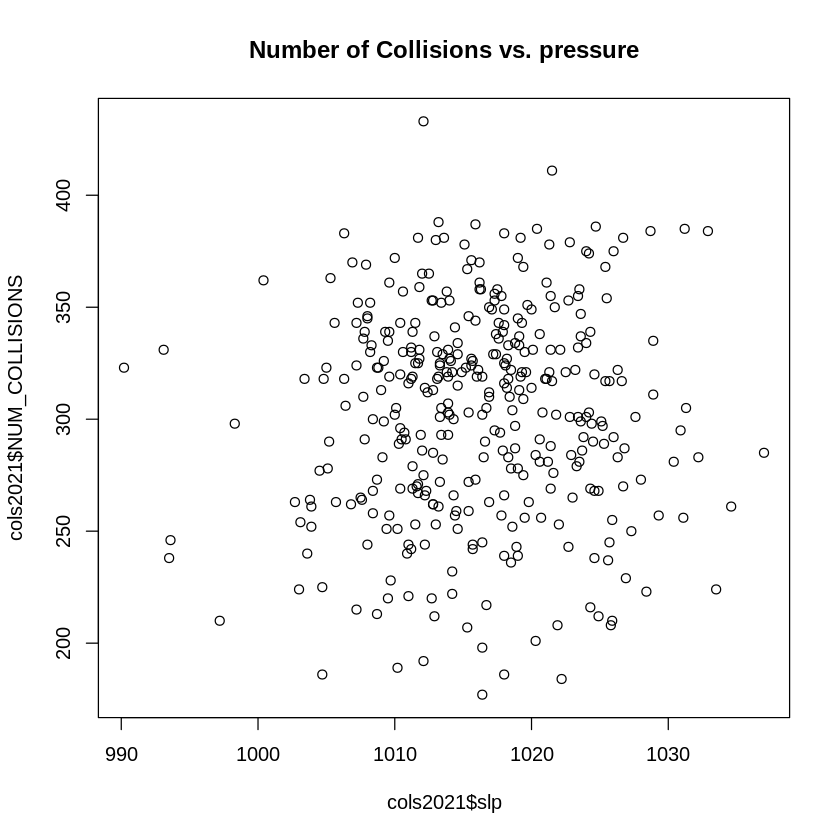

[1] -0.1147415

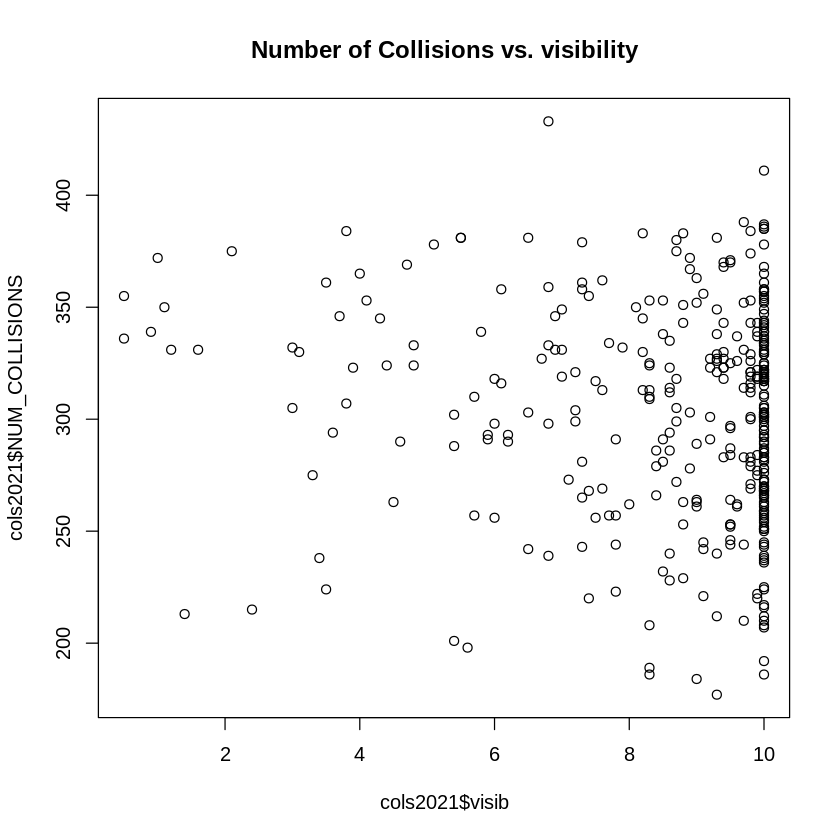

[1] -0.1085519

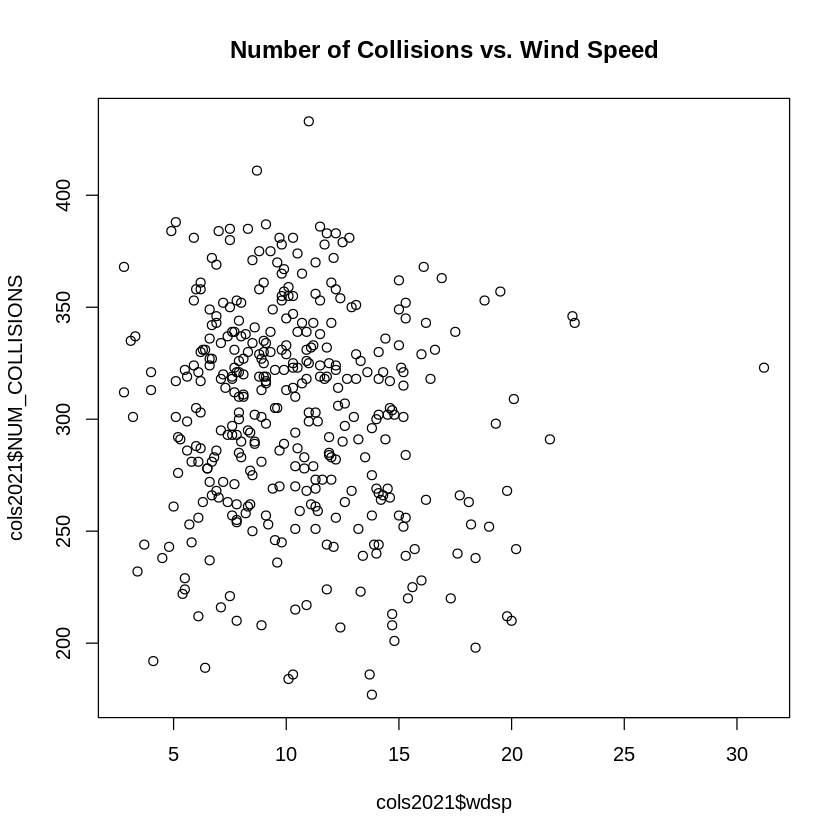

[1] 0.6321088

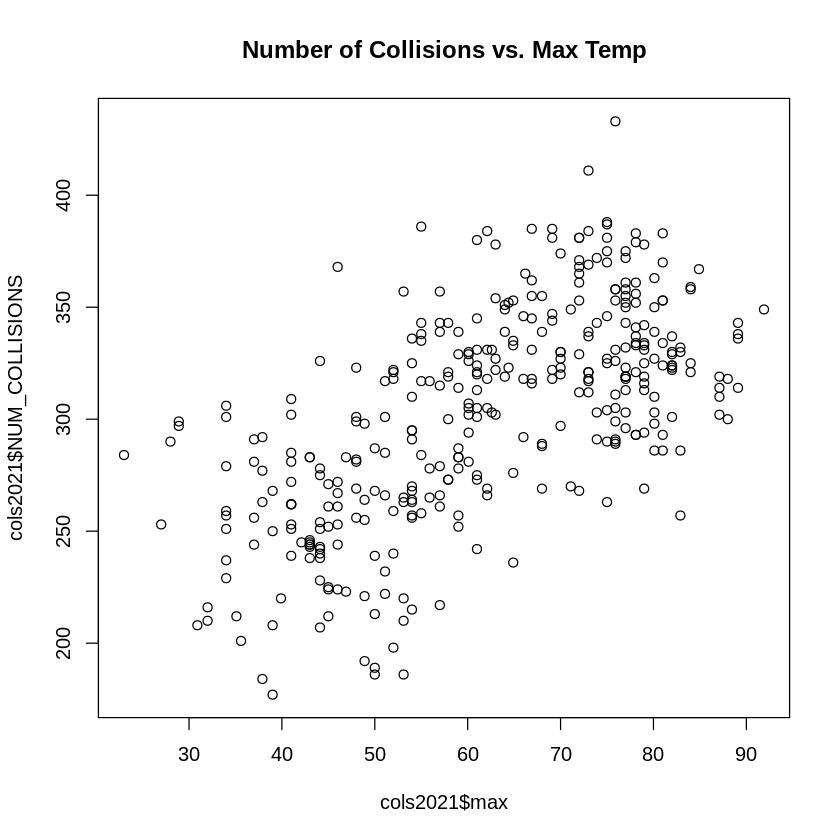

[1] 0.5828033

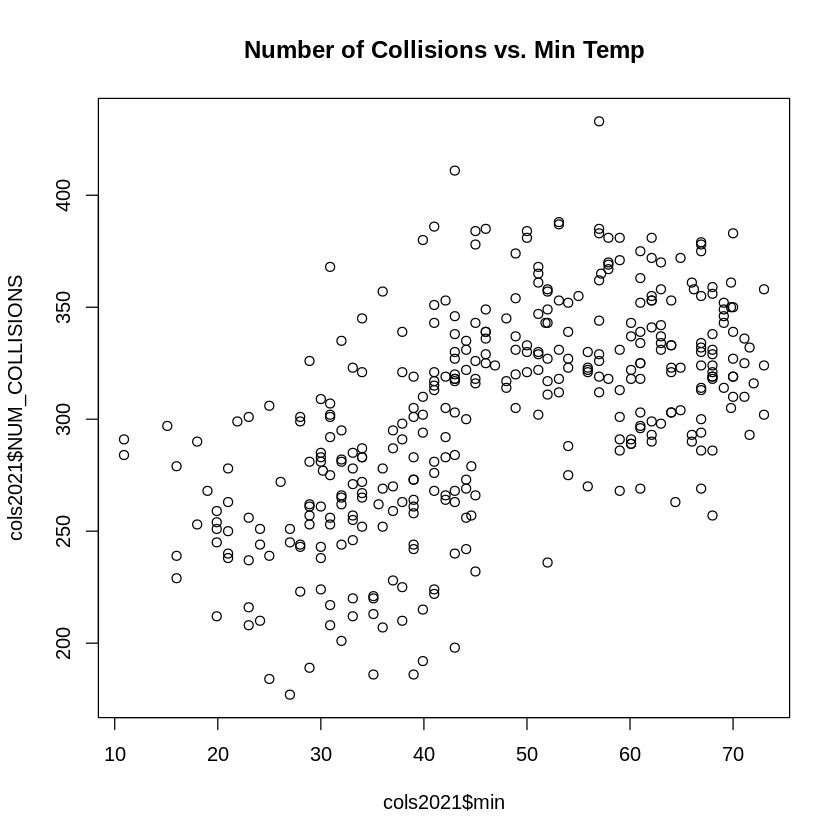

In [65]:
plot(cols2021$temp, cols2021$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2021$temp,cols2021$NUM_COLLISIONS)
plot(cols2021$slp, cols2021$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2021$slp,cols2021$NUM_COLLISIONS)
plot(cols2021$visib, cols2021$NUM_COLLISIONS, main="Number of Collisions vs. visibility")
cor(cols2021$visib,cols2021$NUM_COLLISIONS)
plot(cols2021$wdsp, cols2021$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2021$wdsp,cols2021$NUM_COLLISIONS)
plot(cols2021$max, cols2021$NUM_COLLISIONS, main="Number of Collisions vs. Max Temp")
cor(cols2021$max,cols2021$NUM_COLLISIONS)
plot(cols2021$min, cols2021$NUM_COLLISIONS, main="Number of Collisions vs. Min Temp")
cor(cols2021$min,cols2021$NUM_COLLISIONS)

In [66]:
install.packages("corrplot")
library(ggplot2)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



,NUM_COLLISIONS,temp,dewp,visib,max,min,prcp
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,524,37.3,33.7,6.5,46.0,19.9,0.00
2,278,37.0,29.1,10.0,44.1,21.0,0.00
3,254,36.5,28.4,10.0,44.1,19.9,0.00
4,262,34.6,33.8,8.0,41.0,28.9,0.25
5,263,31.9,23.4,9.0,37.9,21.0,0.00
6,237,34.5,23.8,9.7,39.9,25.0,0.00


,NUM_COLLISIONS,temp,dewp,visib,max,min,prcp
NUM_COLLISIONS,1.00000000,0.0675109,0.01810756,-0.04713228,0.07151507,0.06266176,-0.04247378
temp,0.06751090,1.0000000,0.10627428,-0.20818789,0.97049524,0.96492870,0.12018529
dewp,0.01810756,0.1062743,1.00000000,-0.04829920,0.10750034,0.10295640,0.01023239
visib,-0.04713228,-0.2081879,-0.04829920,1.00000000,-0.15614908,-0.24666657,-0.02145577
max,0.07151507,0.9704952,0.10750034,-0.15614908,1.00000000,0.92910096,0.11406708
min,0.06266176,0.9649287,0.10295640,-0.24666657,0.92910096,1.00000000,0.11775081
prcp,-0.04247378,0.1201853,0.01023239,-0.02145577,0.11406708,0.11775081,1.00000000


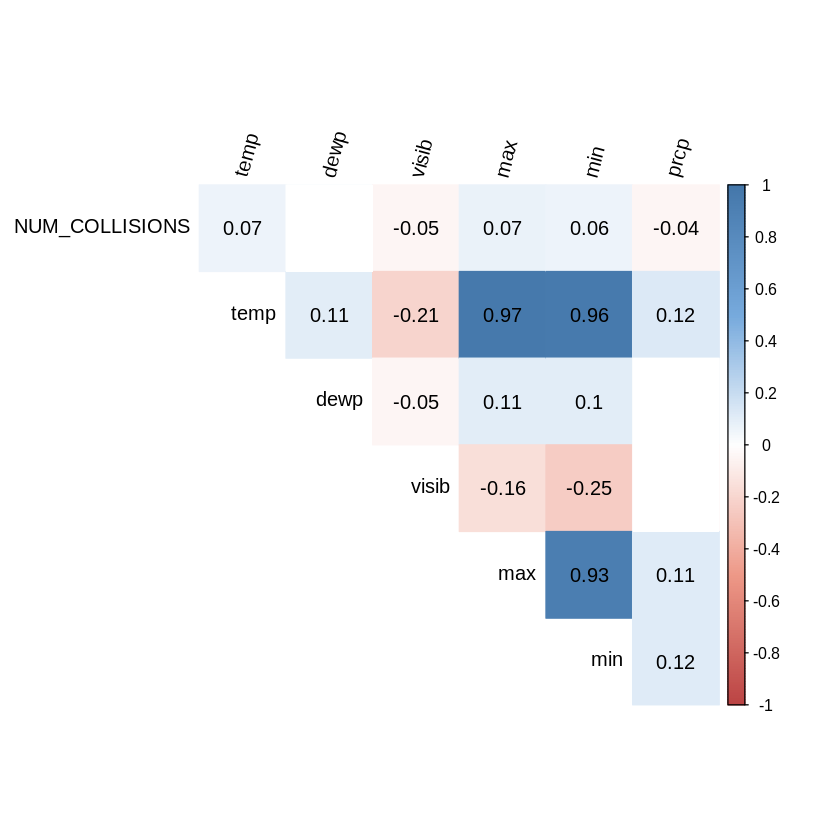

In [67]:
# do not edit - REF https://cran.r-project.org/web/packages/corrplot/vignettes/corrplot-intro.html

corrplot2 <- function(data,
                      method = "pearson",
                      sig.level = 0.05,
                      order = "original",
                      diag = FALSE,
                      type = "upper",
                      tl.srt = 90,
                      number.font = 1,
                      number.cex = 1,
                      mar = c(0, 0, 0, 0)) {
  library(corrplot)
  data_incomplete <- data
  data <- data[complete.cases(data), ]
  mat <- cor(data, method = method)
  cor.mtest <- function(mat, method) {
    mat <- as.matrix(mat)
    n <- ncol(mat)
    p.mat <- matrix(NA, n, n)
    diag(p.mat) <- 0
    for (i in 1:(n - 1)) {
      for (j in (i + 1):n) {
        tmp <- cor.test(mat[, i], mat[, j], method = method)
        p.mat[i, j] <- p.mat[j, i] <- tmp$p.value
      }
    }
    colnames(p.mat) <- rownames(p.mat) <- colnames(mat)
    p.mat
  }
  p.mat <- cor.mtest(data, method = method)
  col <- colorRampPalette(c("#BB4444", "#EE9988", "#FFFFFF", "#77AADD", "#4477AA"))
  corrplot(mat,
    method = "color", col = col(200), number.font = number.font,
    mar = mar, number.cex = number.cex,
    type = type, order = order,
    addCoef.col = "black", # add correlation coefficient
    tl.col = "black", tl.srt = tl.srt, # rotation of text labels
    # combine with significance level
    p.mat = p.mat, sig.level = sig.level, insig = "blank",
    # hide correlation coefficients on the diagonal
    diag = diag
  )
}
corData <- coldata[, c("NUM_COLLISIONS","temp","dewp","visib","max","min","prcp")]
# edit from here
corrplot2(
  data = corData,
  method = "pearson",
  sig.level = 0.05,
  order = "original",
  diag = FALSE,
  type = "upper",
  tl.srt = 75
)
head(corData)
cor(corData)

##Temperature
Looking at temperature in isolation, there is a positive corrolation between temperature and the number of collisions, sugesting as the temperature increases the number of collisions increase.

The exception to this is 2020, where there is negative correlation between temperature and the number of collisions. 

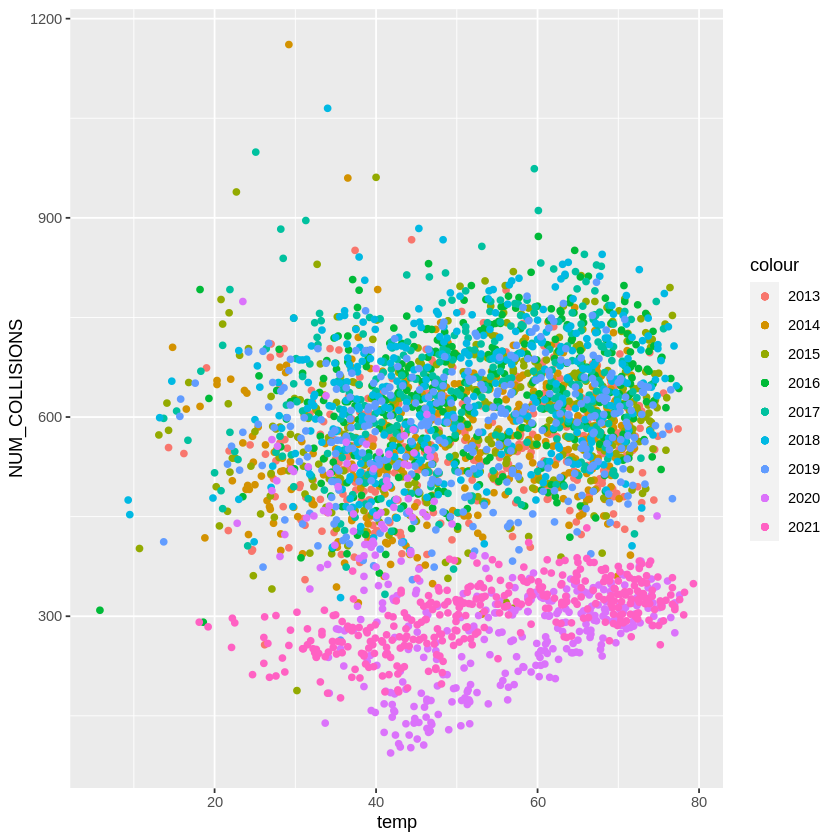

[1] 0.1981793

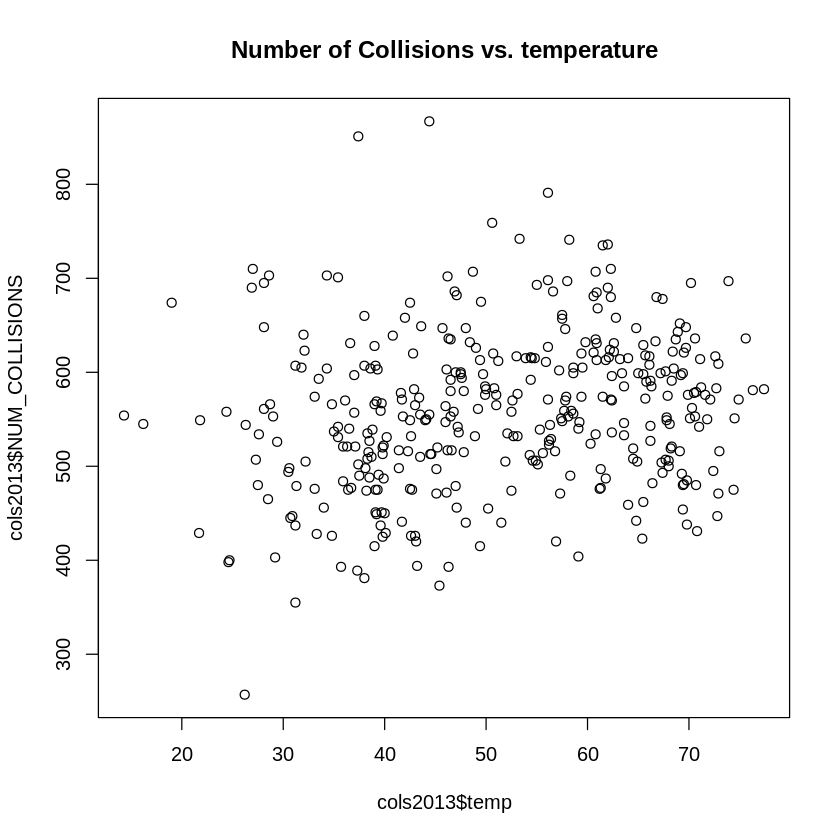

[1] 0.1577755

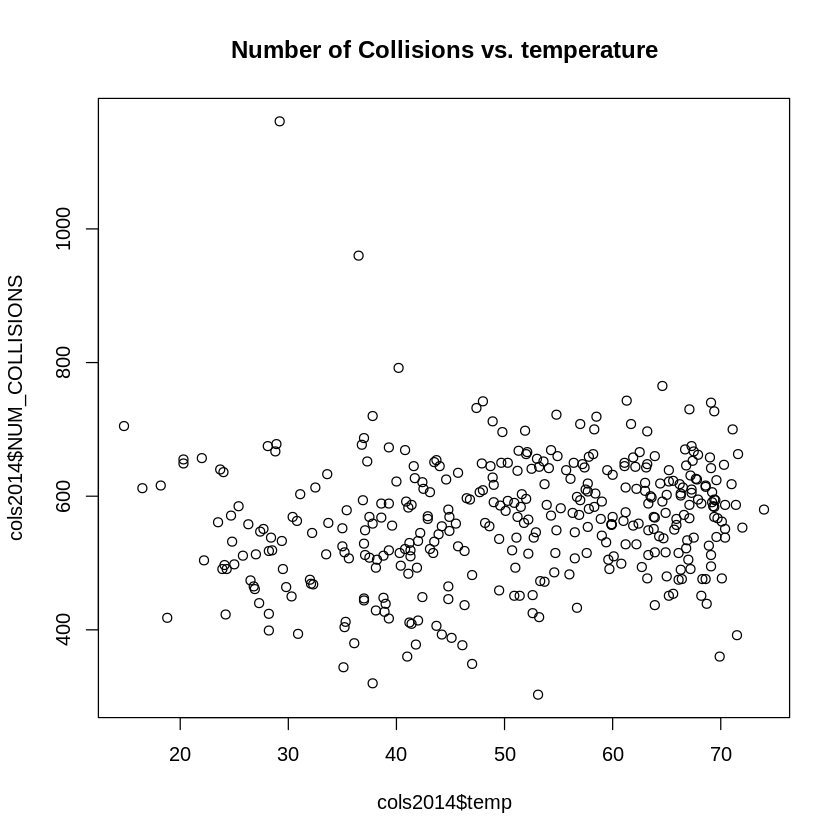

[1] 0.2482423

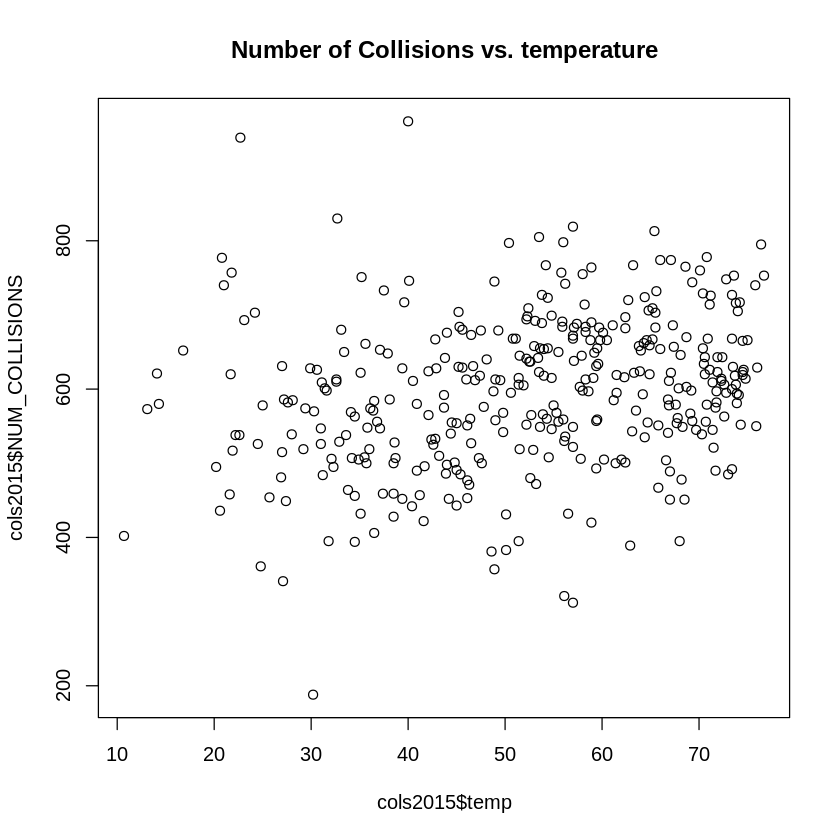

[1] 0.2648438

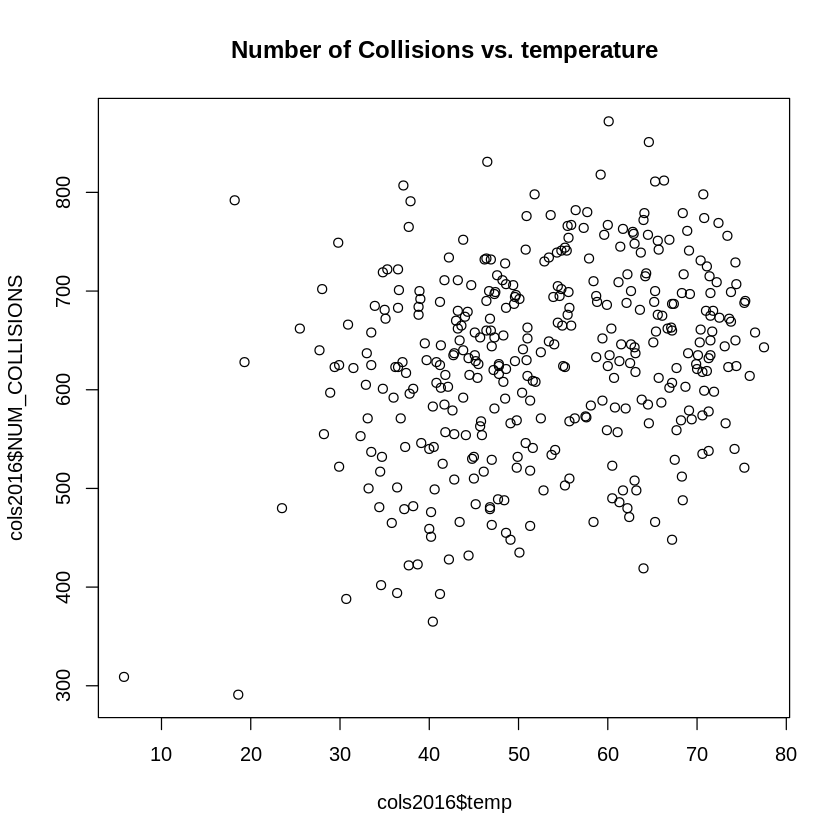

[1] 0.2073396

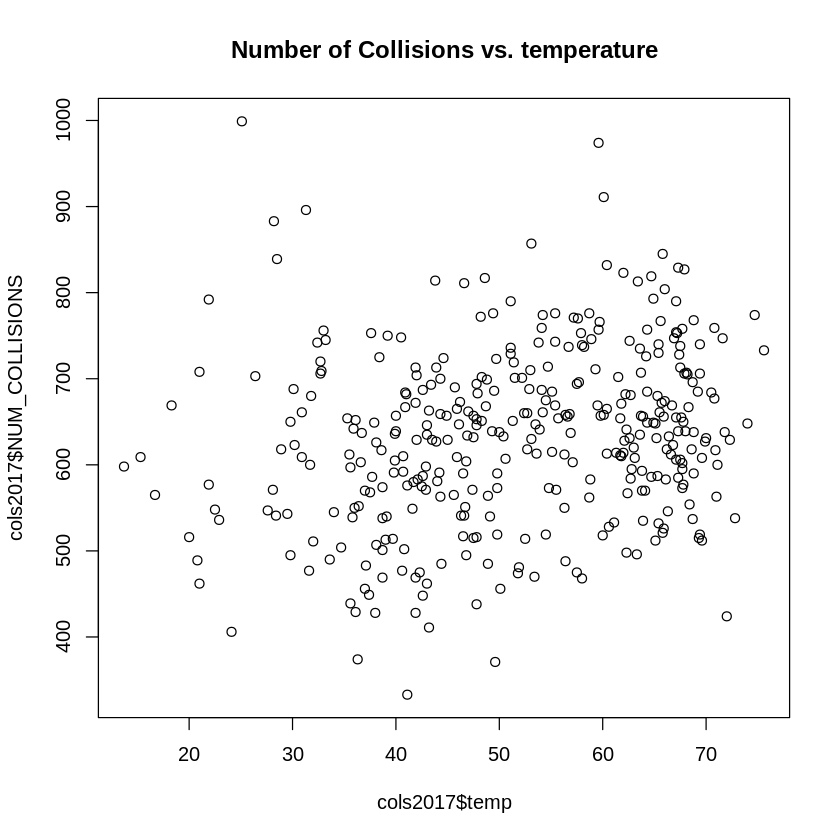

[1] 0.2273406

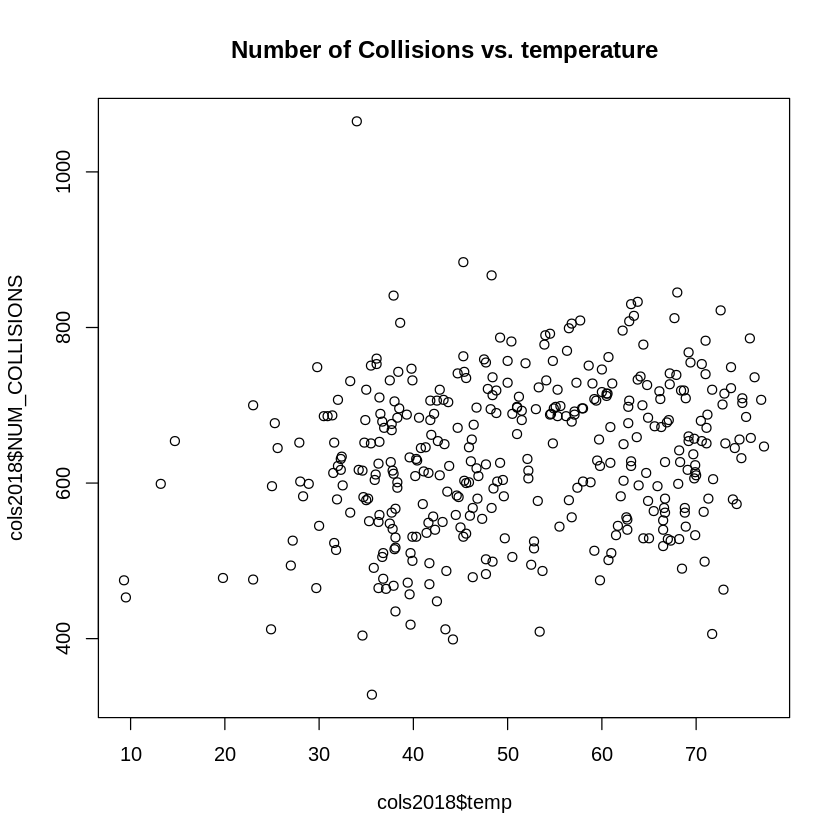

[1] 0.1329058

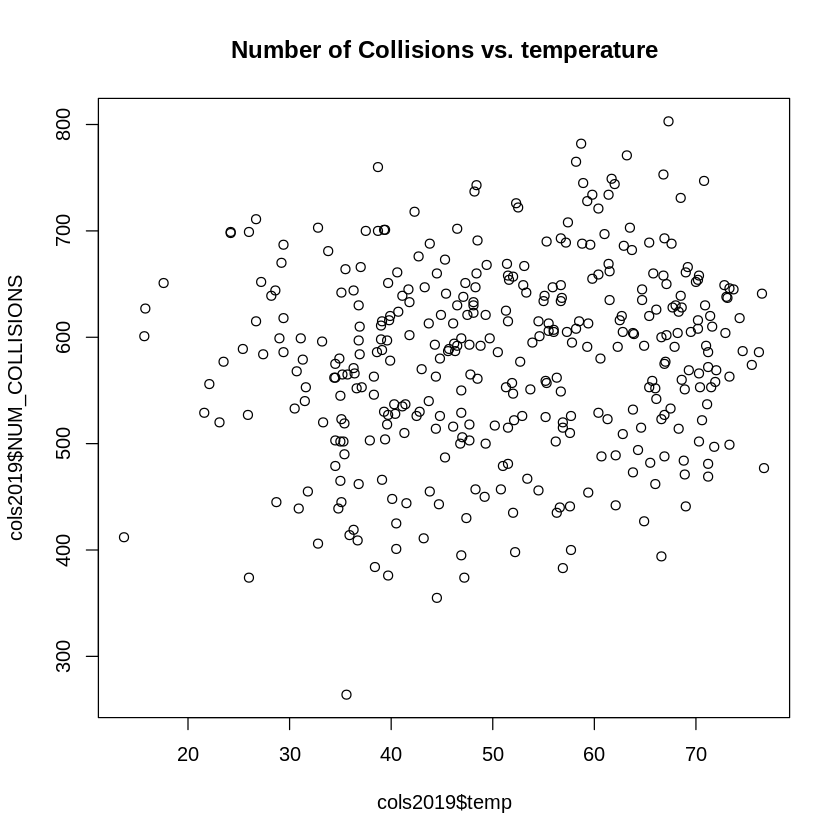

[1] -0.2169696

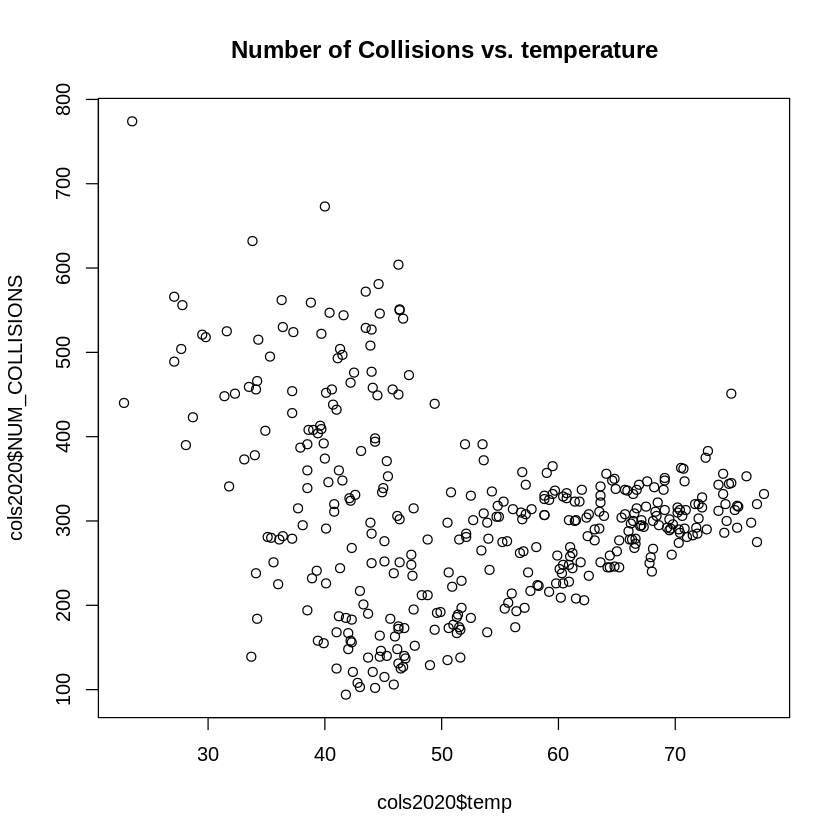

[1] 0.6182618

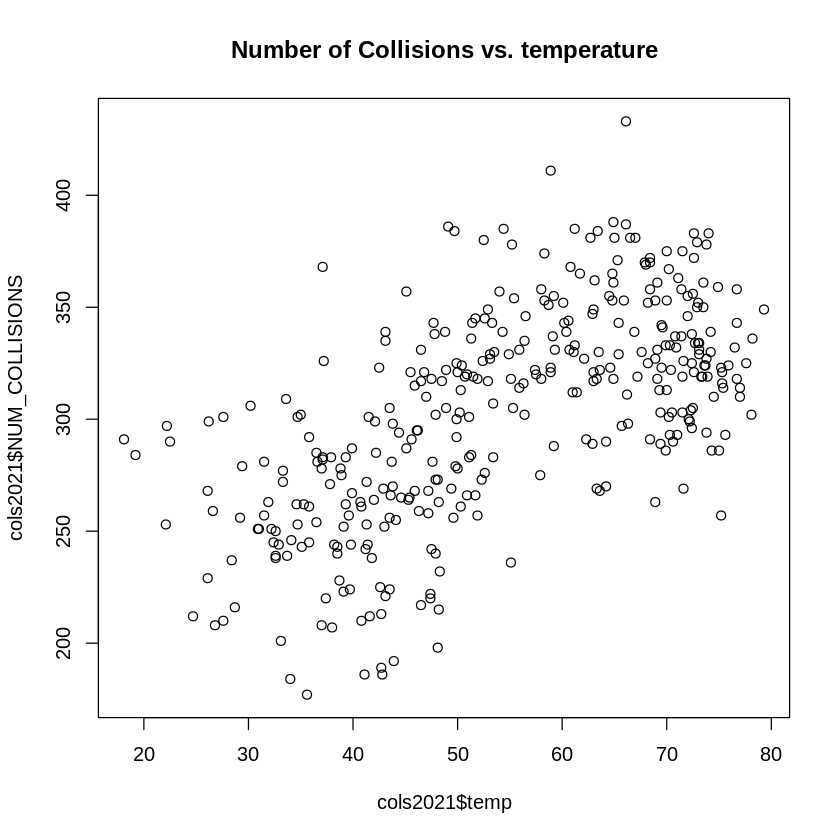

In [68]:
ggplot() +
  geom_point(data=cols2013, aes(temp, NUM_COLLISIONS, color="2013")) +
  geom_point(data=cols2014, aes(temp, NUM_COLLISIONS, color="2014")) +
  geom_point(data=cols2015, aes(temp, NUM_COLLISIONS, color="2015")) +
  geom_point(data=cols2016, aes(temp, NUM_COLLISIONS, color="2016")) +
  geom_point(data=cols2017, aes(temp, NUM_COLLISIONS, color="2017")) +
  geom_point(data=cols2018, aes(temp, NUM_COLLISIONS, color="2018")) +
  geom_point(data=cols2019, aes(temp, NUM_COLLISIONS, color="2019")) +
  geom_point(data=cols2020, aes(temp, NUM_COLLISIONS, color="2020")) +
  geom_point(data=cols2021, aes(temp, NUM_COLLISIONS, color="2021"))

plot(cols2013$temp, cols2013$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2013$temp,cols2013$NUM_COLLISIONS)
plot(cols2014$temp, cols2014$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2014$temp,cols2014$NUM_COLLISIONS)
plot(cols2015$temp, cols2015$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2015$temp,cols2015$NUM_COLLISIONS)
plot(cols2016$temp, cols2016$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2016$temp,cols2016$NUM_COLLISIONS)
plot(cols2017$temp, cols2017$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2017$temp,cols2017$NUM_COLLISIONS)
plot(cols2018$temp, cols2018$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2018$temp,cols2018$NUM_COLLISIONS)
plot(cols2019$temp, cols2019$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2019$temp,cols2019$NUM_COLLISIONS)
plot(cols2020$temp, cols2020$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2020$temp,cols2020$NUM_COLLISIONS)
plot(cols2021$temp, cols2021$NUM_COLLISIONS, main="Number of Collisions vs. temperature")
cor(cols2021$temp,cols2021$NUM_COLLISIONS)

###Maximum & Minimum Temperature
Minimum and Maximum temperatue as expected have a similar correlation to that of temperature. As temperature increases the number of collisions increase

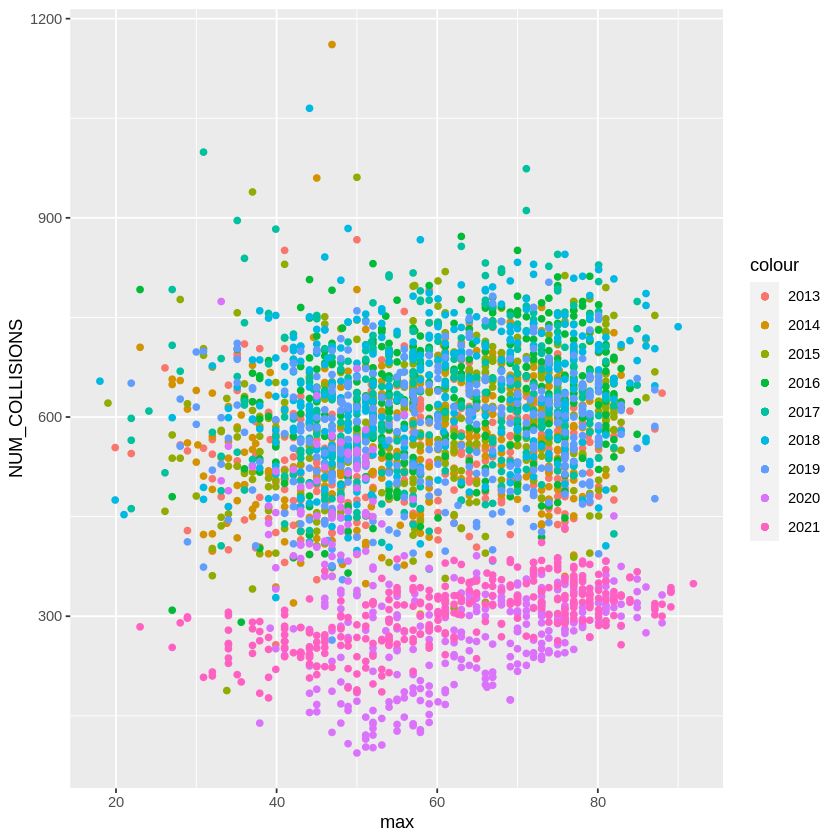

[1] 0.1846251

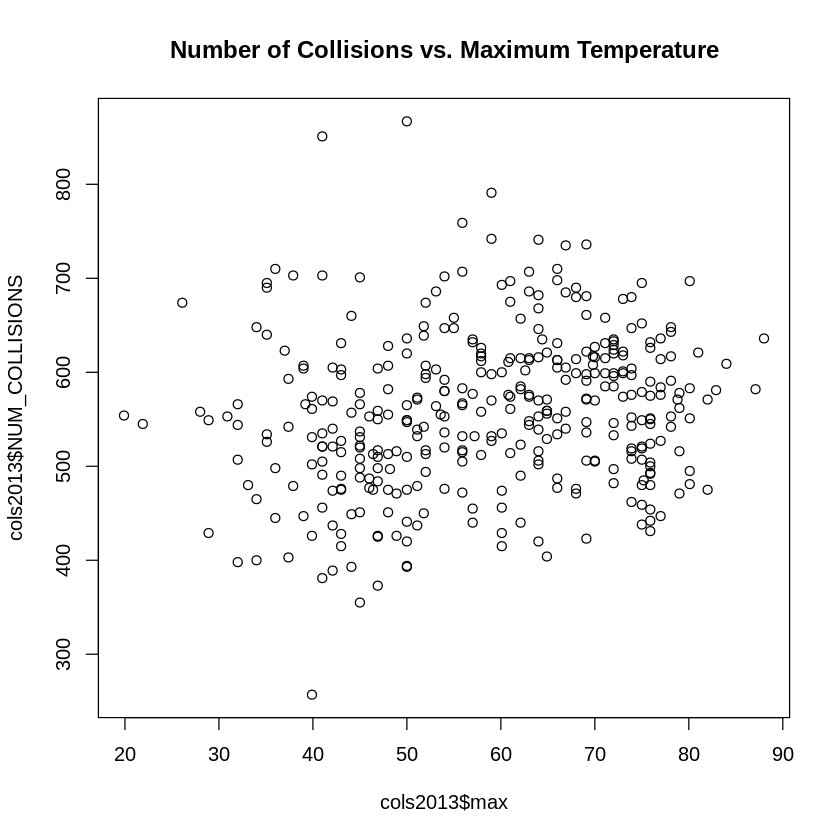

[1] 0.1780214

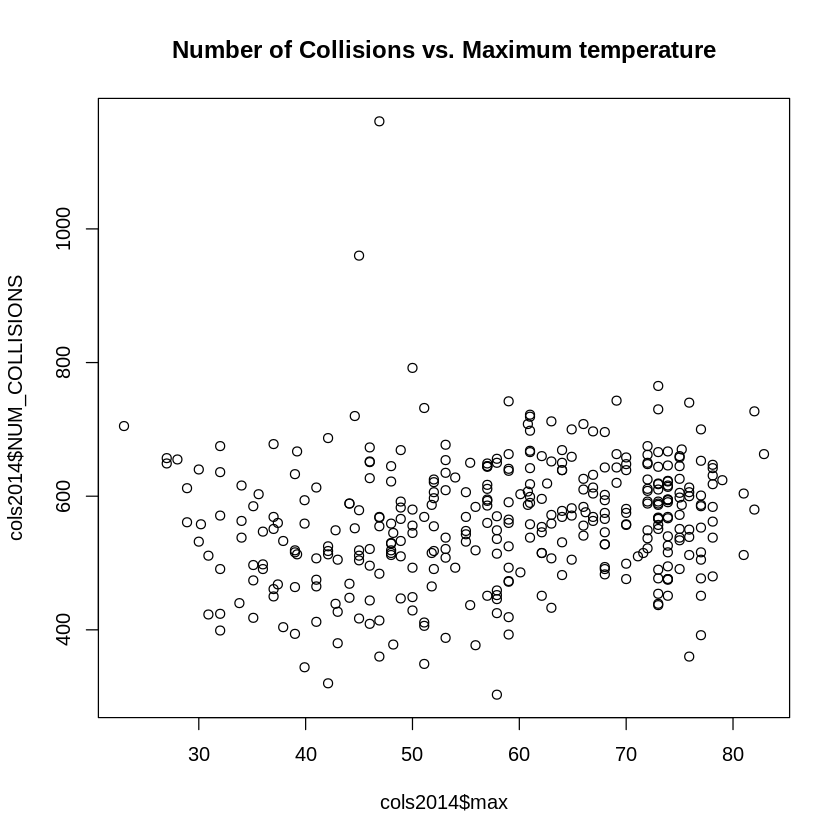

[1] 0.2520379

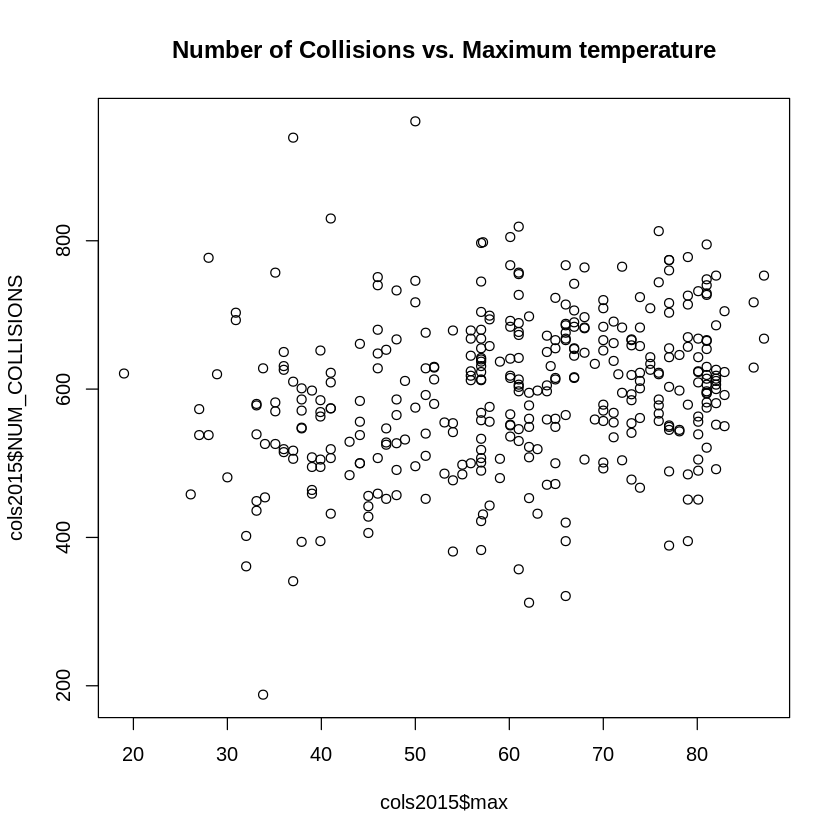

[1] 0.2569682

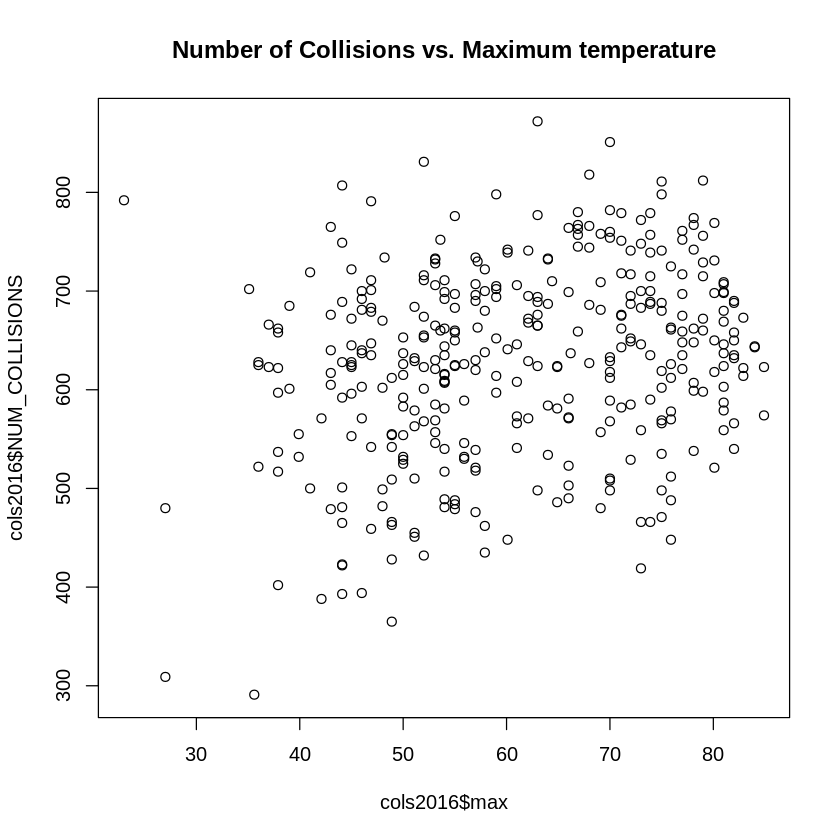

[1] 0.1881306

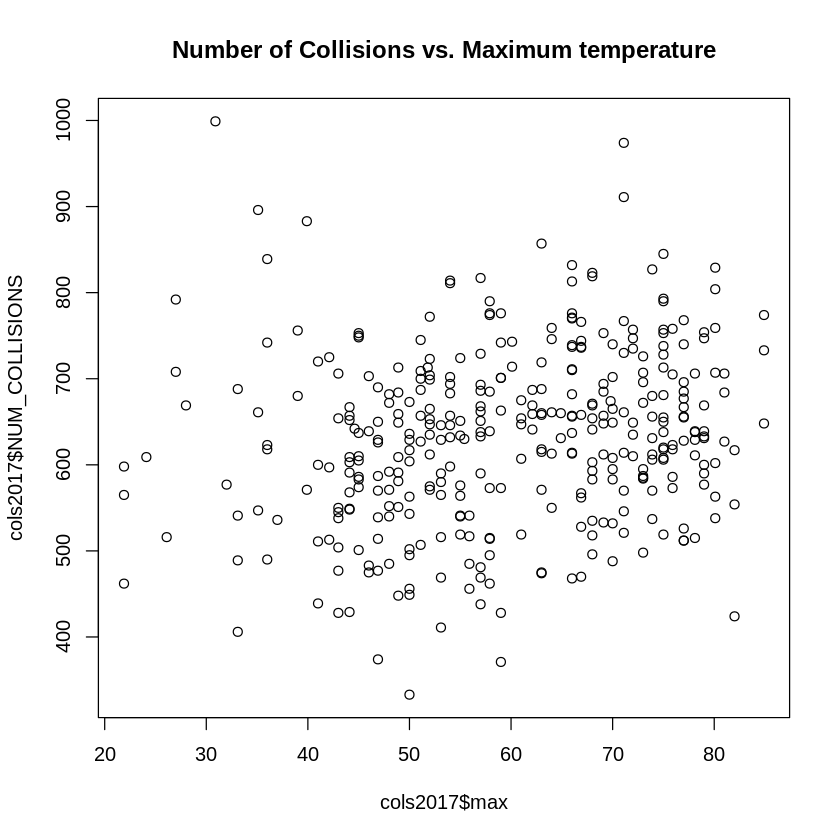

[1] 0.2257656

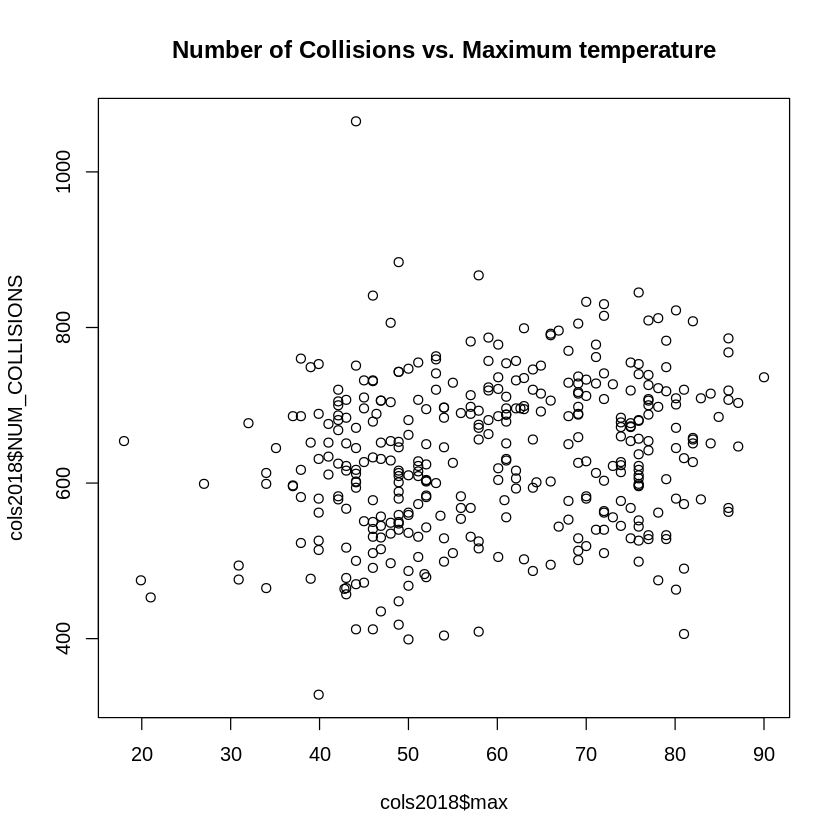

[1] 0.1164604

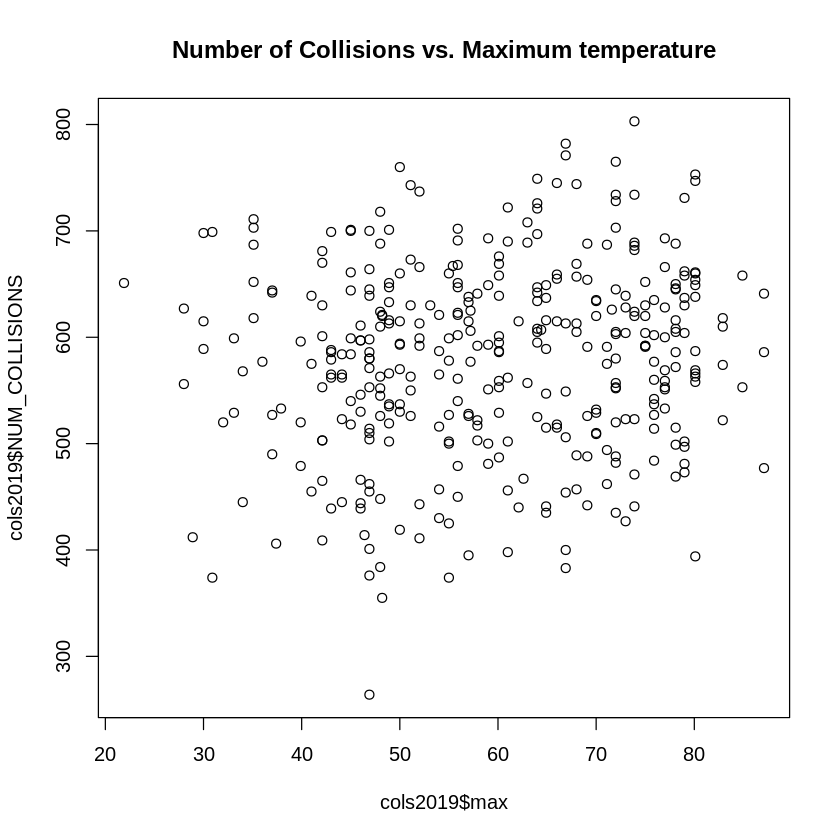

[1] -0.2177781

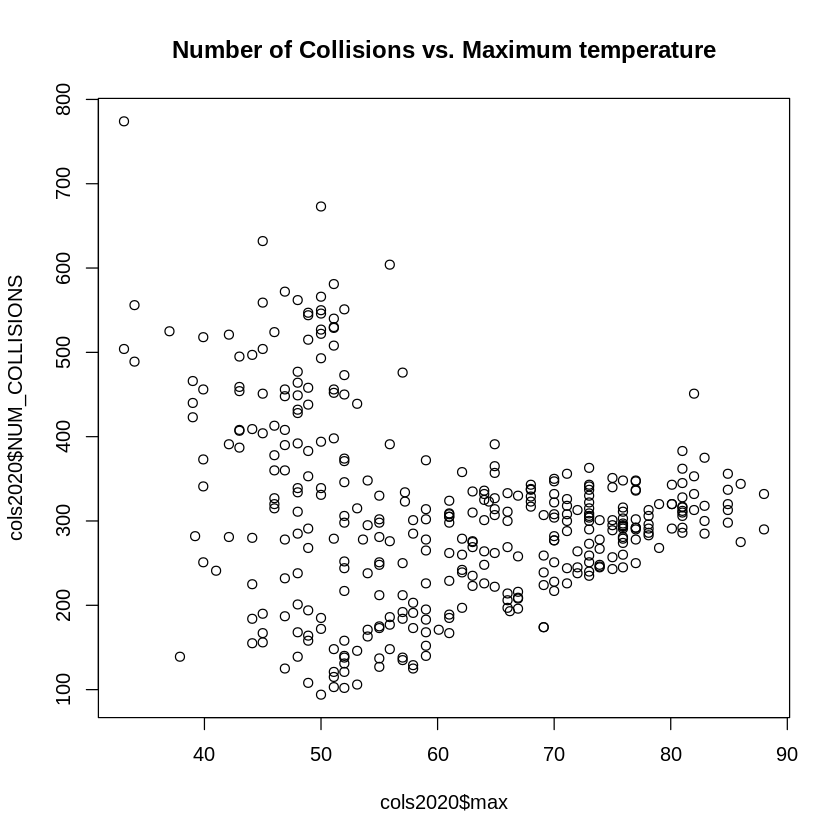

[1] 0.6321088

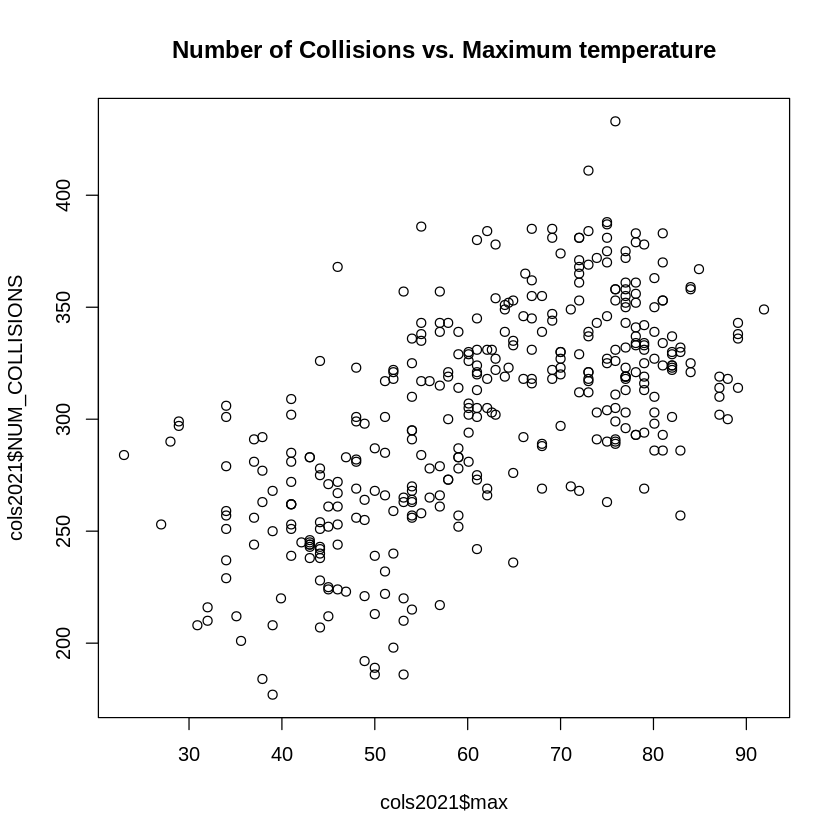

In [69]:
ggplot() +
  geom_point(data=cols2013, aes(max, NUM_COLLISIONS, color="2013")) +
  geom_point(data=cols2014, aes(max, NUM_COLLISIONS, color="2014")) +
  geom_point(data=cols2015, aes(max, NUM_COLLISIONS, color="2015")) +
  geom_point(data=cols2016, aes(max, NUM_COLLISIONS, color="2016")) +
  geom_point(data=cols2017, aes(max, NUM_COLLISIONS, color="2017")) +
  geom_point(data=cols2018, aes(max, NUM_COLLISIONS, color="2018")) +
  geom_point(data=cols2019, aes(max, NUM_COLLISIONS, color="2019")) +
  geom_point(data=cols2020, aes(max, NUM_COLLISIONS, color="2020")) +
  geom_point(data=cols2021, aes(max, NUM_COLLISIONS, color="2021"))
plot(cols2013$max, cols2013$NUM_COLLISIONS, main="Number of Collisions vs. Maximum Temperature")
cor(cols2013$max,cols2013$NUM_COLLISIONS)
plot(cols2014$max, cols2014$NUM_COLLISIONS, main="Number of Collisions vs. Maximum temperature")
cor(cols2014$max,cols2014$NUM_COLLISIONS)
plot(cols2015$max, cols2015$NUM_COLLISIONS, main="Number of Collisions vs. Maximum temperature")
cor(cols2015$max,cols2015$NUM_COLLISIONS)
plot(cols2016$max, cols2016$NUM_COLLISIONS, main="Number of Collisions vs. Maximum temperature")
cor(cols2016$max,cols2016$NUM_COLLISIONS)
plot(cols2017$max, cols2017$NUM_COLLISIONS, main="Number of Collisions vs. Maximum temperature")
cor(cols2017$max,cols2017$NUM_COLLISIONS)
plot(cols2018$max, cols2018$NUM_COLLISIONS, main="Number of Collisions vs. Maximum temperature")
cor(cols2018$max,cols2018$NUM_COLLISIONS)
plot(cols2019$max, cols2019$NUM_COLLISIONS, main="Number of Collisions vs. Maximum temperature")
cor(cols2019$max,cols2019$NUM_COLLISIONS)
plot(cols2020$max, cols2020$NUM_COLLISIONS, main="Number of Collisions vs. Maximum temperature")
cor(cols2020$max,cols2020$NUM_COLLISIONS)
plot(cols2021$max, cols2021$NUM_COLLISIONS, main="Number of Collisions vs. Maximum temperature")
cor(cols2021$max,cols2021$NUM_COLLISIONS)

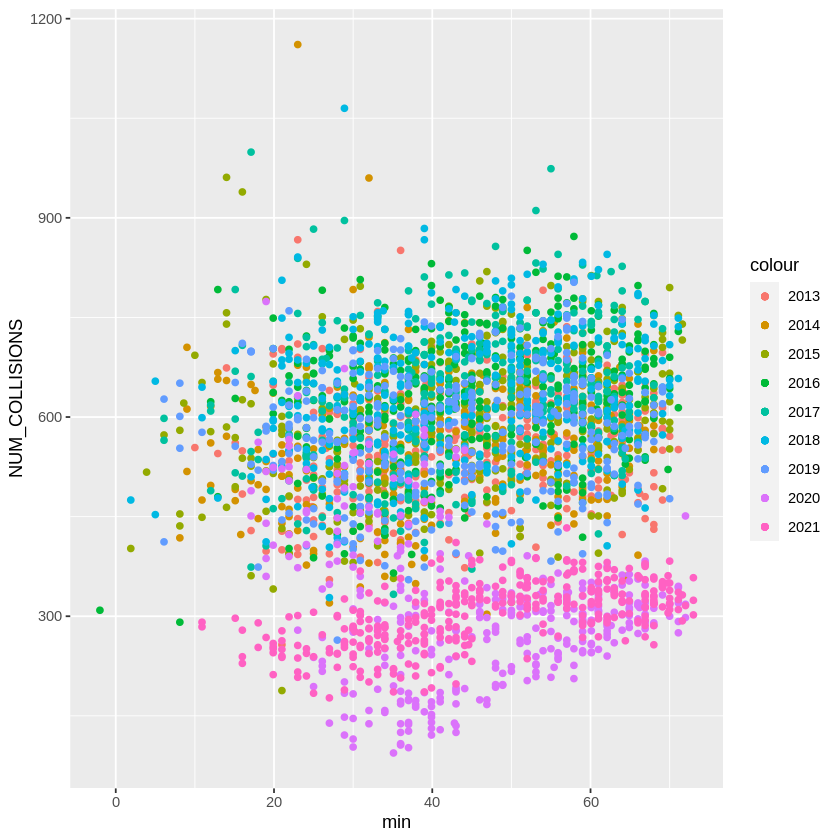

[1] 0.1802012

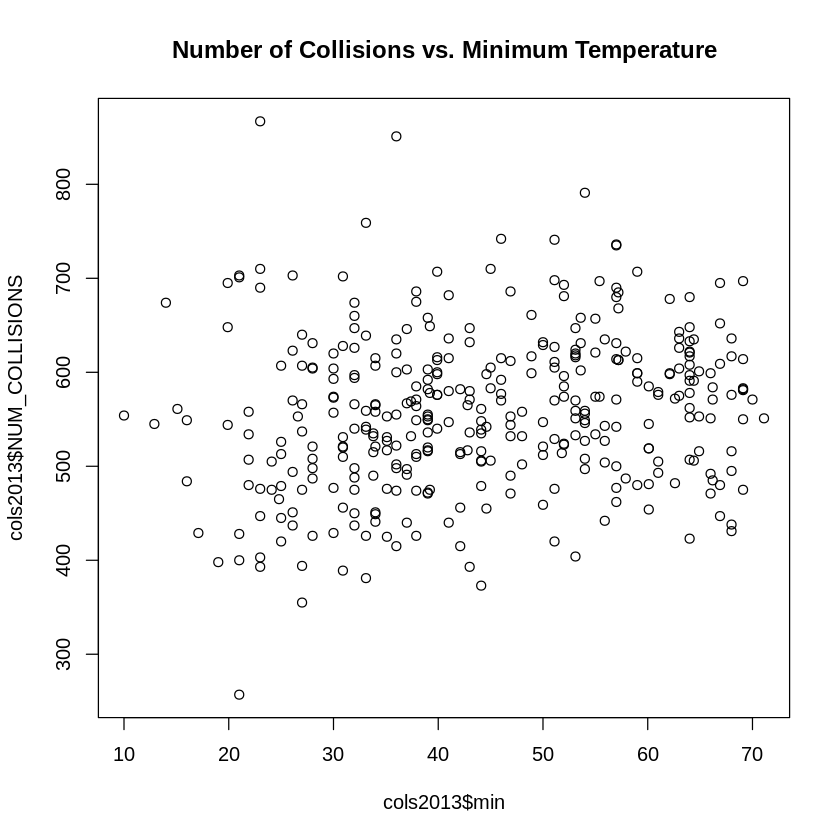

[1] 0.1729896

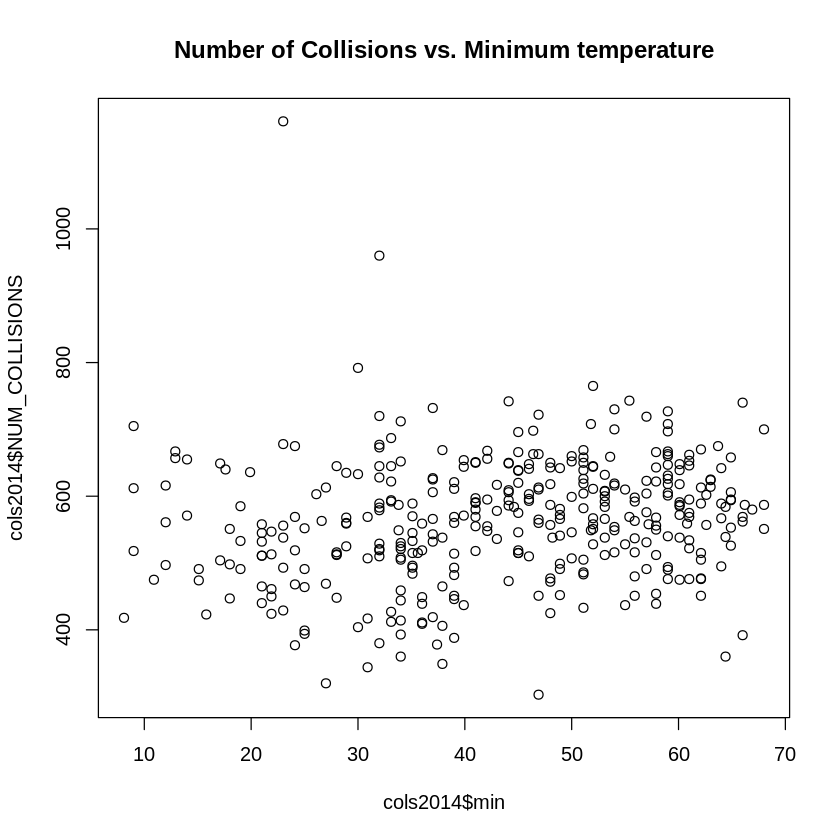

[1] 0.2328649

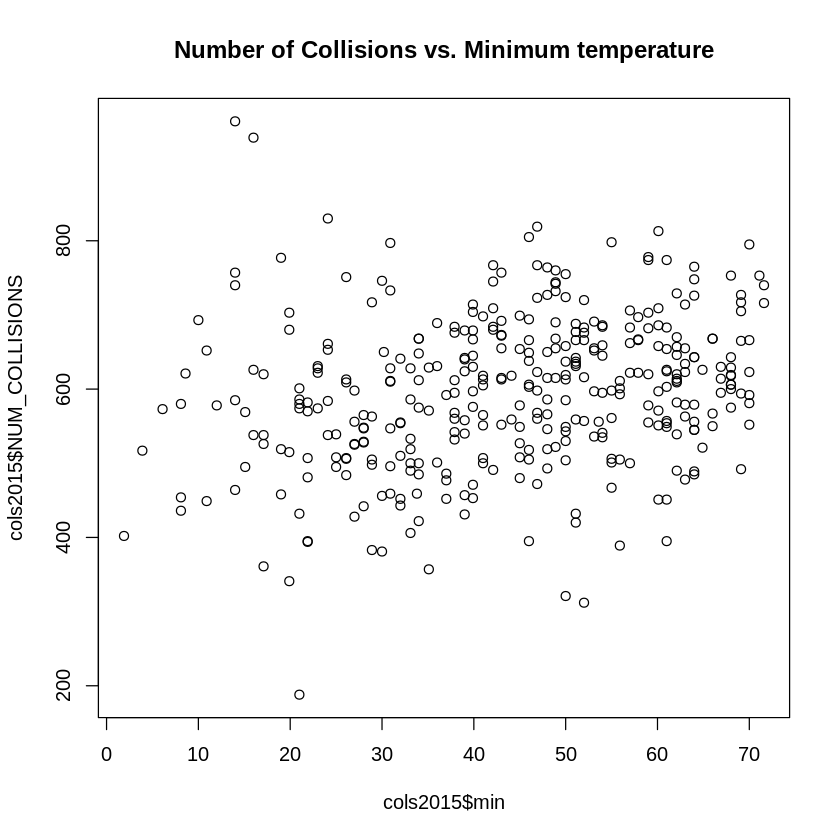

[1] 0.25261

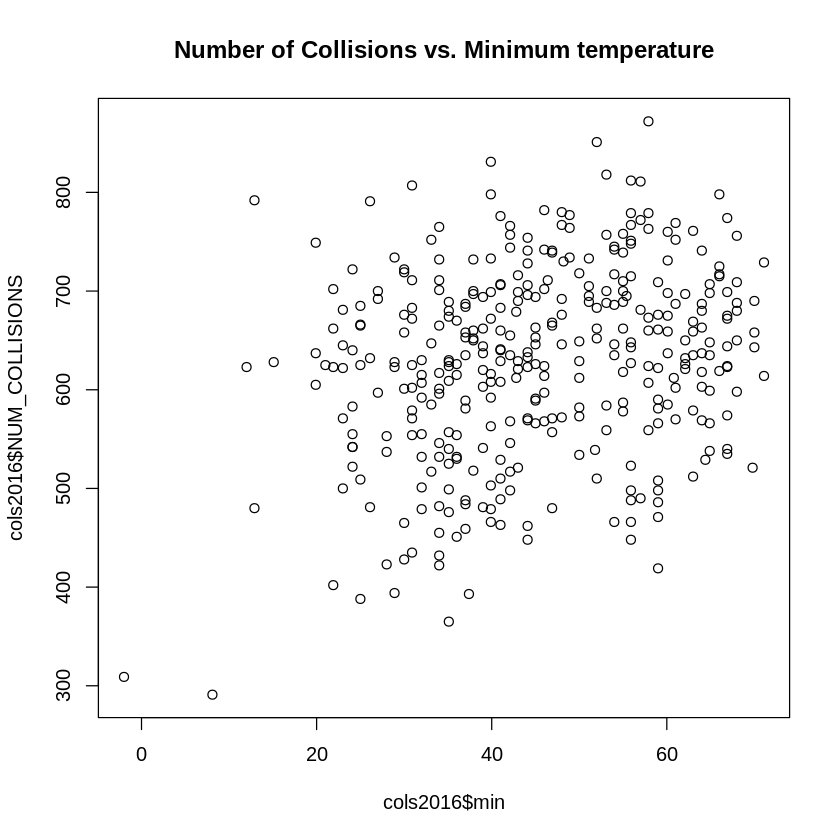

[1] 0.2204531

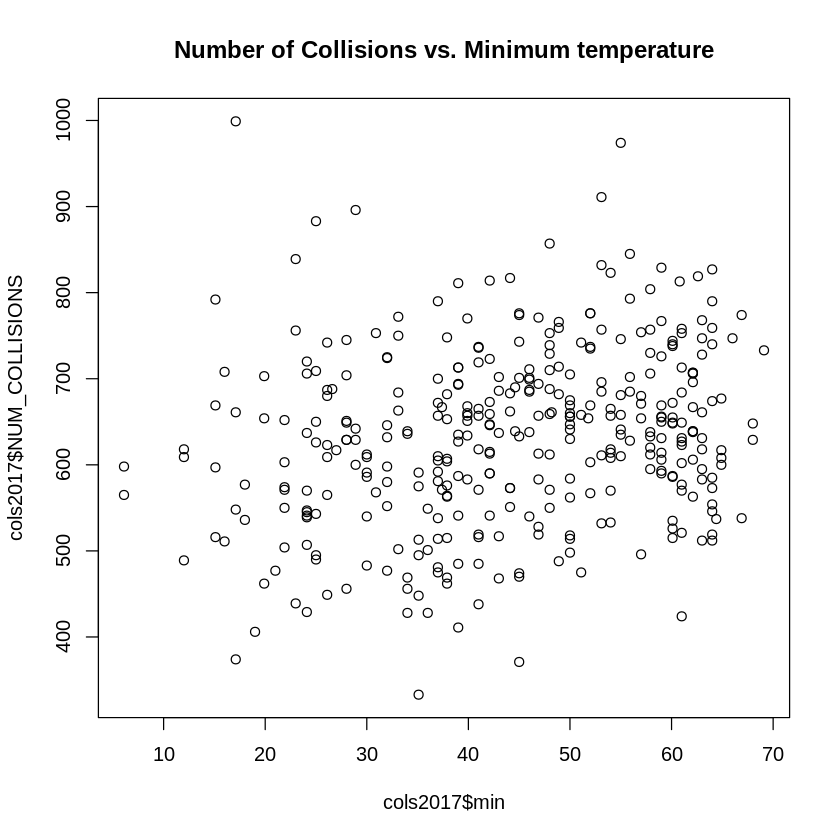

[1] 0.2193521

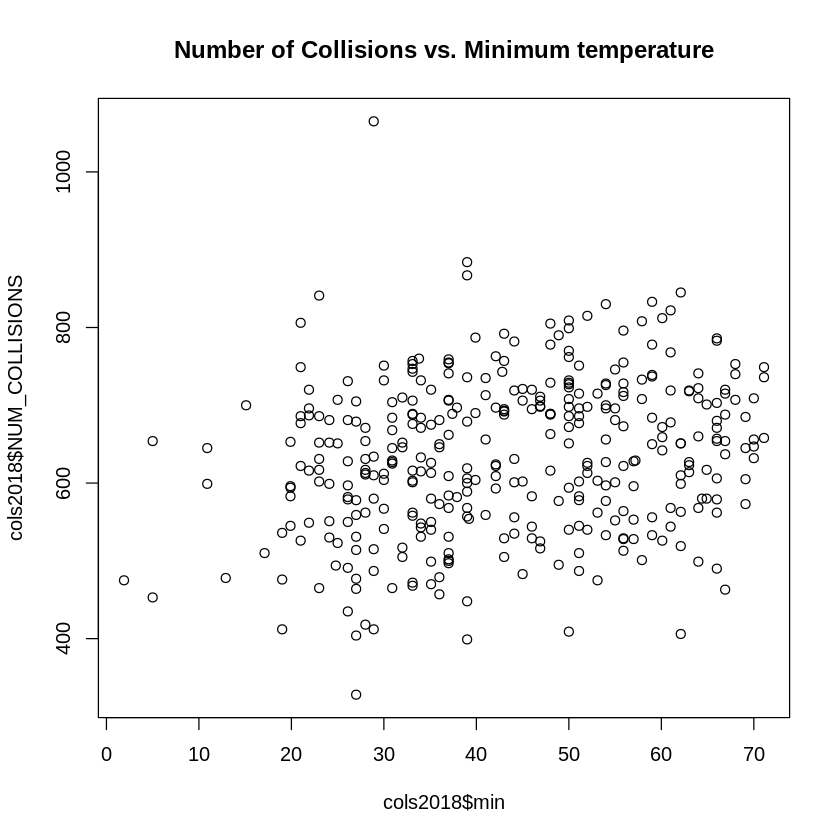

[1] 0.1361838

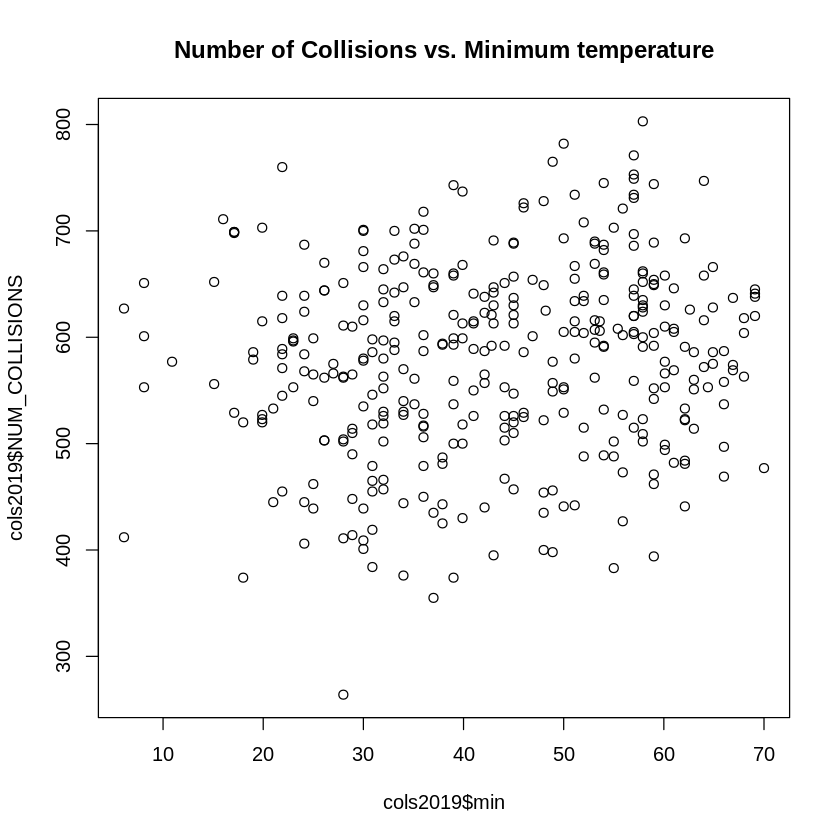

[1] -0.1970906

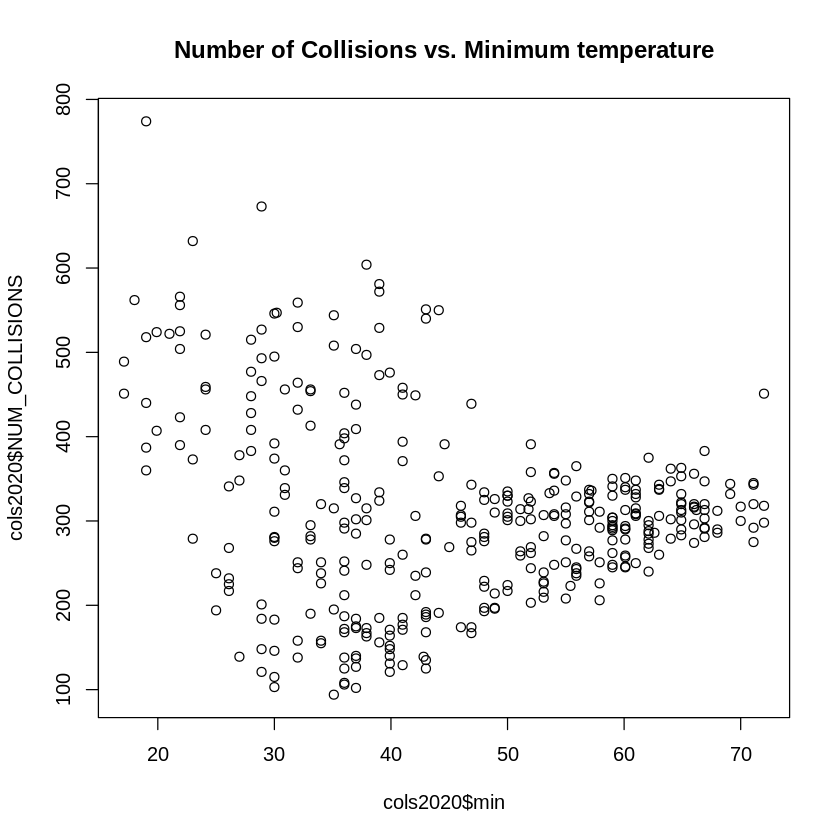

[1] 0.5828033

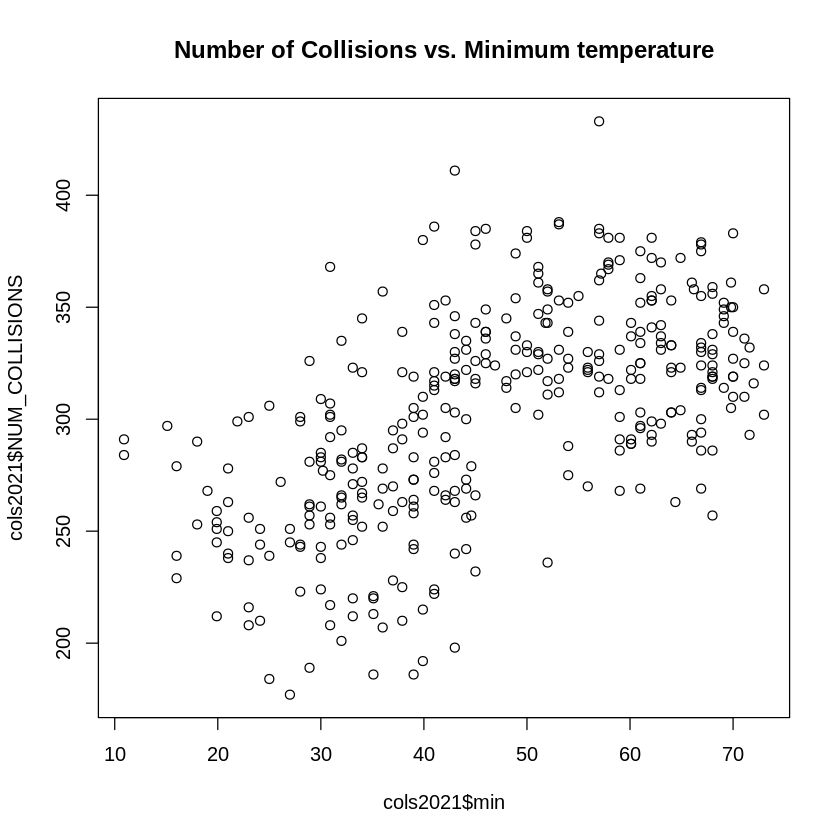

In [70]:
ggplot() +
  geom_point(data=cols2013, aes(min, NUM_COLLISIONS, color="2013")) +
  geom_point(data=cols2014, aes(min, NUM_COLLISIONS, color="2014")) +
  geom_point(data=cols2015, aes(min, NUM_COLLISIONS, color="2015")) +
  geom_point(data=cols2016, aes(min, NUM_COLLISIONS, color="2016")) +
  geom_point(data=cols2017, aes(min, NUM_COLLISIONS, color="2017")) +
  geom_point(data=cols2018, aes(min, NUM_COLLISIONS, color="2018")) +
  geom_point(data=cols2019, aes(min, NUM_COLLISIONS, color="2019")) +
  geom_point(data=cols2020, aes(min, NUM_COLLISIONS, color="2020")) +
  geom_point(data=cols2021, aes(min, NUM_COLLISIONS, color="2021"))
plot(cols2013$min, cols2013$NUM_COLLISIONS, main="Number of Collisions vs. Minimum Temperature")
cor(cols2013$min,cols2013$NUM_COLLISIONS)
plot(cols2014$min, cols2014$NUM_COLLISIONS, main="Number of Collisions vs. Minimum temperature")
cor(cols2014$min,cols2014$NUM_COLLISIONS)
plot(cols2015$min, cols2015$NUM_COLLISIONS, main="Number of Collisions vs. Minimum temperature")
cor(cols2015$min,cols2015$NUM_COLLISIONS)
plot(cols2016$min, cols2016$NUM_COLLISIONS, main="Number of Collisions vs. Minimum temperature")
cor(cols2016$min,cols2016$NUM_COLLISIONS)
plot(cols2017$min, cols2017$NUM_COLLISIONS, main="Number of Collisions vs. Minimum temperature")
cor(cols2017$min,cols2017$NUM_COLLISIONS)
plot(cols2018$min, cols2018$NUM_COLLISIONS, main="Number of Collisions vs. Minimum temperature")
cor(cols2018$min,cols2018$NUM_COLLISIONS)
plot(cols2019$min, cols2019$NUM_COLLISIONS, main="Number of Collisions vs. Minimum temperature")
cor(cols2019$min,cols2019$NUM_COLLISIONS)
plot(cols2020$min, cols2020$NUM_COLLISIONS, main="Number of Collisions vs. Minimum temperature")
cor(cols2020$min,cols2020$NUM_COLLISIONS)
plot(cols2021$min, cols2021$NUM_COLLISIONS, main="Number of Collisions vs. Minimum temperature")
cor(cols2021$min,cols2021$NUM_COLLISIONS)

##Pressure
From the charts below and the low correlation values, it is clear that there is no linear relationship between the number of collisions and the pressure.

The charts for 2015 and 2020 both show an outlying value, presumably a data entry error. This significantly skews the charts produced and the correlation value. In order to accurately visualise any relationships this outlying data must be removed or excluded.

Warning message:
“Removed 1 rows containing missing values (geom_point).”
Warning message:
“Removed 1 rows containing missing values (geom_point).”


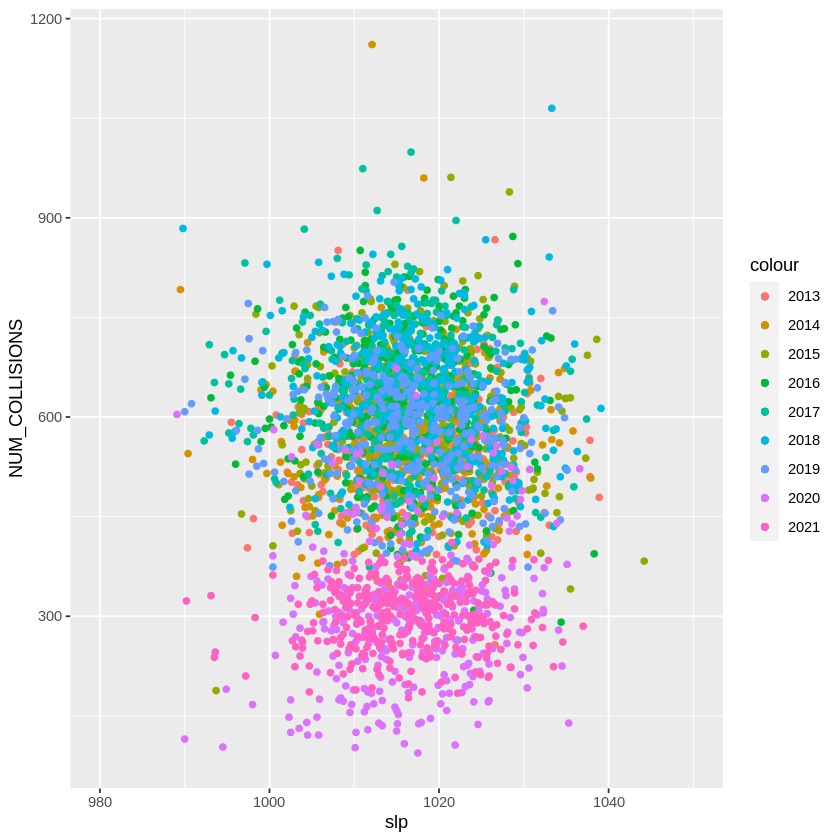

[1] 0.02121662

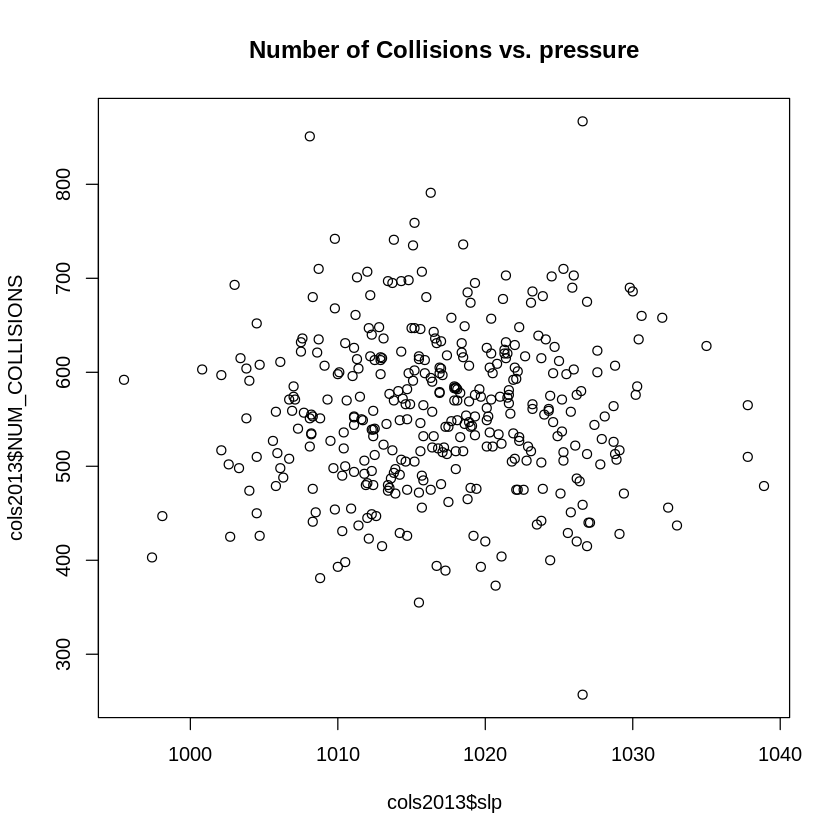

[1] -0.02982472

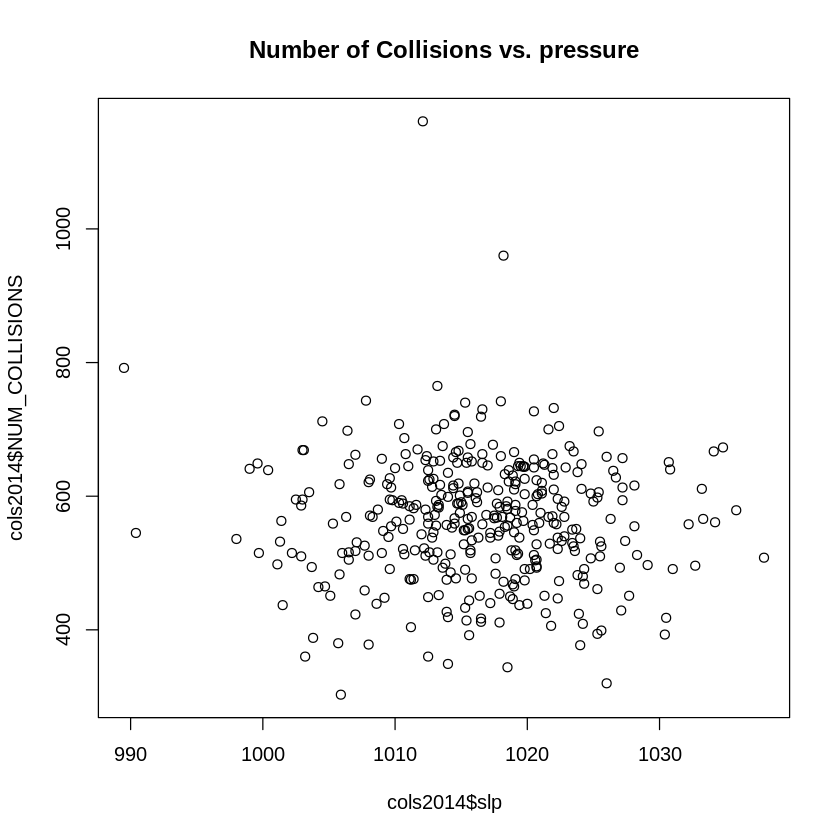

[1] -0.03588087

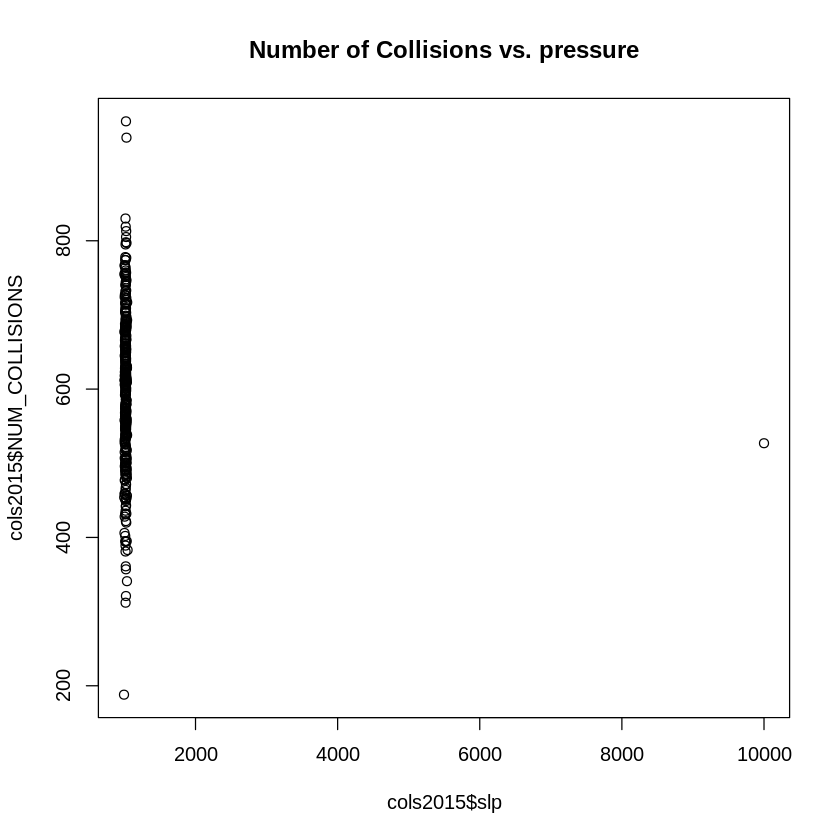

[1] -0.02305999

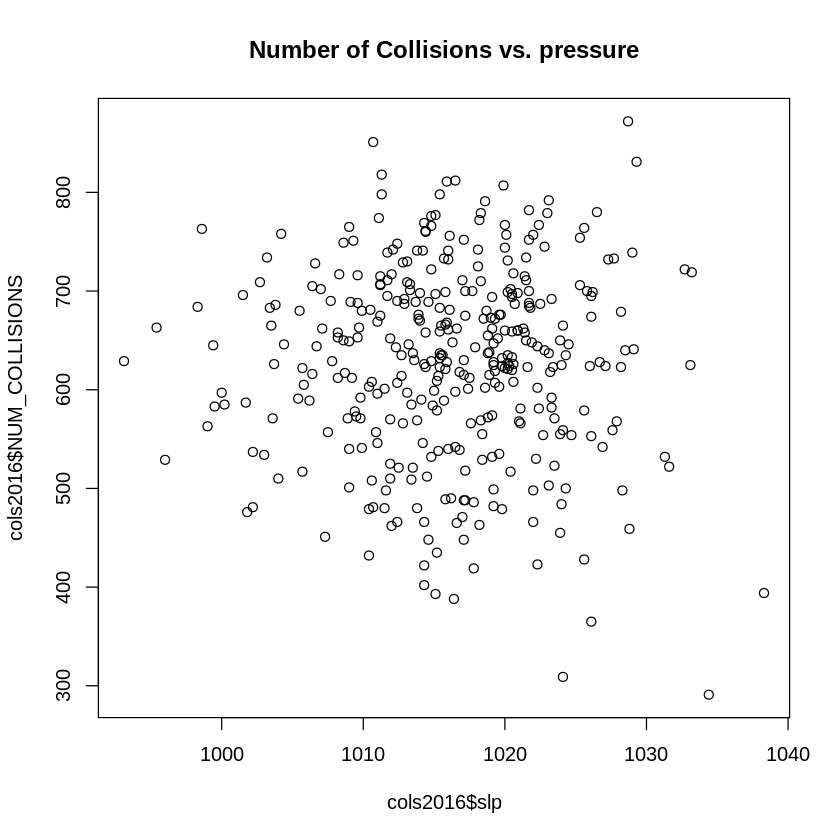

[1] -0.06928943

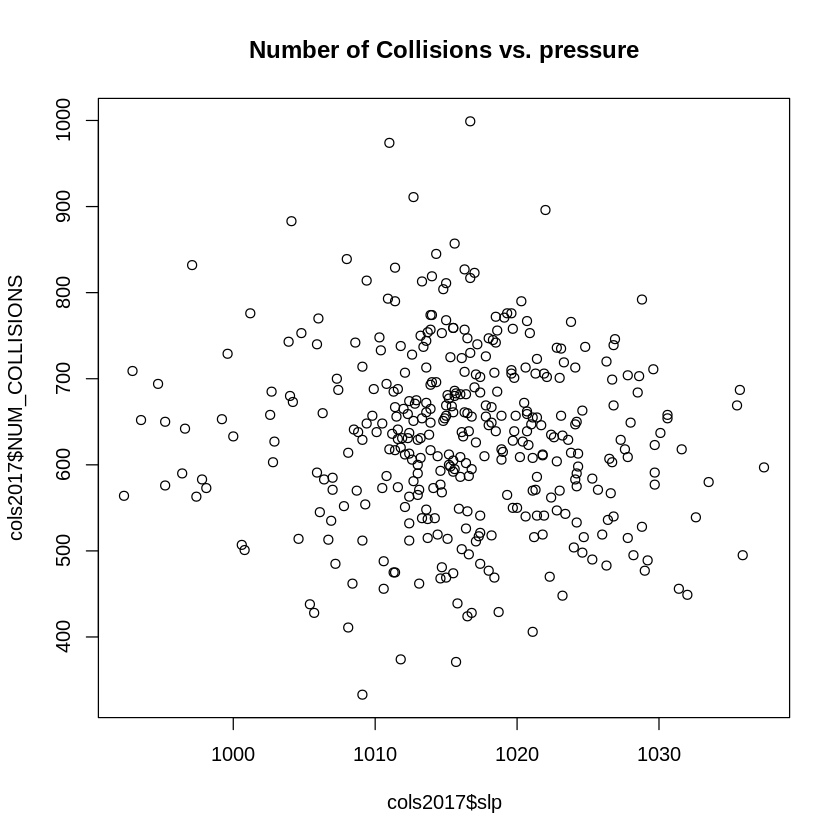

[1] -0.1536497

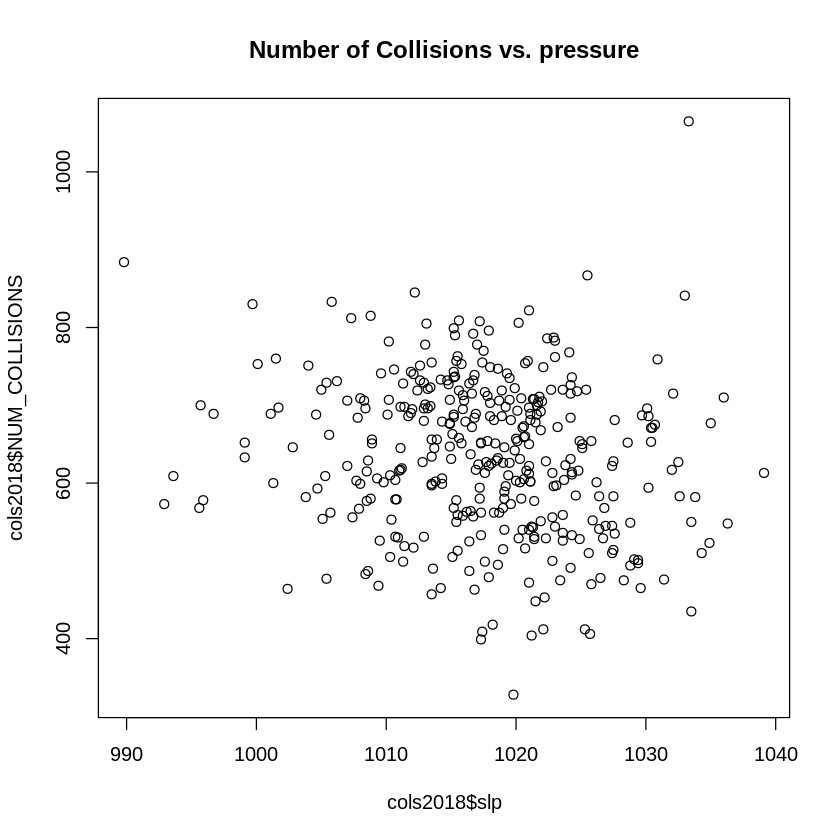

[1] -0.1208627

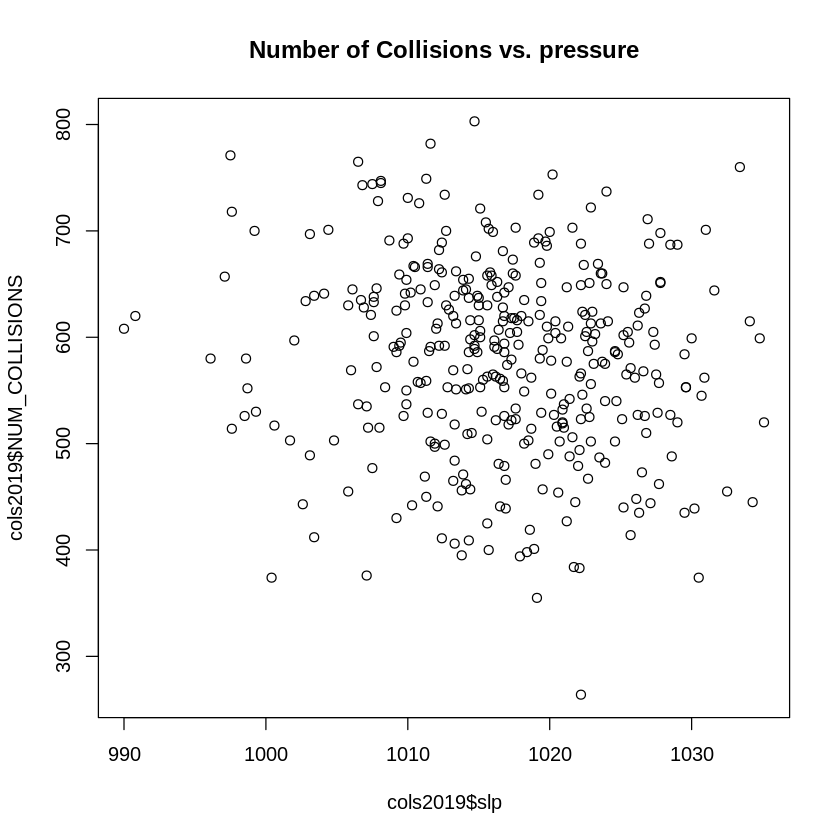

[1] 0.006426374

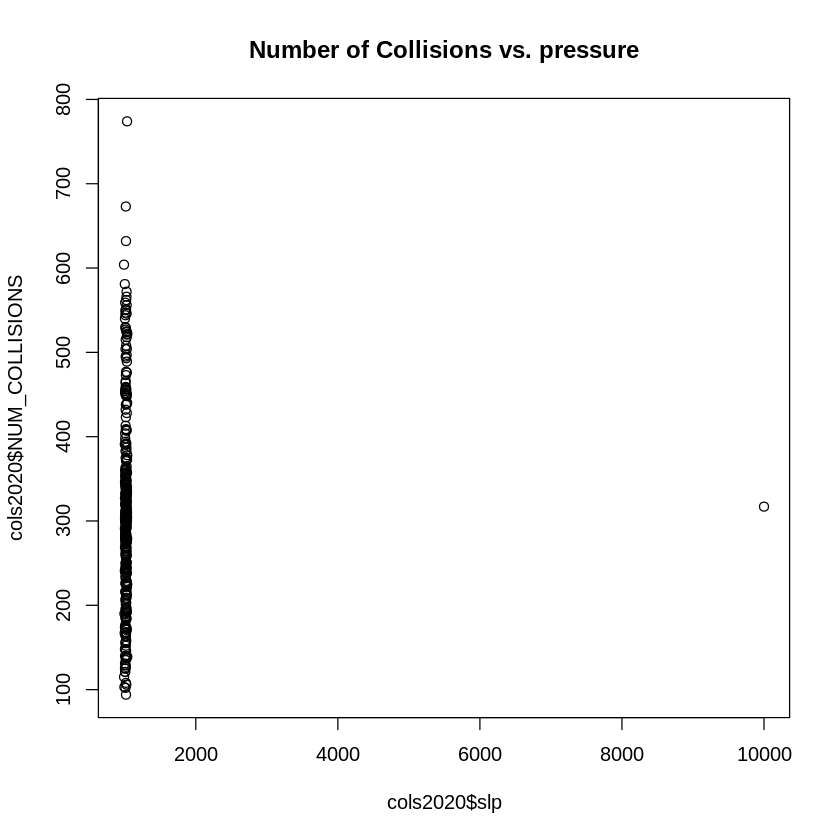

[1] 0.04460402

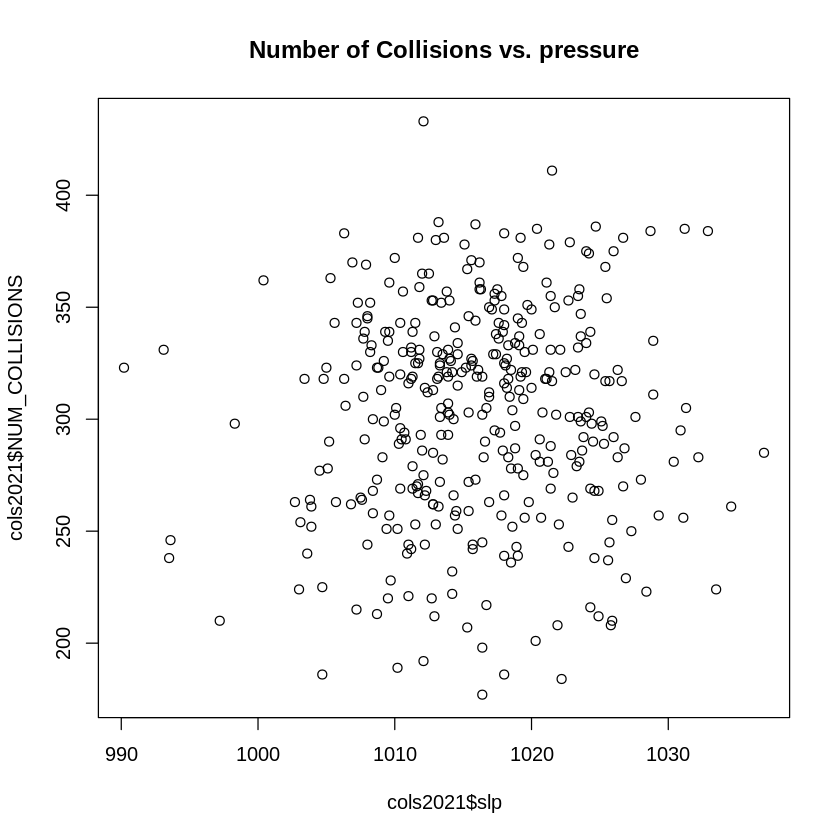

In [71]:
sp <- ggplot() +
  geom_point(data=cols2013, aes(slp, NUM_COLLISIONS, color="2013")) +
  geom_point(data=cols2014, aes(slp, NUM_COLLISIONS, color="2014")) +
  geom_point(data=cols2015, aes(slp, NUM_COLLISIONS, color="2015")) +
  geom_point(data=cols2016, aes(slp, NUM_COLLISIONS, color="2016")) +
  geom_point(data=cols2017, aes(slp, NUM_COLLISIONS, color="2017")) +
  geom_point(data=cols2018, aes(slp, NUM_COLLISIONS, color="2018")) +
  geom_point(data=cols2019, aes(slp, NUM_COLLISIONS, color="2019")) +
  geom_point(data=cols2020, aes(slp, NUM_COLLISIONS, color="2020")) +
  geom_point(data=cols2021, aes(slp, NUM_COLLISIONS, color="2021"))
sp+xlim(980, 1050)
plot(cols2013$slp, cols2013$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2013$slp,cols2013$NUM_COLLISIONS)
plot(cols2014$slp, cols2014$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2014$slp,cols2014$NUM_COLLISIONS)
plot(cols2015$slp, cols2015$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2015$slp,cols2015$NUM_COLLISIONS)
plot(cols2016$slp, cols2016$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2016$slp,cols2016$NUM_COLLISIONS)
plot(cols2017$slp, cols2017$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2017$slp,cols2017$NUM_COLLISIONS)
plot(cols2018$slp, cols2018$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2018$slp,cols2018$NUM_COLLISIONS)
plot(cols2019$slp, cols2019$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2019$slp,cols2019$NUM_COLLISIONS)
plot(cols2020$slp, cols2020$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2020$slp,cols2020$NUM_COLLISIONS)
plot(cols2021$slp, cols2021$NUM_COLLISIONS, main="Number of Collisions vs. pressure")
cor(cols2021$slp,cols2021$NUM_COLLISIONS)

##Visibility
The charts and correlation values below show that there is no linear relationship between visibility and the number of collisions.

The charts also show that the majority of collisions occur when visibility is at its maximum value. This is also shown  in the summary data for the column, as the median trends towards the maximum value.

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.200   7.200   9.400   8.337  10.000  10.000 

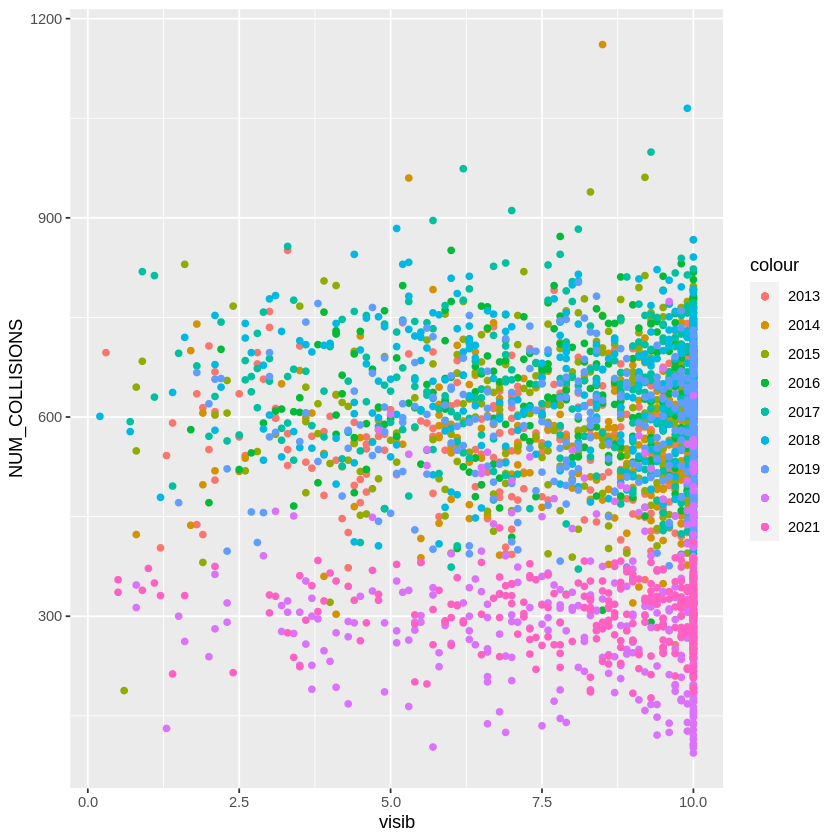

[1] -0.1465263

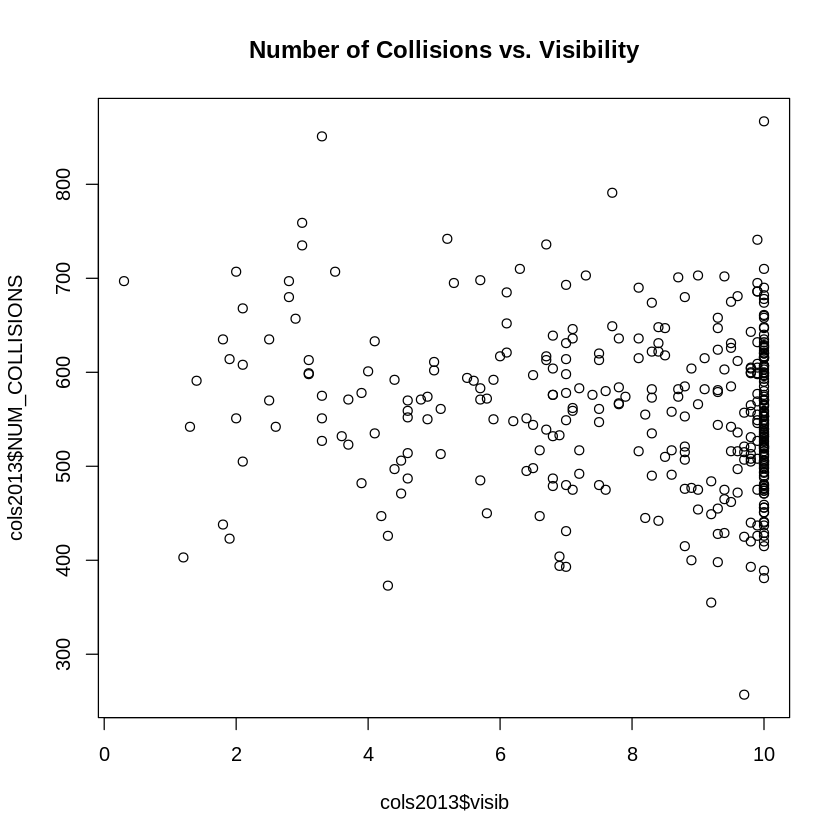

[1] -0.05466283

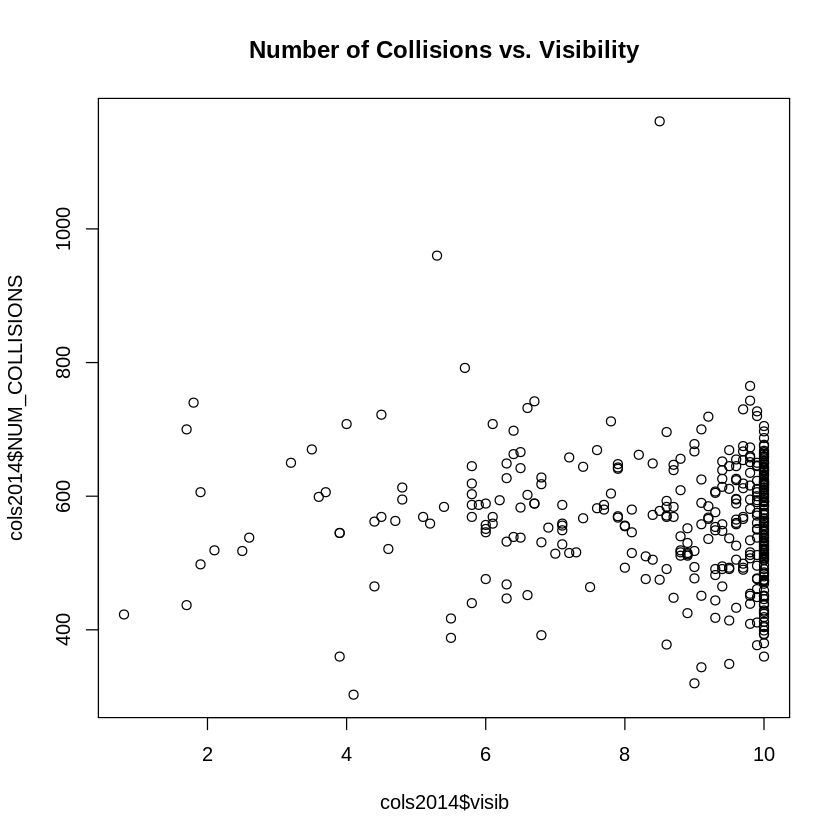

[1] -0.007399972

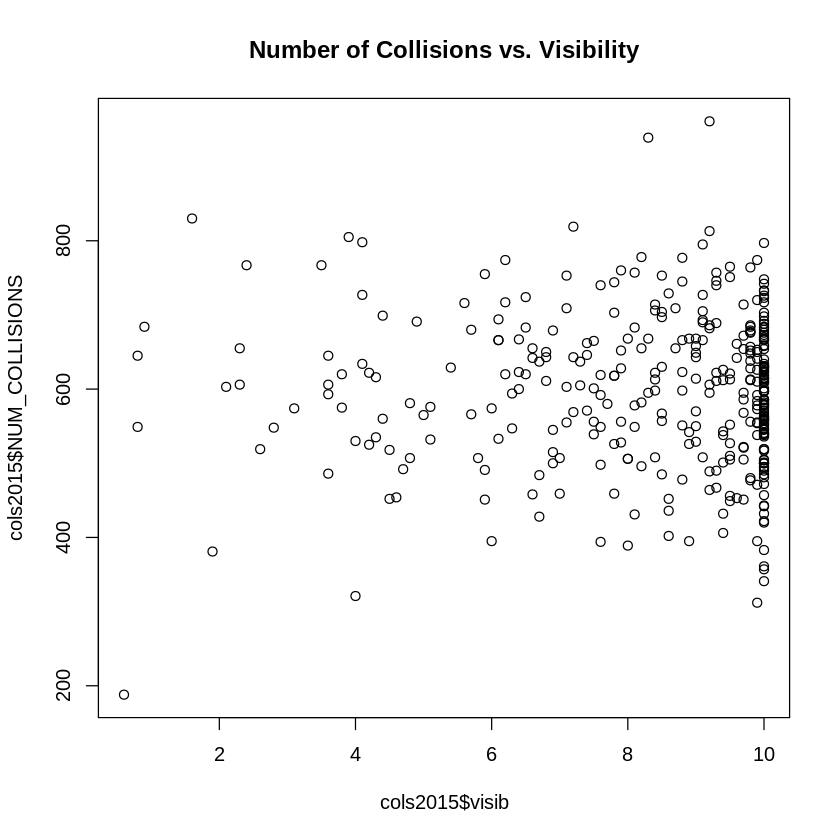

[1] 0.0112473

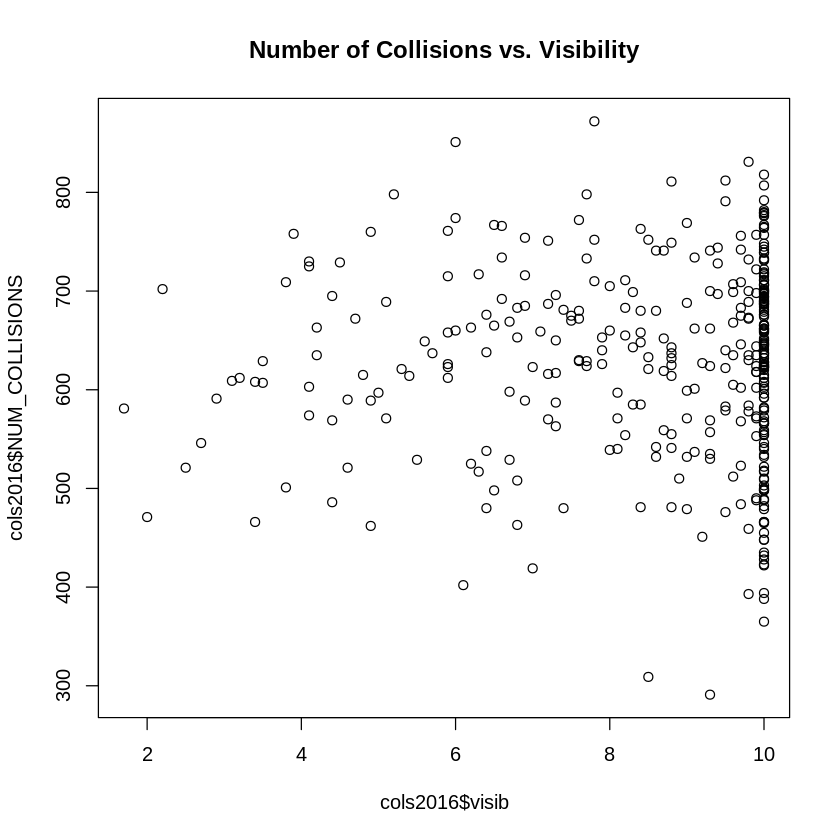

[1] -0.07451094

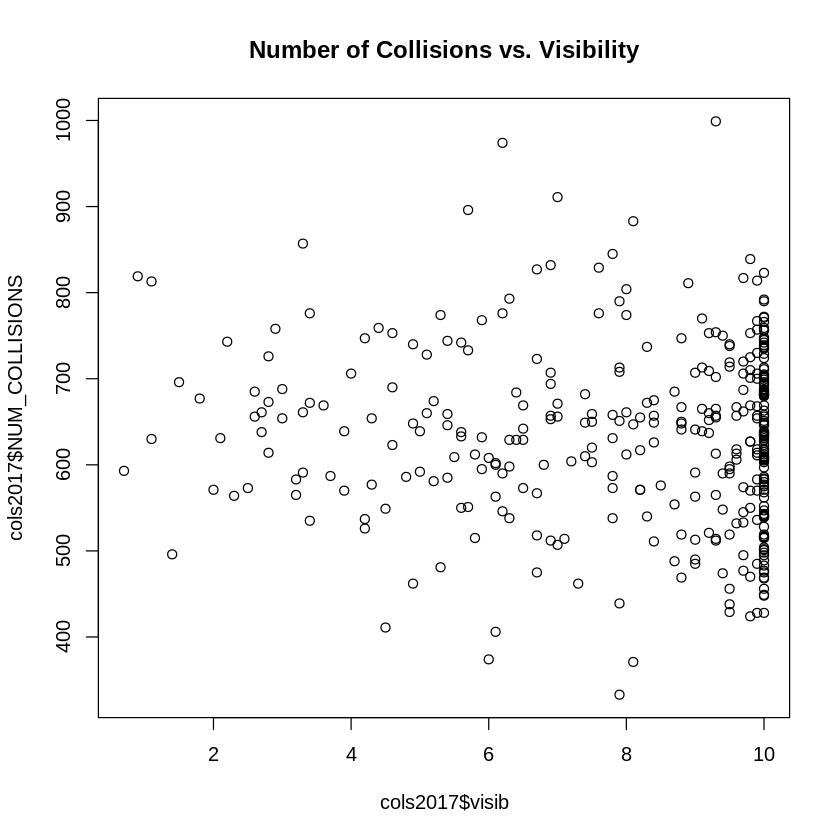

[1] -0.1012374

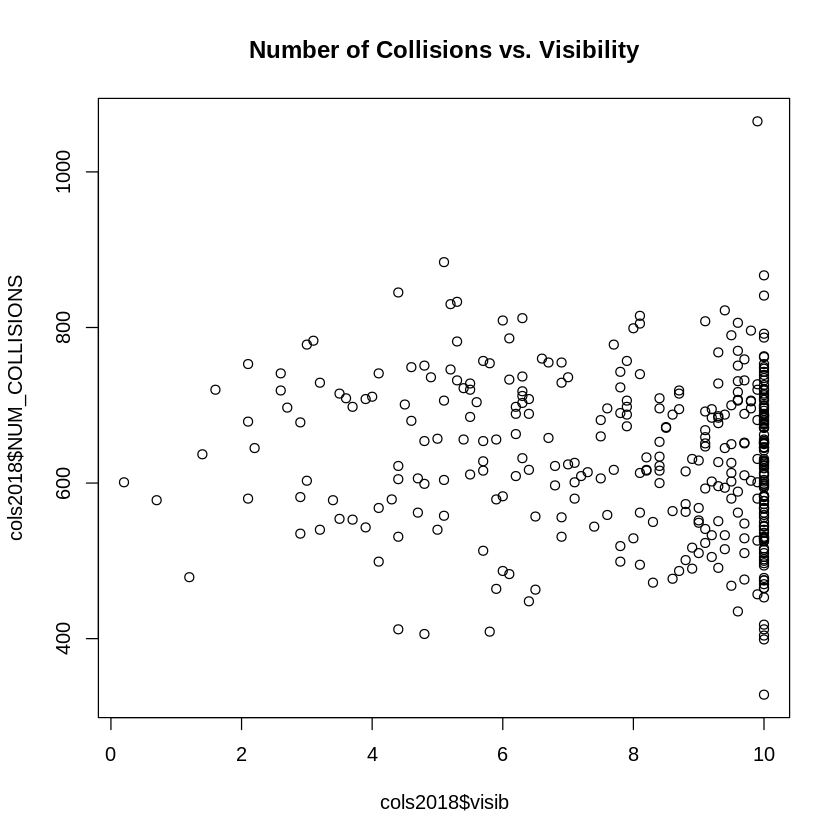

[1] -0.04950622

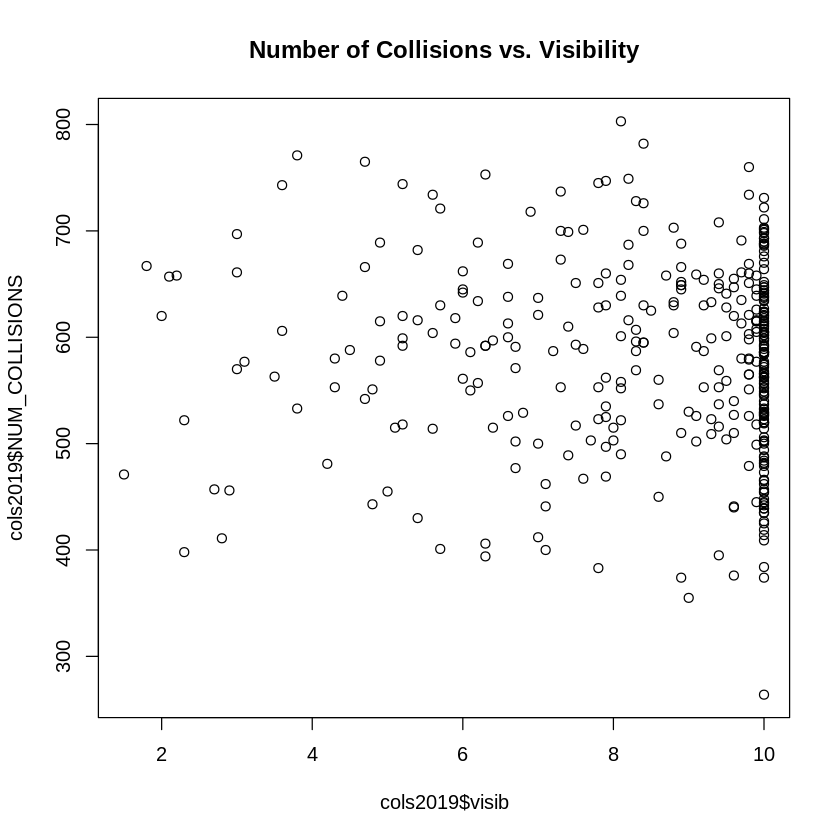

[1] -0.01825201

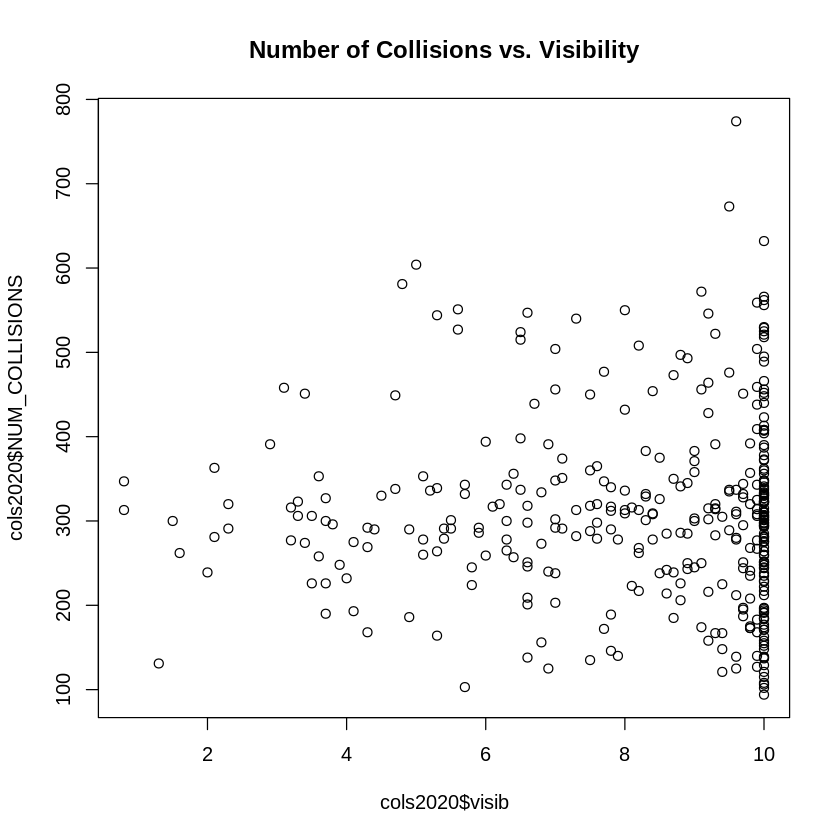

[1] -0.1147415

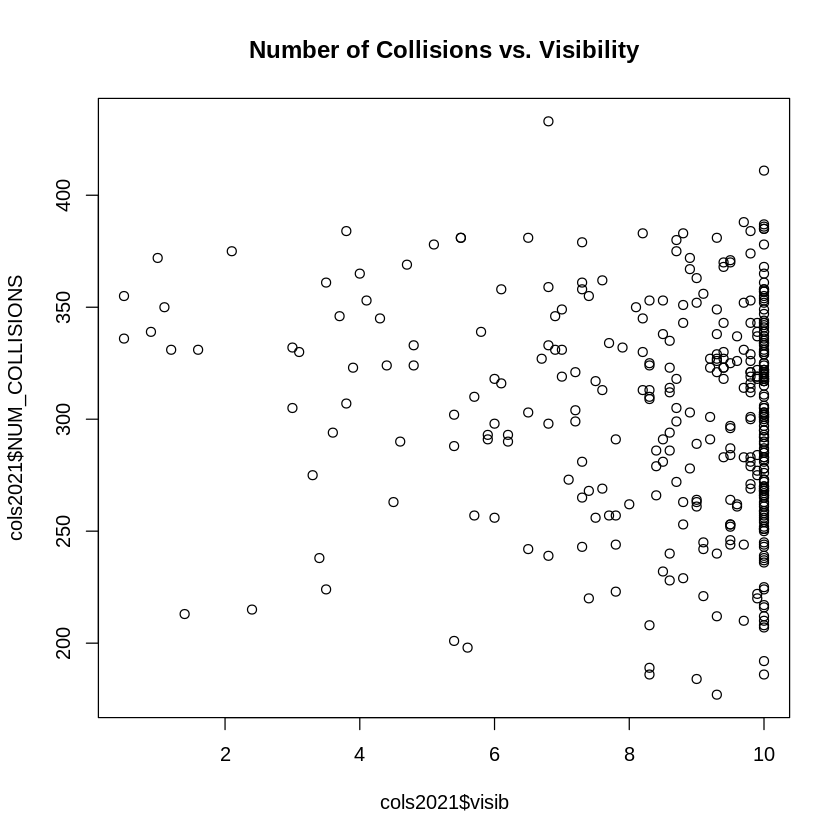

In [72]:
summary(coldata$visib)
ggplot() +
  geom_point(data=cols2013, aes(visib, NUM_COLLISIONS, color="2013")) +
  geom_point(data=cols2014, aes(visib, NUM_COLLISIONS, color="2014")) +
  geom_point(data=cols2015, aes(visib, NUM_COLLISIONS, color="2015")) +
  geom_point(data=cols2016, aes(visib, NUM_COLLISIONS, color="2016")) +
  geom_point(data=cols2017, aes(visib, NUM_COLLISIONS, color="2017")) +
  geom_point(data=cols2018, aes(visib, NUM_COLLISIONS, color="2018")) +
  geom_point(data=cols2019, aes(visib, NUM_COLLISIONS, color="2019")) +
  geom_point(data=cols2020, aes(visib, NUM_COLLISIONS, color="2020")) +
  geom_point(data=cols2021, aes(visib, NUM_COLLISIONS, color="2021"))
plot(cols2013$visib, cols2013$NUM_COLLISIONS, main="Number of Collisions vs. Visibility")
cor(cols2013$visib,cols2013$NUM_COLLISIONS)
plot(cols2014$visib, cols2014$NUM_COLLISIONS, main="Number of Collisions vs. Visibility")
cor(cols2014$visib,cols2014$NUM_COLLISIONS)
plot(cols2015$visib, cols2015$NUM_COLLISIONS, main="Number of Collisions vs. Visibility")
cor(cols2015$visib,cols2015$NUM_COLLISIONS)
plot(cols2016$visib, cols2016$NUM_COLLISIONS, main="Number of Collisions vs. Visibility")
cor(cols2016$visib,cols2016$NUM_COLLISIONS)
plot(cols2017$visib, cols2017$NUM_COLLISIONS, main="Number of Collisions vs. Visibility")
cor(cols2017$visib,cols2017$NUM_COLLISIONS)
plot(cols2018$visib, cols2018$NUM_COLLISIONS, main="Number of Collisions vs. Visibility")
cor(cols2018$visib,cols2018$NUM_COLLISIONS)
plot(cols2019$visib, cols2019$NUM_COLLISIONS, main="Number of Collisions vs. Visibility")
cor(cols2019$visib,cols2019$NUM_COLLISIONS)
plot(cols2020$visib, cols2020$NUM_COLLISIONS, main="Number of Collisions vs. Visibility")
cor(cols2020$visib,cols2020$NUM_COLLISIONS)
plot(cols2021$visib, cols2021$NUM_COLLISIONS, main="Number of Collisions vs. Visibility")
cor(cols2021$visib,cols2021$NUM_COLLISIONS)

##Wind Speed
From the charts below and linear correlation values it can be derived that there is no linear relationship between wind speed and the number of collisions.

Warning message:
“Removed 3 rows containing missing values (geom_point).”
Warning message:
“Removed 4 rows containing missing values (geom_point).”
Warning message:
“Removed 1 rows containing missing values (geom_point).”
Warning message:
“Removed 2 rows containing missing values (geom_point).”
Warning message:
“Removed 3 rows containing missing values (geom_point).”
Warning message:
“Removed 2 rows containing missing values (geom_point).”
Warning message:
“Removed 3 rows containing missing values (geom_point).”
Warning message:
“Removed 2 rows containing missing values (geom_point).”
Warning message:
“Removed 1 rows containing missing values (geom_point).”


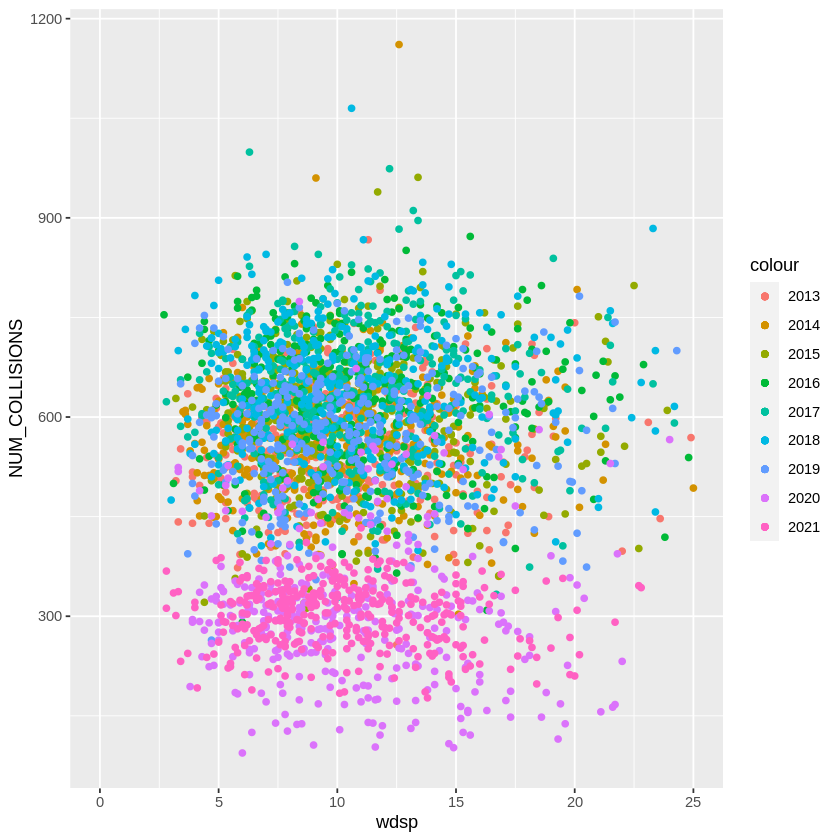

[1] 0.001132197

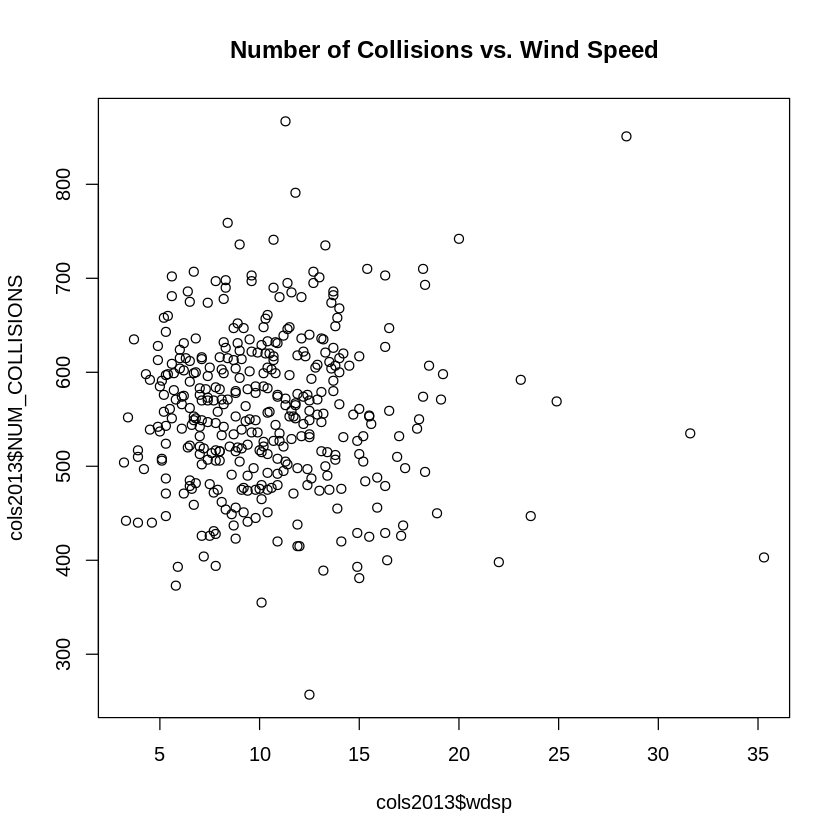

[1] -0.03885164

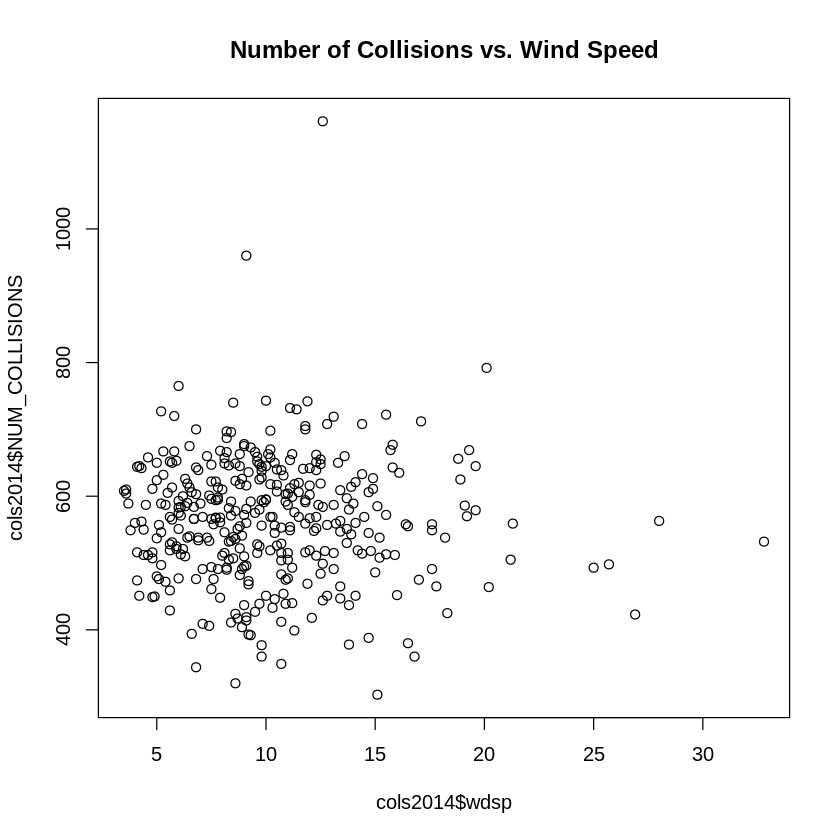

[1] -0.1029442

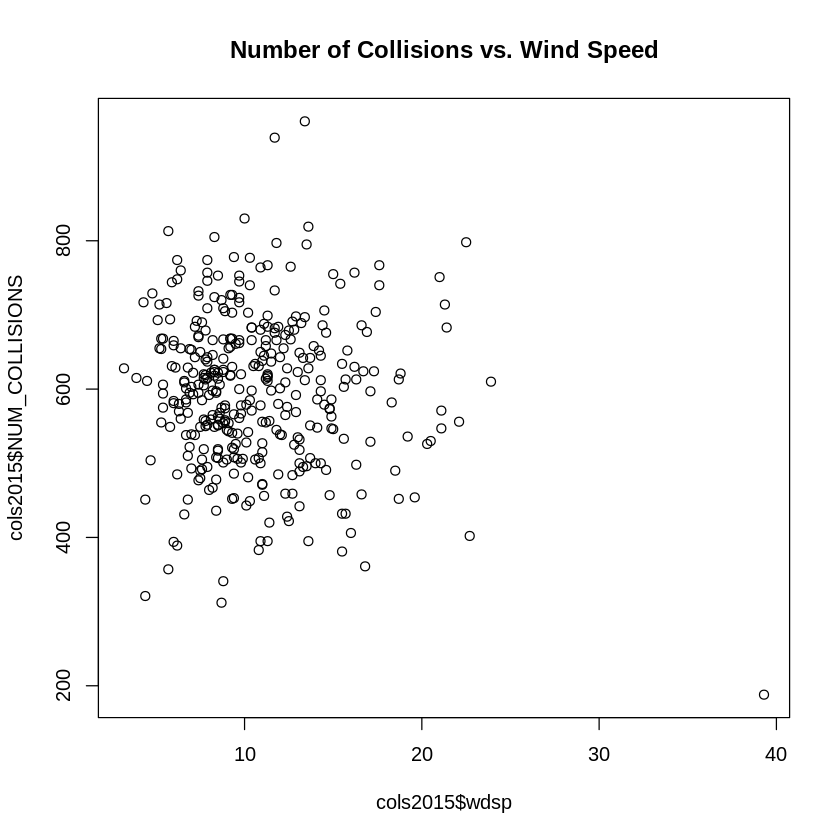

[1] -0.07836416

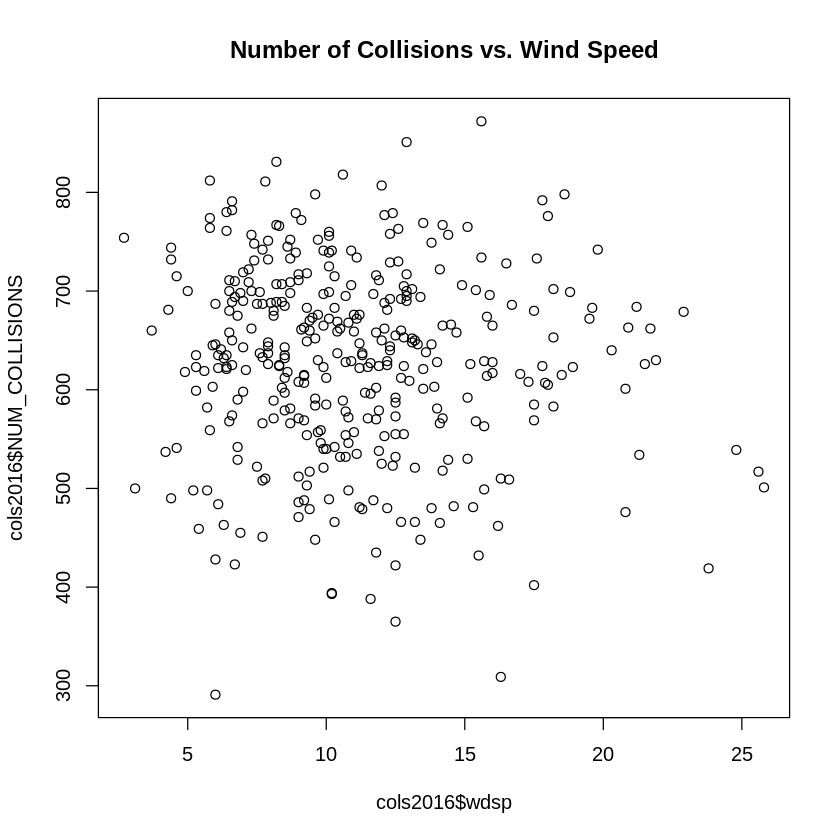

[1] 0.00987308

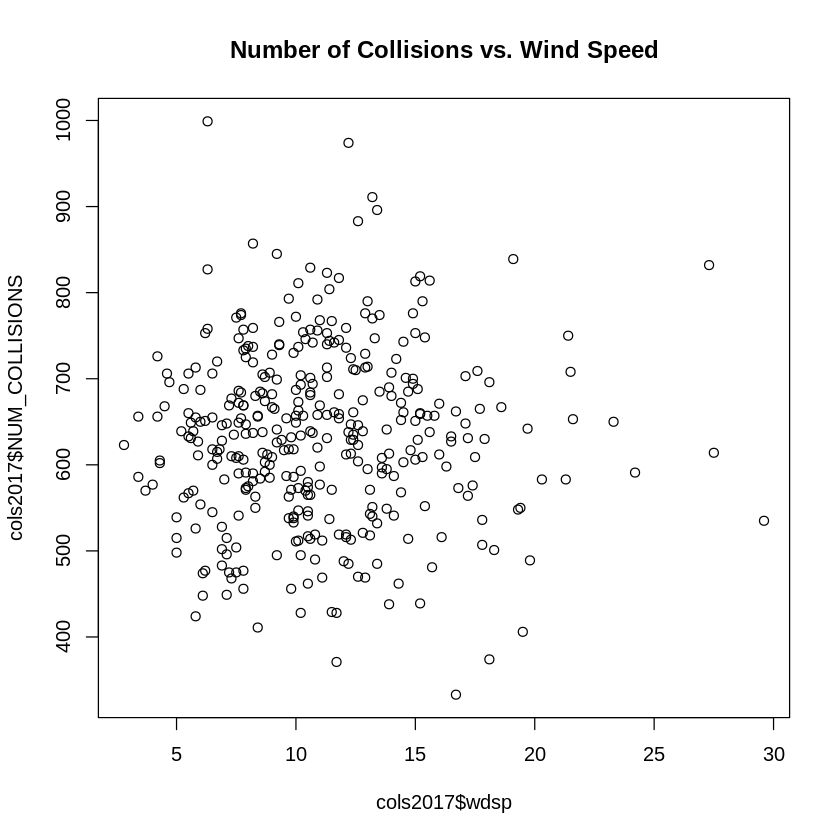

[1] -0.04627451

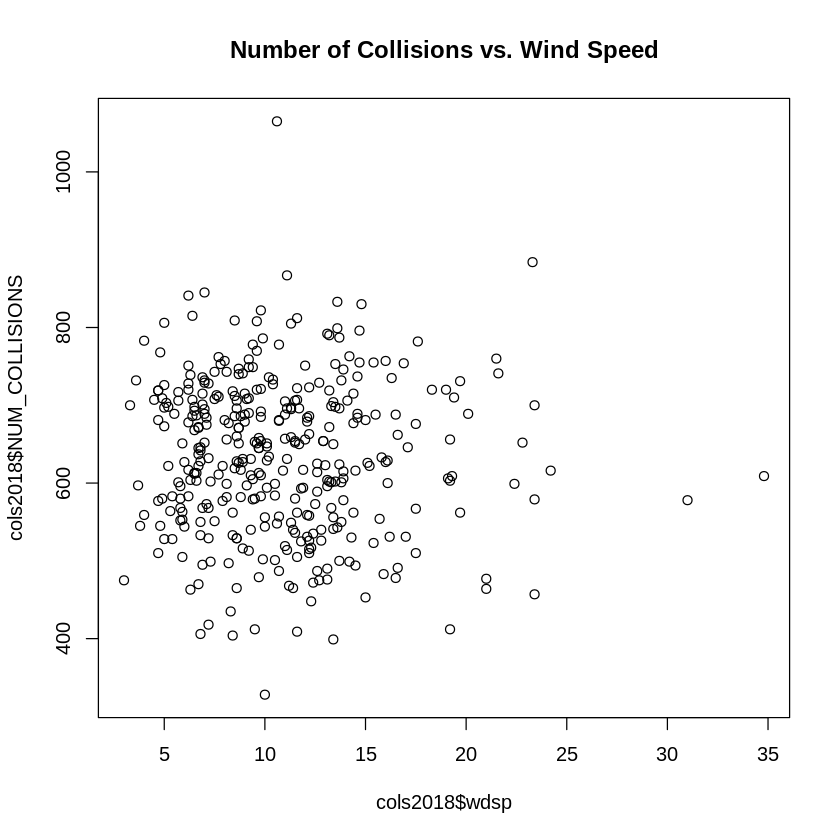

[1] 0.04430334

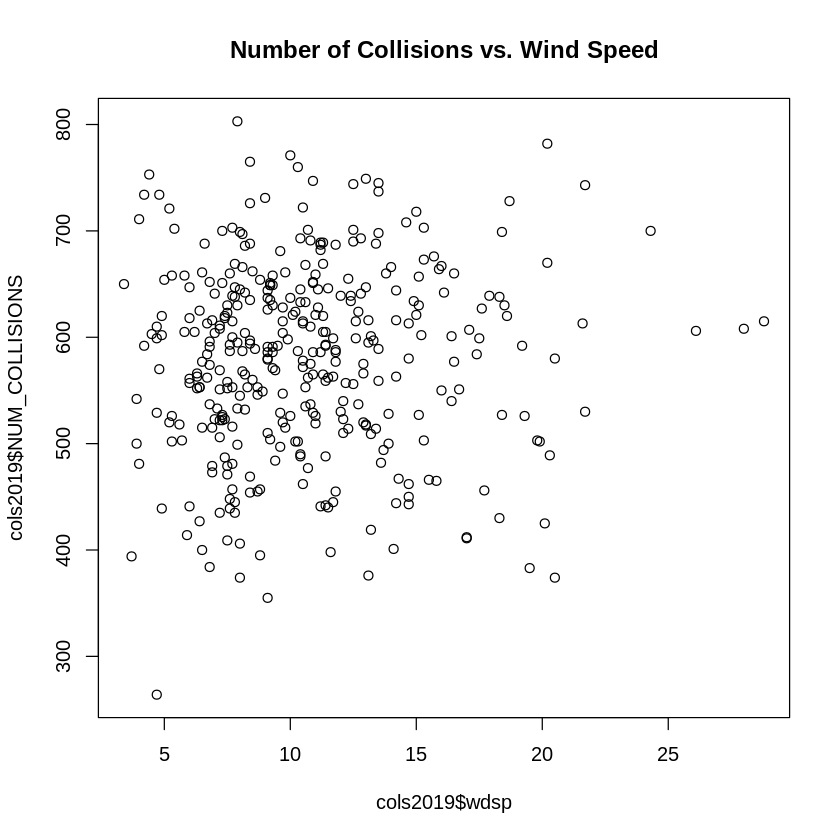

[1] -0.04976372

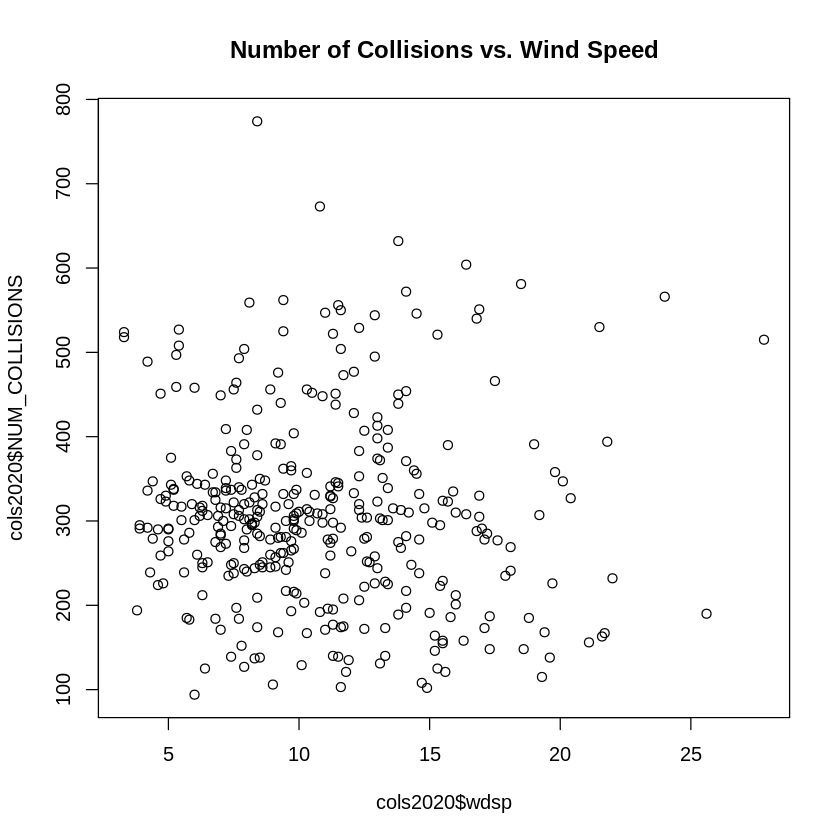

[1] -0.1085519

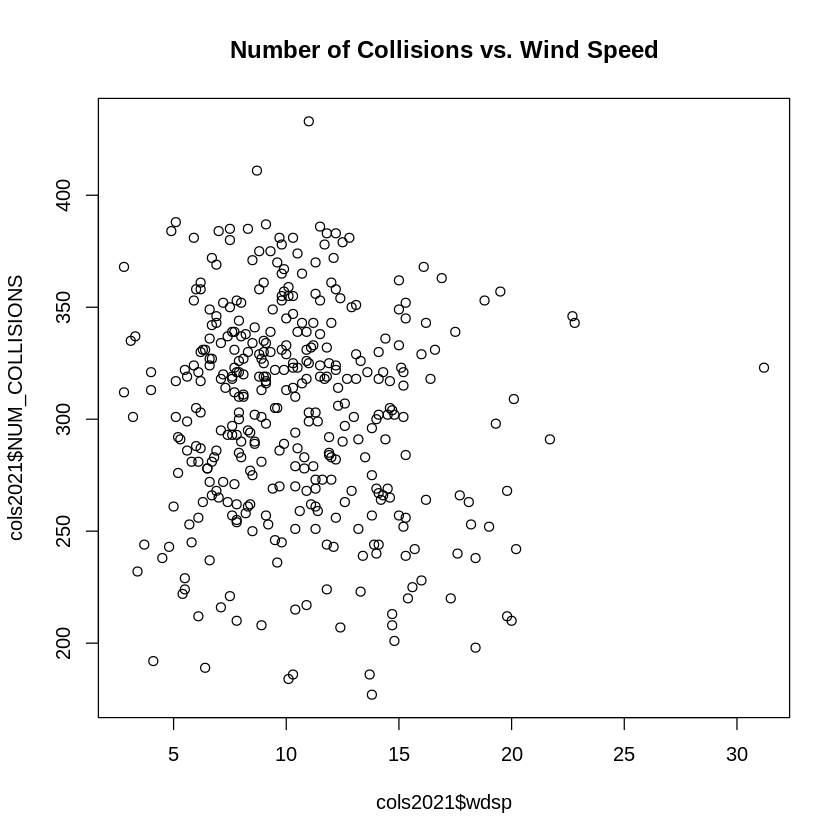

In [73]:
ws <- ggplot() +
  geom_point(data=cols2013, aes(wdsp, NUM_COLLISIONS, color="2013")) +
  geom_point(data=cols2014, aes(wdsp, NUM_COLLISIONS, color="2014")) +
  geom_point(data=cols2015, aes(wdsp, NUM_COLLISIONS, color="2015")) +
  geom_point(data=cols2016, aes(wdsp, NUM_COLLISIONS, color="2016")) +
  geom_point(data=cols2017, aes(wdsp, NUM_COLLISIONS, color="2017")) +
  geom_point(data=cols2018, aes(wdsp, NUM_COLLISIONS, color="2018")) +
  geom_point(data=cols2019, aes(wdsp, NUM_COLLISIONS, color="2019")) +
  geom_point(data=cols2020, aes(wdsp, NUM_COLLISIONS, color="2020")) +
  geom_point(data=cols2021, aes(wdsp, NUM_COLLISIONS, color="2021"))

ws+xlim(0,25)
plot(cols2013$wdsp, cols2013$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2013$wdsp,cols2013$NUM_COLLISIONS)
plot(cols2014$wdsp, cols2014$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2014$wdsp,cols2014$NUM_COLLISIONS)
plot(cols2015$wdsp, cols2015$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2015$wdsp,cols2015$NUM_COLLISIONS)
plot(cols2016$wdsp, cols2016$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2016$wdsp,cols2016$NUM_COLLISIONS)
plot(cols2017$wdsp, cols2017$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2017$wdsp,cols2017$NUM_COLLISIONS)
plot(cols2018$wdsp, cols2018$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2018$wdsp,cols2018$NUM_COLLISIONS)
plot(cols2019$wdsp, cols2019$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2019$wdsp,cols2019$NUM_COLLISIONS)
plot(cols2020$wdsp, cols2020$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2020$wdsp,cols2020$NUM_COLLISIONS)
plot(cols2021$wdsp, cols2021$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(cols2021$wdsp,cols2021$NUM_COLLISIONS)

###Max Wind Speed
As above the maximum wind speed column contains values which infer that no data is available. In order to analyse the data these values must be removed.

As with temperature and the other maximum value columns a similar pattern is observed to the averaged column. This shows there is no linerar corelation between the maximum wind speed and the number of collisions.



Warning message:
“Removed 3 rows containing missing values (geom_point).”
Warning message:
“Removed 6 rows containing missing values (geom_point).”
Warning message:
“Removed 3 rows containing missing values (geom_point).”
Warning message:
“Removed 5 rows containing missing values (geom_point).”
Warning message:
“Removed 6 rows containing missing values (geom_point).”
Warning message:
“Removed 4 rows containing missing values (geom_point).”
Warning message:
“Removed 3 rows containing missing values (geom_point).”
Warning message:
“Removed 8 rows containing missing values (geom_point).”


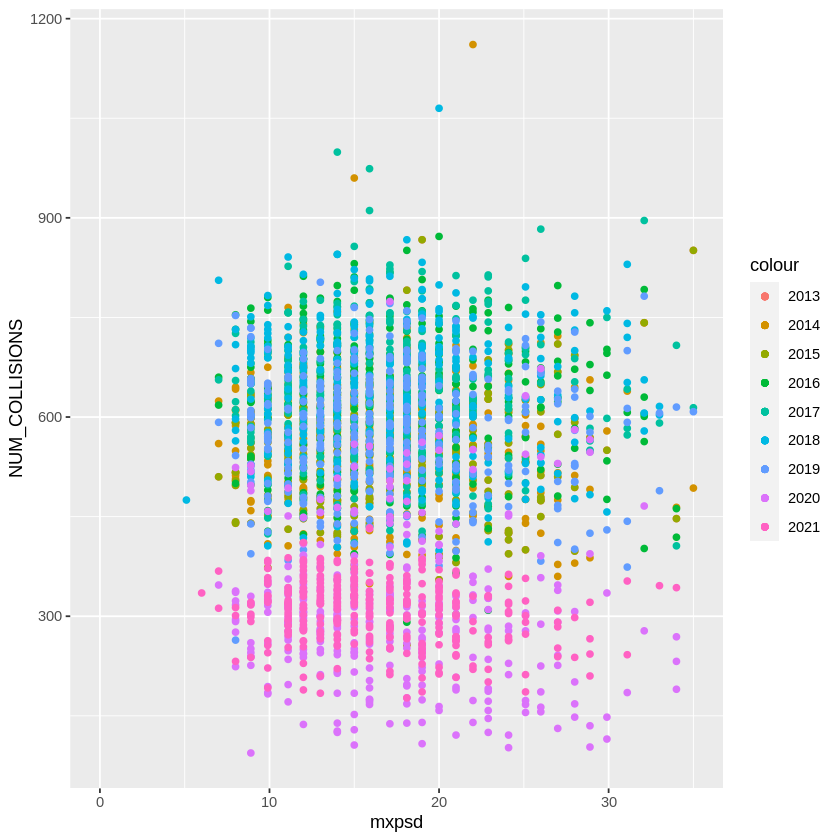

[1] 0.0112242

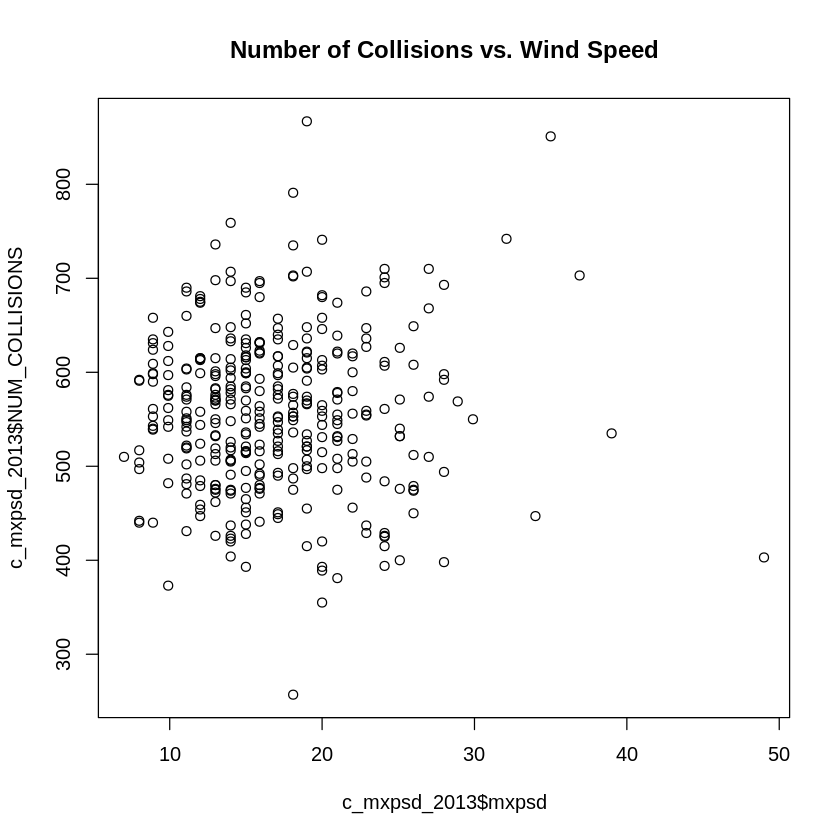

[1] -0.0600791

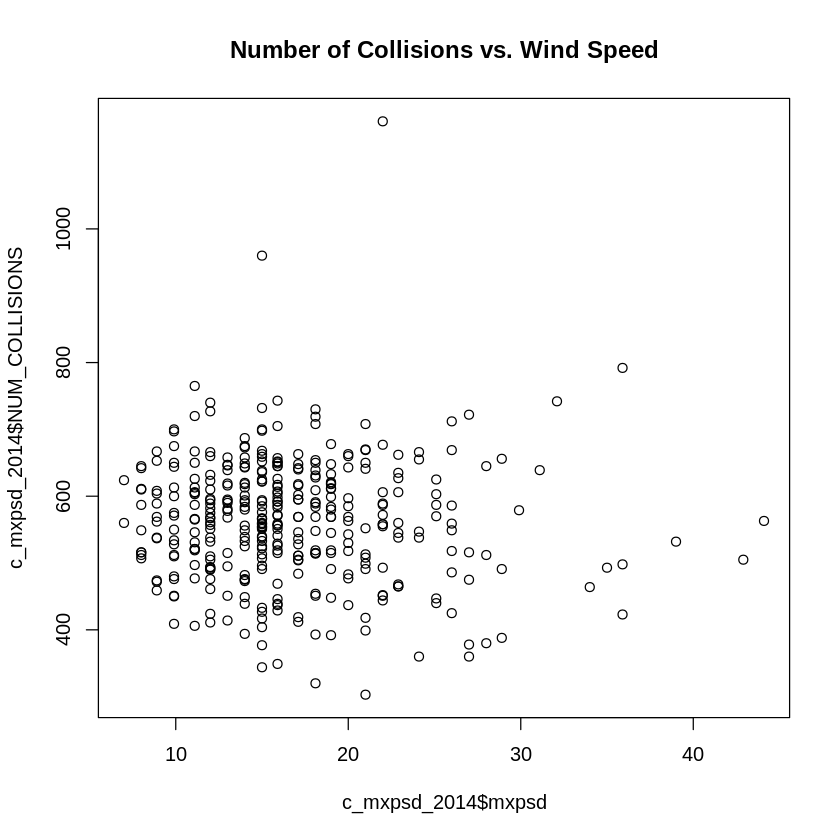

[1] 0.0112242

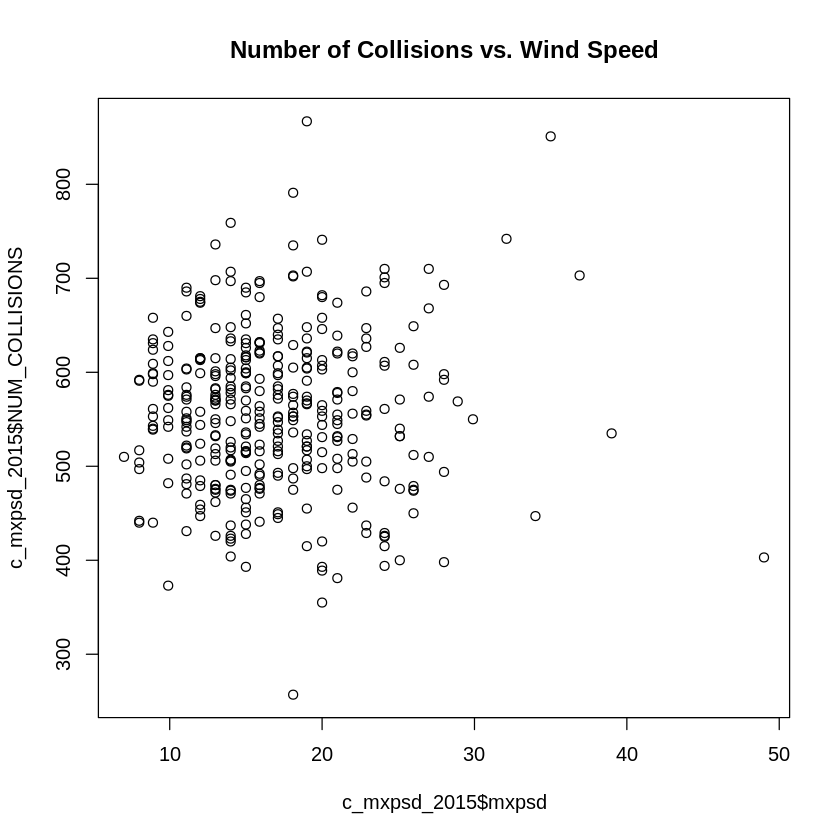

[1] -0.1167966

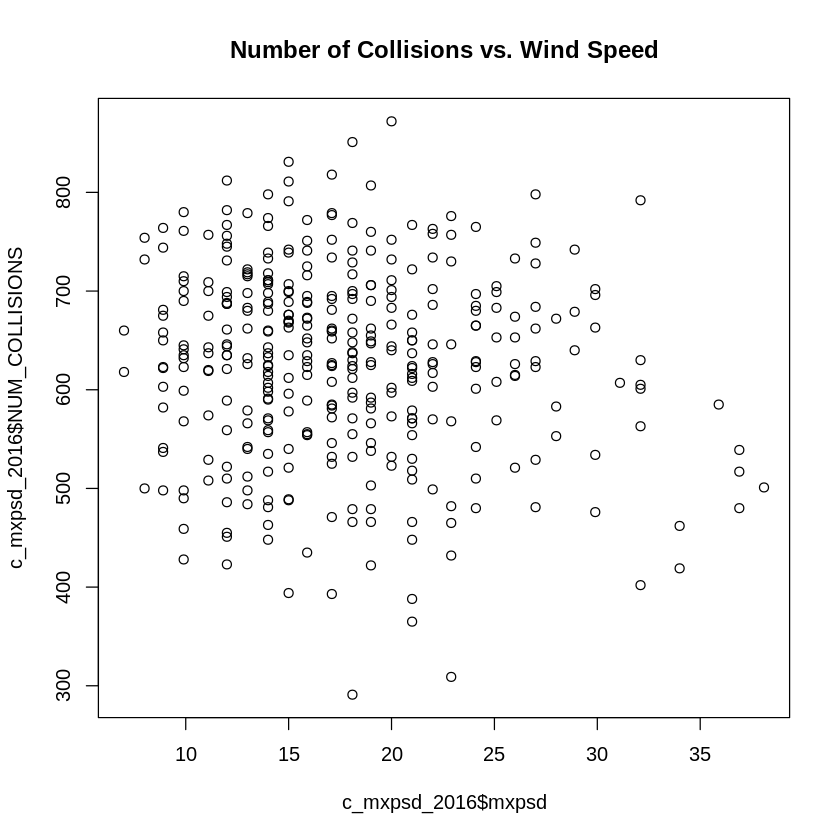

[1] -0.02113353

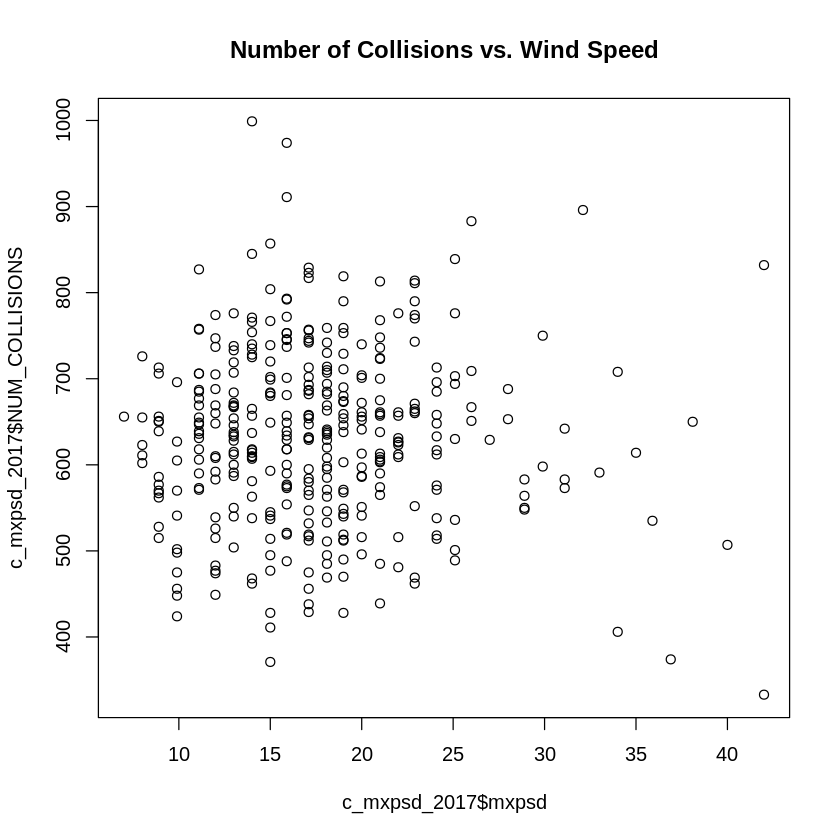

[1] -0.01996223

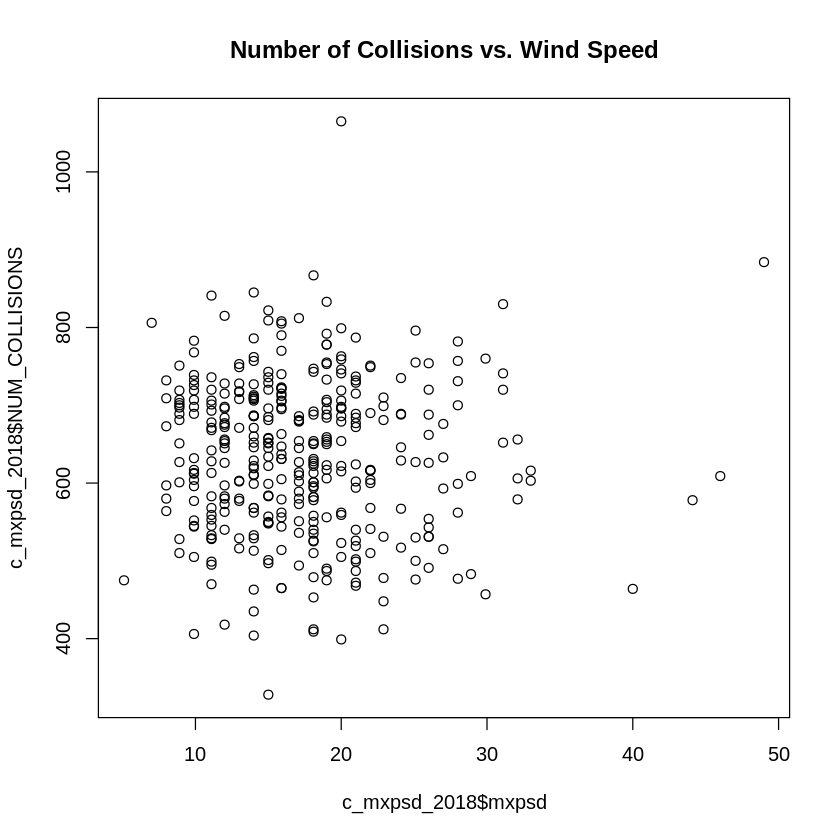

[1] -0.01635937

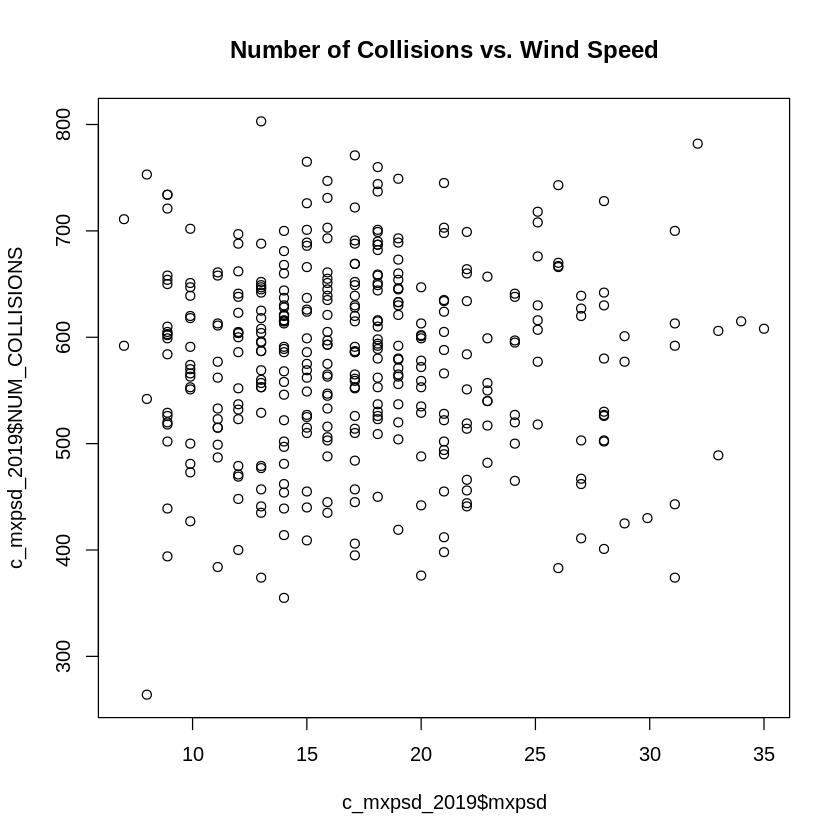

[1] -0.01958489

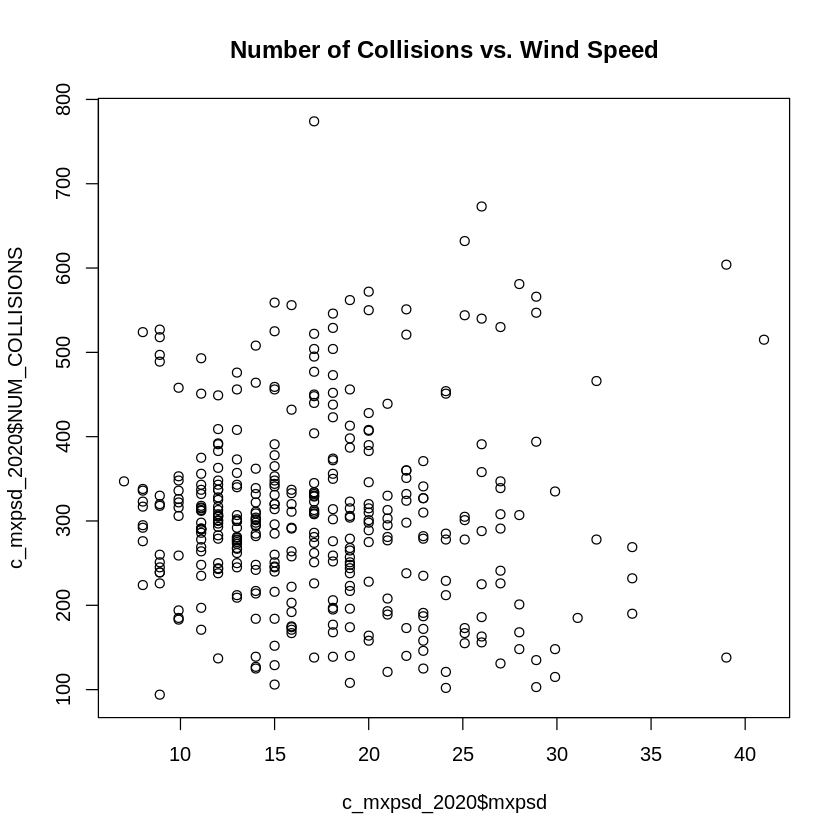

[1] -0.2429332

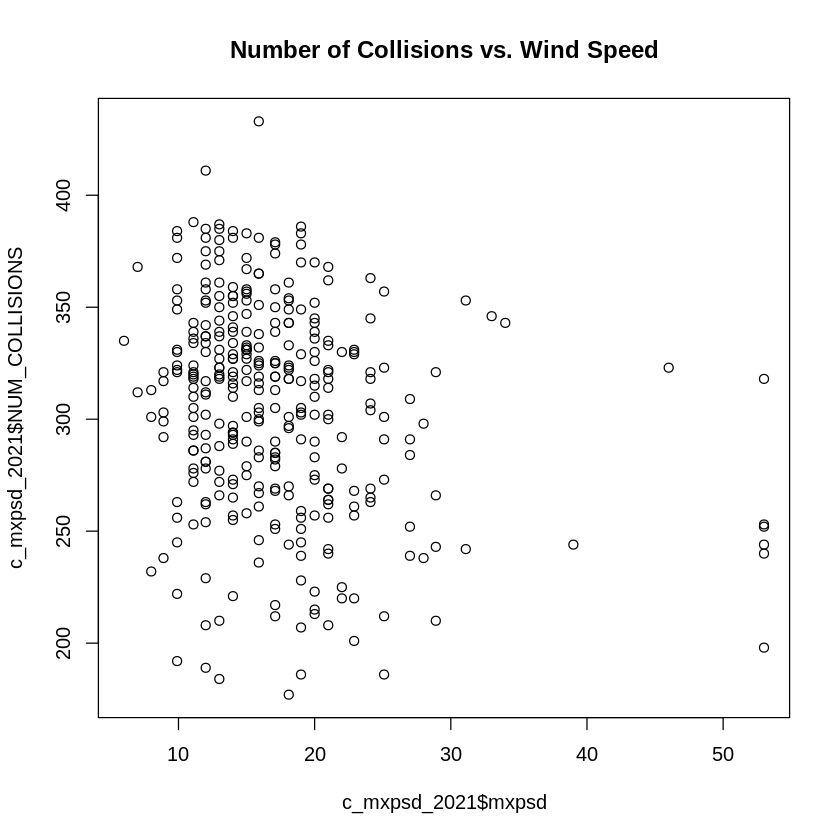

In [74]:
c_mxpsd_2013 <- subset(cols2013, mxpsd != 999.9)
c_mxpsd_2014 <- subset(cols2014, mxpsd != 999.9)
c_mxpsd_2015 <- subset(cols2013, mxpsd != 999.9)
c_mxpsd_2016 <- subset(cols2016, mxpsd != 999.9)
c_mxpsd_2017 <- subset(cols2017, mxpsd != 999.9)
c_mxpsd_2018 <- subset(cols2018, mxpsd != 999.9)
c_mxpsd_2019 <- subset(cols2019, mxpsd != 999.9)
c_mxpsd_2020 <- subset(cols2020, mxpsd != 999.9)
c_mxpsd_2021 <- subset(cols2021, mxpsd != 999.9)

ms <- ggplot() +
  geom_point(data=c_mxpsd_2013, aes(mxpsd, NUM_COLLISIONS, color="2013")) +
  geom_point(data=c_mxpsd_2014, aes(mxpsd, NUM_COLLISIONS, color="2014")) +
  geom_point(data=c_mxpsd_2015, aes(mxpsd, NUM_COLLISIONS, color="2015")) +
  geom_point(data=c_mxpsd_2016, aes(mxpsd, NUM_COLLISIONS, color="2016")) +
  geom_point(data=c_mxpsd_2017, aes(mxpsd, NUM_COLLISIONS, color="2017")) +
  geom_point(data=c_mxpsd_2018, aes(mxpsd, NUM_COLLISIONS, color="2018")) +
  geom_point(data=c_mxpsd_2019, aes(mxpsd, NUM_COLLISIONS, color="2019")) +
  geom_point(data=c_mxpsd_2020, aes(mxpsd, NUM_COLLISIONS, color="2020")) +
  geom_point(data=c_mxpsd_2021, aes(mxpsd, NUM_COLLISIONS, color="2021"))

ms+xlim(0,35)

plot(c_mxpsd_2013$mxpsd, c_mxpsd_2013$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(c_mxpsd_2013$mxpsd,c_mxpsd_2013$NUM_COLLISIONS)
plot(c_mxpsd_2014$mxpsd, c_mxpsd_2014$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(c_mxpsd_2014$mxpsd,c_mxpsd_2014$NUM_COLLISIONS)
plot(c_mxpsd_2015$mxpsd, c_mxpsd_2015$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(c_mxpsd_2015$mxpsd,c_mxpsd_2015$NUM_COLLISIONS)
plot(c_mxpsd_2016$mxpsd, c_mxpsd_2016$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(c_mxpsd_2016$mxpsd,c_mxpsd_2016$NUM_COLLISIONS)
plot(c_mxpsd_2017$mxpsd, c_mxpsd_2017$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(c_mxpsd_2017$mxpsd,c_mxpsd_2017$NUM_COLLISIONS)
plot(c_mxpsd_2018$mxpsd, c_mxpsd_2018$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(c_mxpsd_2018$mxpsd,c_mxpsd_2018$NUM_COLLISIONS)
plot(c_mxpsd_2019$mxpsd, c_mxpsd_2019$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(c_mxpsd_2019$mxpsd,c_mxpsd_2019$NUM_COLLISIONS)
plot(c_mxpsd_2020$mxpsd, c_mxpsd_2020$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(c_mxpsd_2020$mxpsd,c_mxpsd_2020$NUM_COLLISIONS)
plot(c_mxpsd_2021$mxpsd, c_mxpsd_2021$NUM_COLLISIONS, main="Number of Collisions vs. Wind Speed")
cor(c_mxpsd_2021$mxpsd,c_mxpsd_2021$NUM_COLLISIONS)

###Gust
As above the gust column contains values which infer that no data is available. In order to analyse the data these values must be removed.

A similar pattern is observed to that of the maximum wind speed. As with maximum windspeed there is no linear relationship between gust and the number of collisions recrorded.


Warning message:
“Removed 7 rows containing missing values (geom_point).”
Warning message:
“Removed 12 rows containing missing values (geom_point).”
Warning message:
“Removed 7 rows containing missing values (geom_point).”
Warning message:
“Removed 10 rows containing missing values (geom_point).”
Warning message:
“Removed 10 rows containing missing values (geom_point).”
Warning message:
“Removed 6 rows containing missing values (geom_point).”
Warning message:
“Removed 4 rows containing missing values (geom_point).”
Warning message:
“Removed 10 rows containing missing values (geom_point).”
Warning message:
“Removed 3 rows containing missing values (geom_point).”


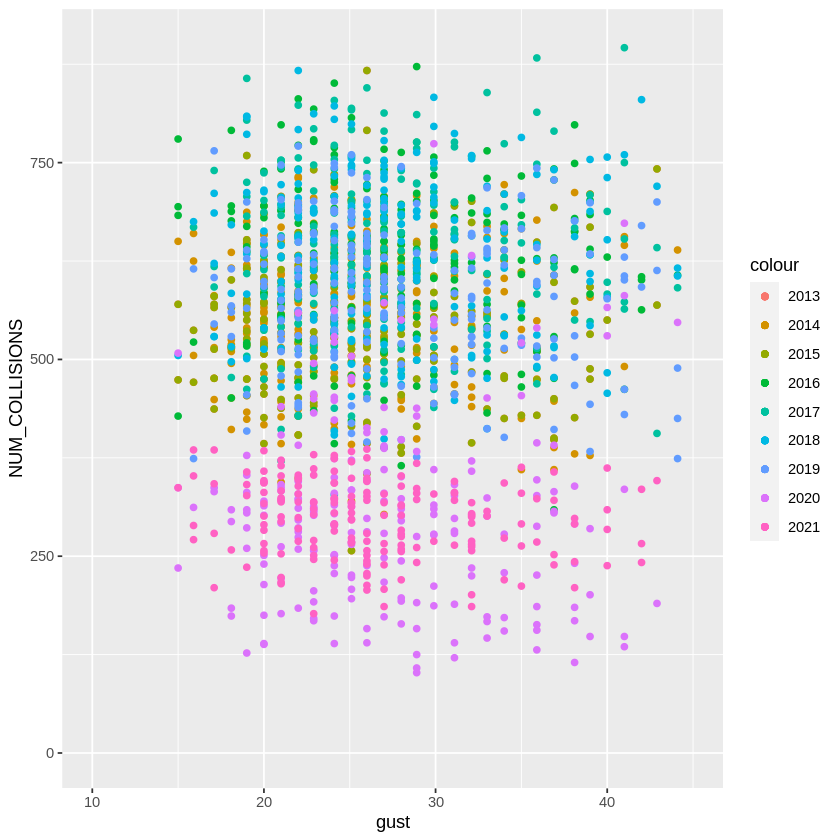

[1] 0.002252292

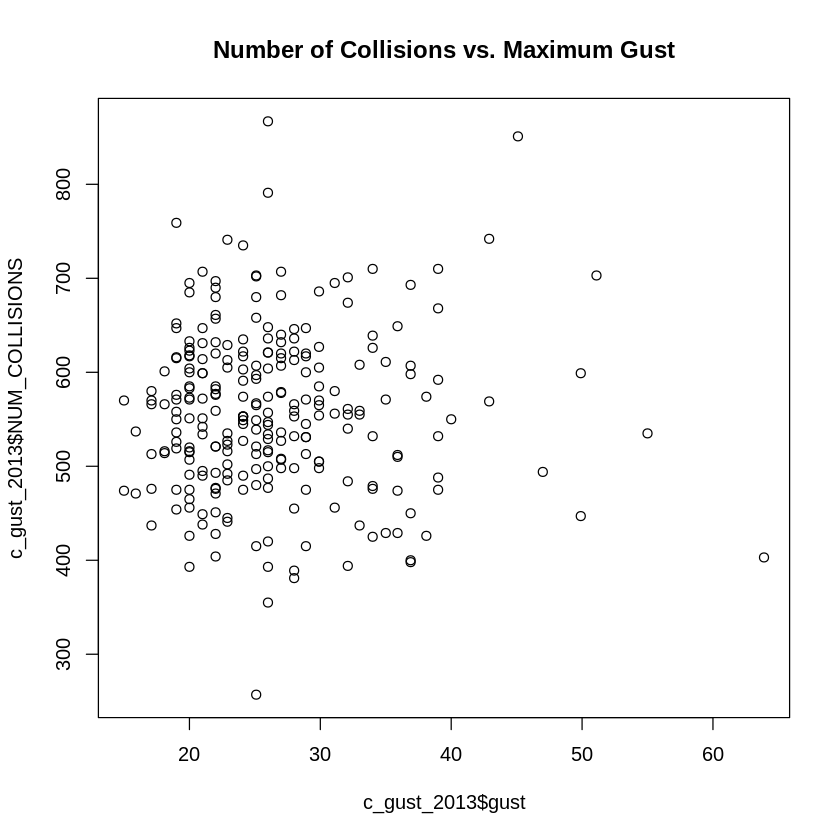

[1] -0.0364095

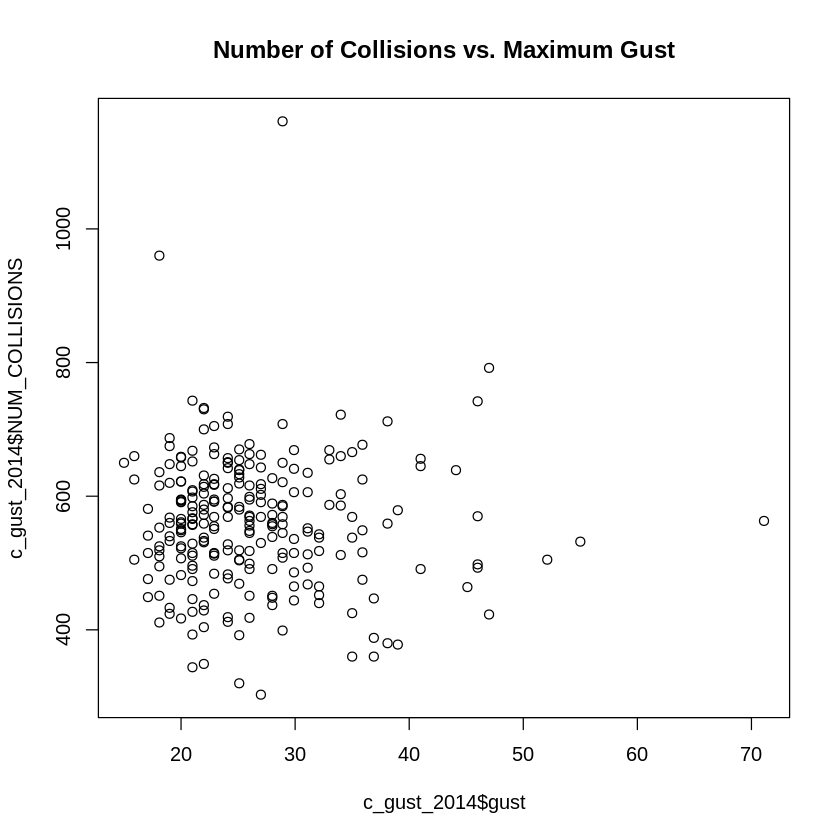

[1] 0.002252292

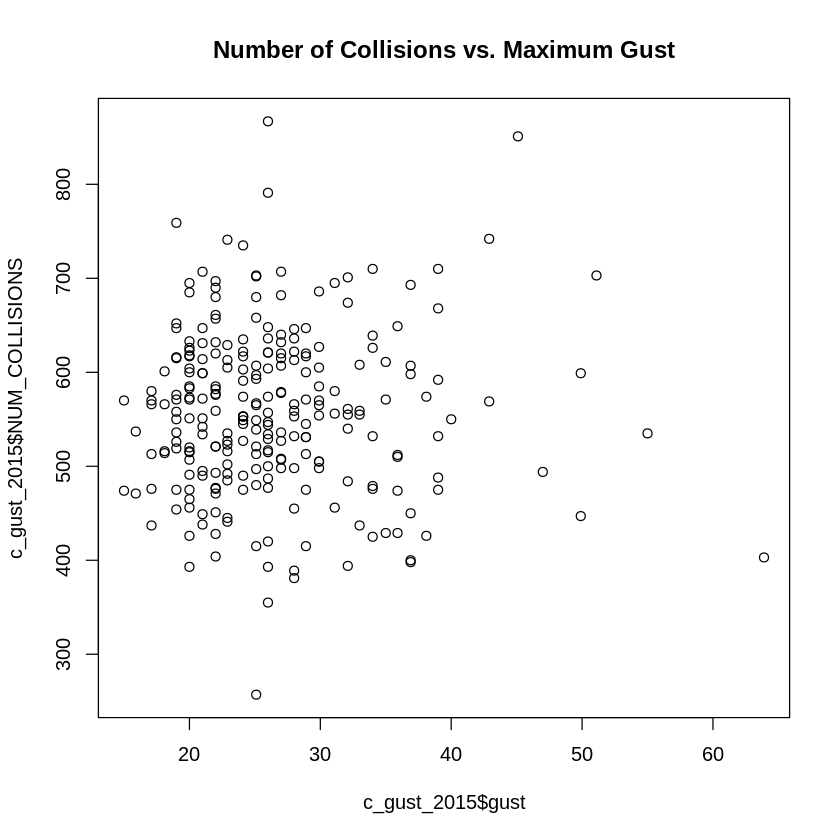

[1] -0.1679517

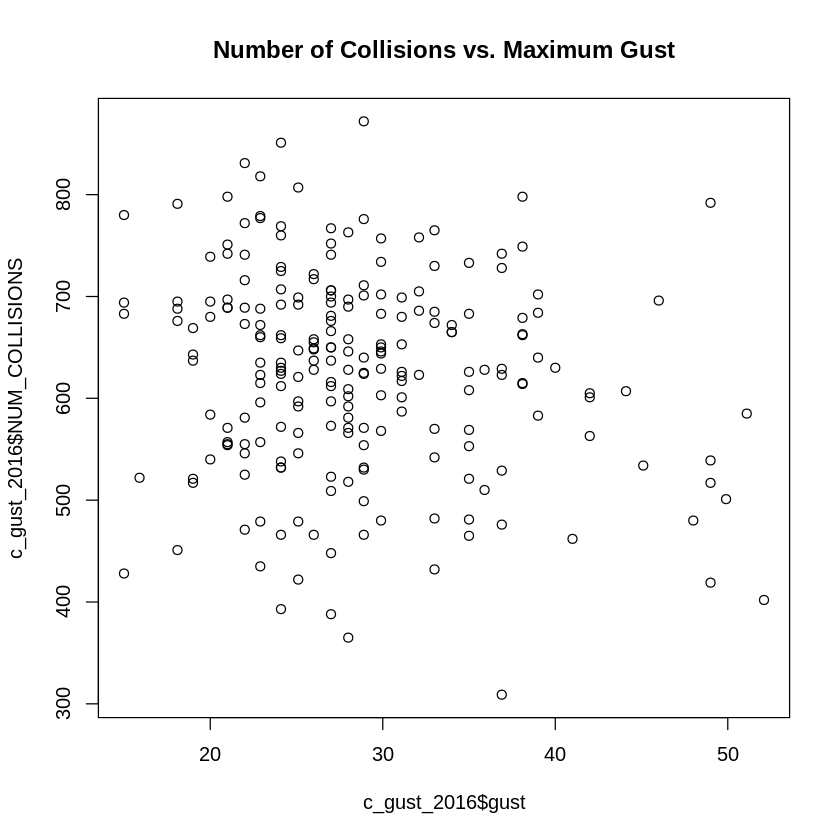

[1] -0.07504922

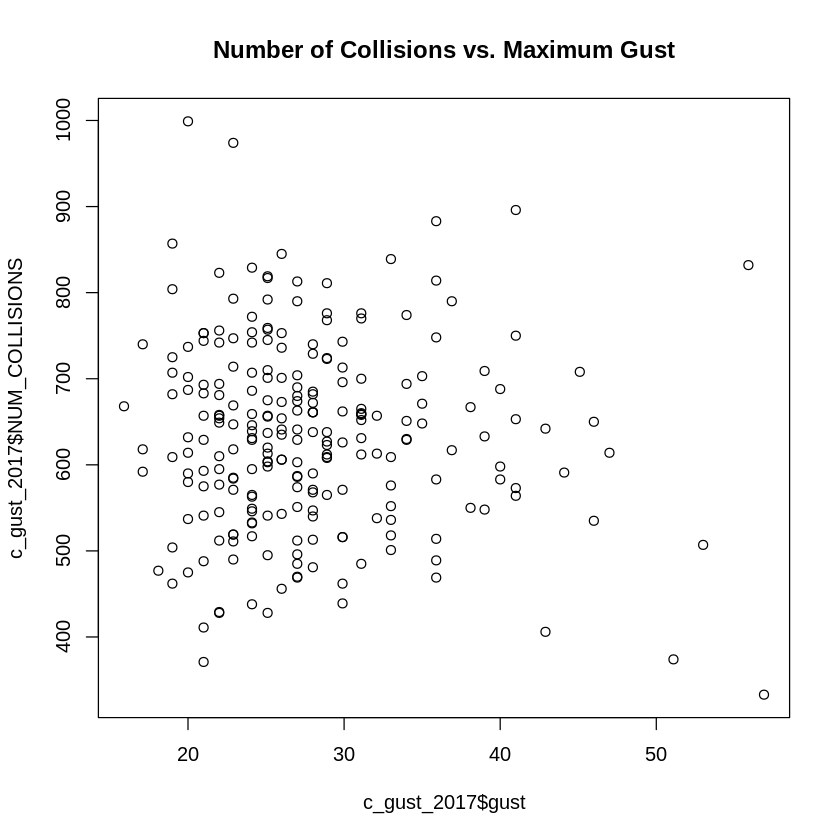

[1] 0.02098237

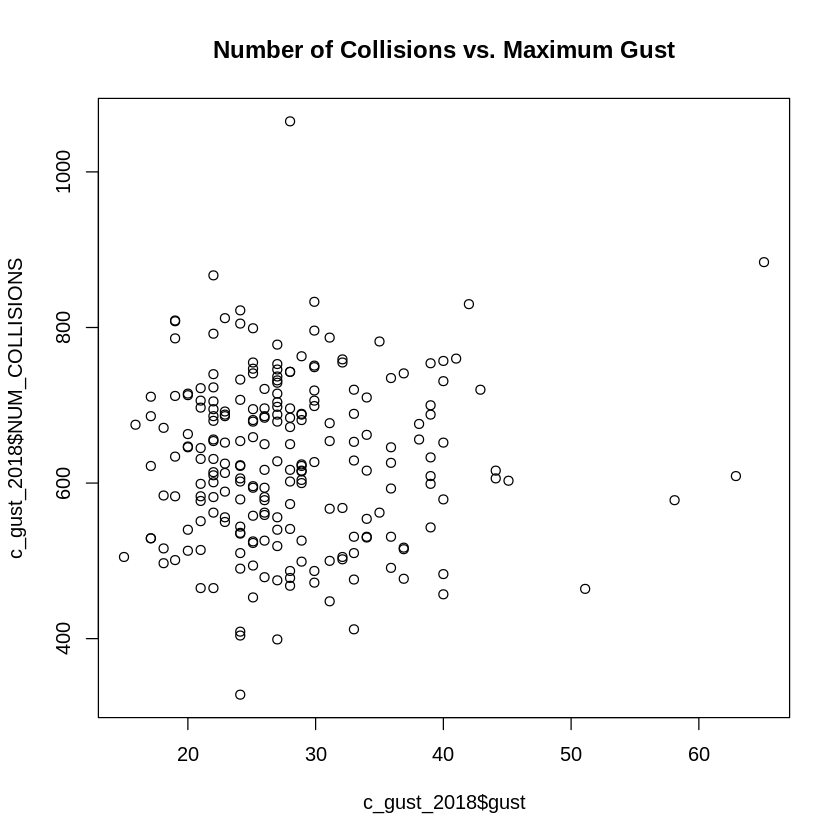

[1] -0.06973049

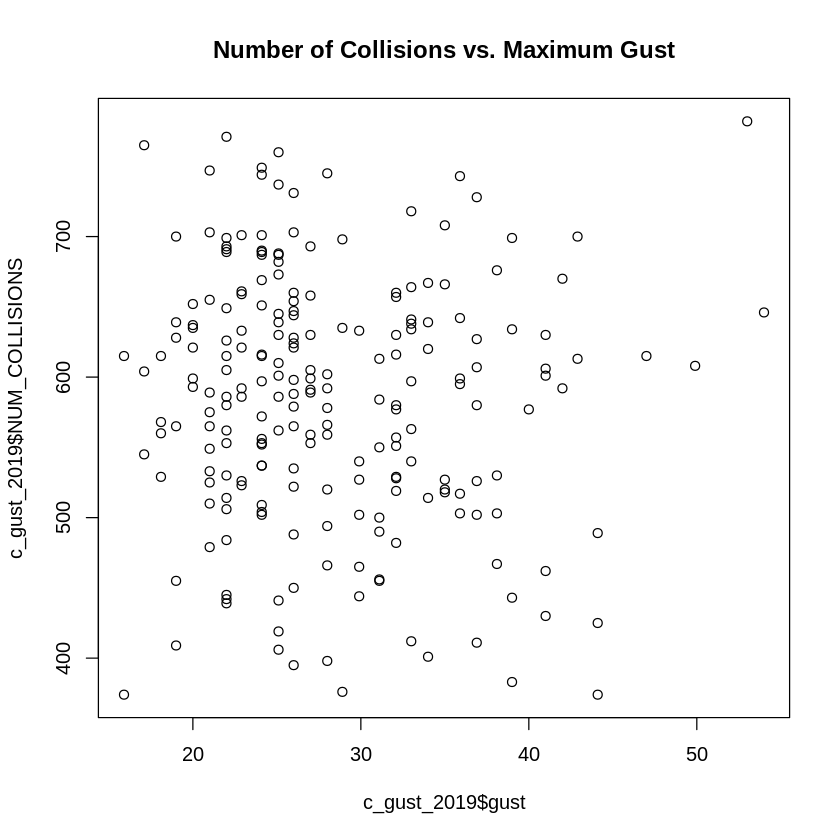

[1] 0.02110781

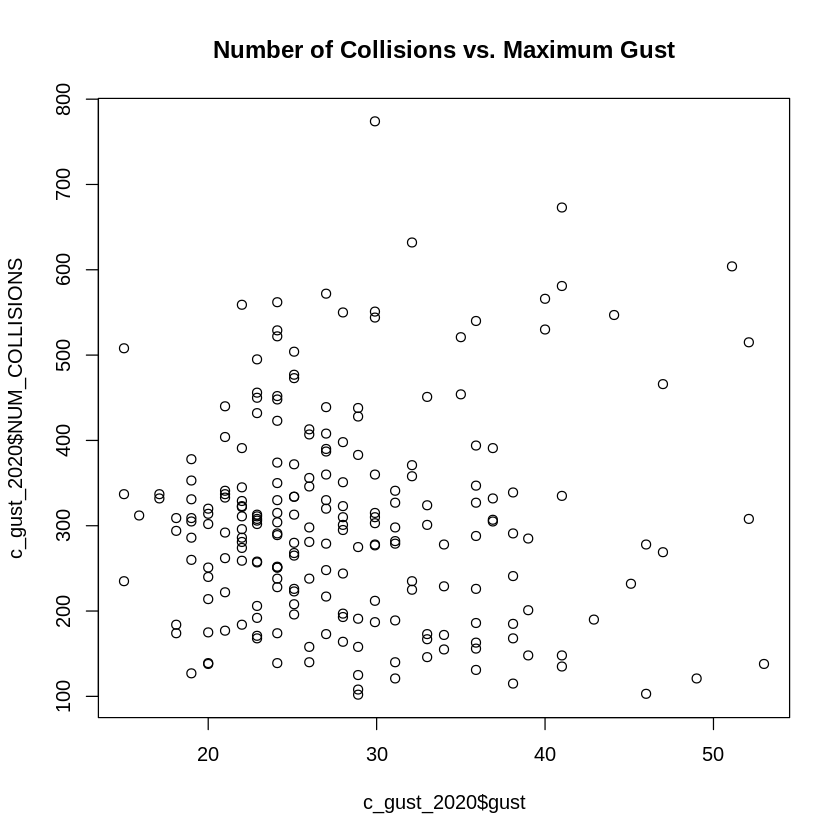

[1] -0.1088024

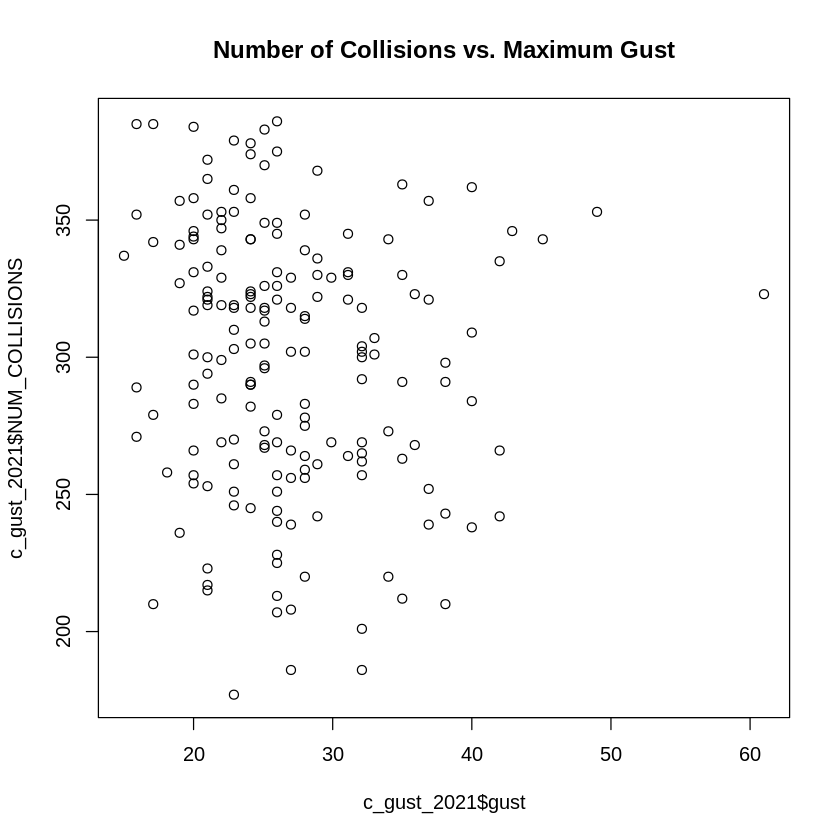

In [75]:
c_gust_2013 <- subset(cols2013, gust != 999.9)
c_gust_2014 <- subset(cols2014, gust != 999.9)
c_gust_2015 <- subset(cols2013, gust != 999.9)
c_gust_2016 <- subset(cols2016, gust != 999.9)
c_gust_2017 <- subset(cols2017, gust != 999.9)
c_gust_2018 <- subset(cols2018, gust != 999.9)
c_gust_2019 <- subset(cols2019, gust != 999.9)
c_gust_2020 <- subset(cols2020, gust != 999.9)
c_gust_2021 <- subset(cols2021, gust != 999.9)

mg <- ggplot() +
  geom_point(data=c_gust_2013, aes(gust, NUM_COLLISIONS, color="2013")) +
  geom_point(data=c_gust_2014, aes(gust, NUM_COLLISIONS, color="2014")) +
  geom_point(data=c_gust_2015, aes(gust, NUM_COLLISIONS, color="2015")) +
  geom_point(data=c_gust_2016, aes(gust, NUM_COLLISIONS, color="2016")) +
  geom_point(data=c_gust_2017, aes(gust, NUM_COLLISIONS, color="2017")) +
  geom_point(data=c_gust_2018, aes(gust, NUM_COLLISIONS, color="2018")) +
  geom_point(data=c_gust_2019, aes(gust, NUM_COLLISIONS, color="2019")) +
  geom_point(data=c_gust_2020, aes(gust, NUM_COLLISIONS, color="2020")) +
  geom_point(data=c_gust_2021, aes(gust, NUM_COLLISIONS, color="2021"))

mg+xlim(10,45)+ylim(0,900)


plot(c_gust_2013$gust, c_gust_2013$NUM_COLLISIONS, main="Number of Collisions vs. Maximum Gust")
cor(c_gust_2013$gust,c_gust_2013$NUM_COLLISIONS)
plot(c_gust_2014$gust, c_gust_2014$NUM_COLLISIONS, main="Number of Collisions vs. Maximum Gust")
cor(c_gust_2014$gust,c_gust_2014$NUM_COLLISIONS)
plot(c_gust_2015$gust, c_gust_2015$NUM_COLLISIONS, main="Number of Collisions vs. Maximum Gust")
cor(c_gust_2015$gust,c_gust_2015$NUM_COLLISIONS)
plot(c_gust_2016$gust, c_gust_2016$NUM_COLLISIONS, main="Number of Collisions vs. Maximum Gust")
cor(c_gust_2016$gust,c_gust_2016$NUM_COLLISIONS)
plot(c_gust_2017$gust, c_gust_2017$NUM_COLLISIONS, main="Number of Collisions vs. Maximum Gust")
cor(c_gust_2017$gust,c_gust_2017$NUM_COLLISIONS)
plot(c_gust_2018$gust, c_gust_2018$NUM_COLLISIONS, main="Number of Collisions vs. Maximum Gust")
cor(c_gust_2018$gust,c_gust_2018$NUM_COLLISIONS)
plot(c_gust_2019$gust, c_gust_2019$NUM_COLLISIONS, main="Number of Collisions vs. Maximum Gust")
cor(c_gust_2019$gust,c_gust_2019$NUM_COLLISIONS)
plot(c_gust_2020$gust, c_gust_2020$NUM_COLLISIONS, main="Number of Collisions vs. Maximum Gust")
cor(c_gust_2020$gust,c_gust_2020$NUM_COLLISIONS)
plot(c_gust_2021$gust, c_gust_2021$NUM_COLLISIONS, main="Number of Collisions vs. Maximum Gust")
cor(c_gust_2021$gust,c_gust_2021$NUM_COLLISIONS)

###Precipitation

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   0.000   1.177   0.060  99.990 

Warning message:
“Removed 7 rows containing missing values (geom_point).”
Warning message:
“Removed 8 rows containing missing values (geom_point).”
Warning message:
“Removed 7 rows containing missing values (geom_point).”
Warning message:
“Removed 4 rows containing missing values (geom_point).”
Warning message:
“Removed 6 rows containing missing values (geom_point).”
Warning message:
“Removed 4 rows containing missing values (geom_point).”
Warning message:
“Removed 4 rows containing missing values (geom_point).”
Warning message:
“Removed 1 rows containing missing values (geom_point).”


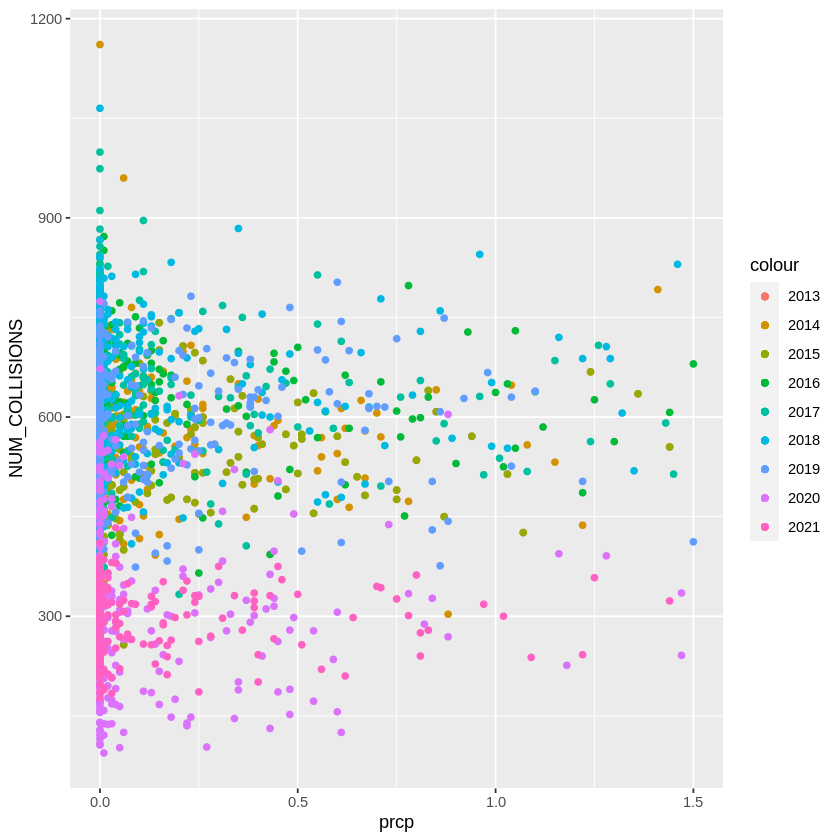

[1] 0.01656872

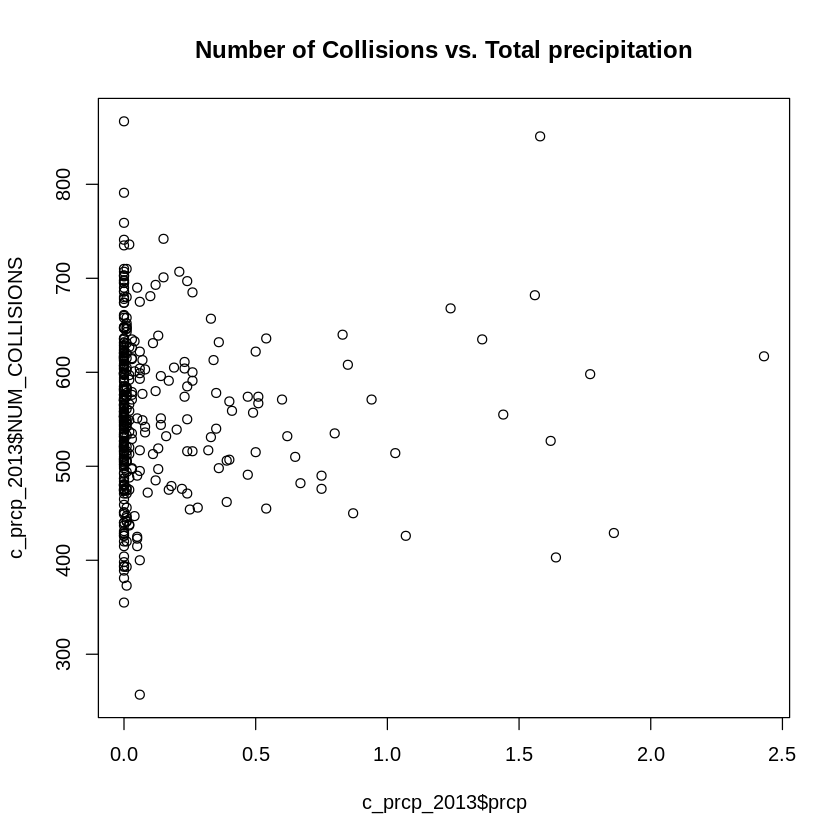

[1] 0.02342015

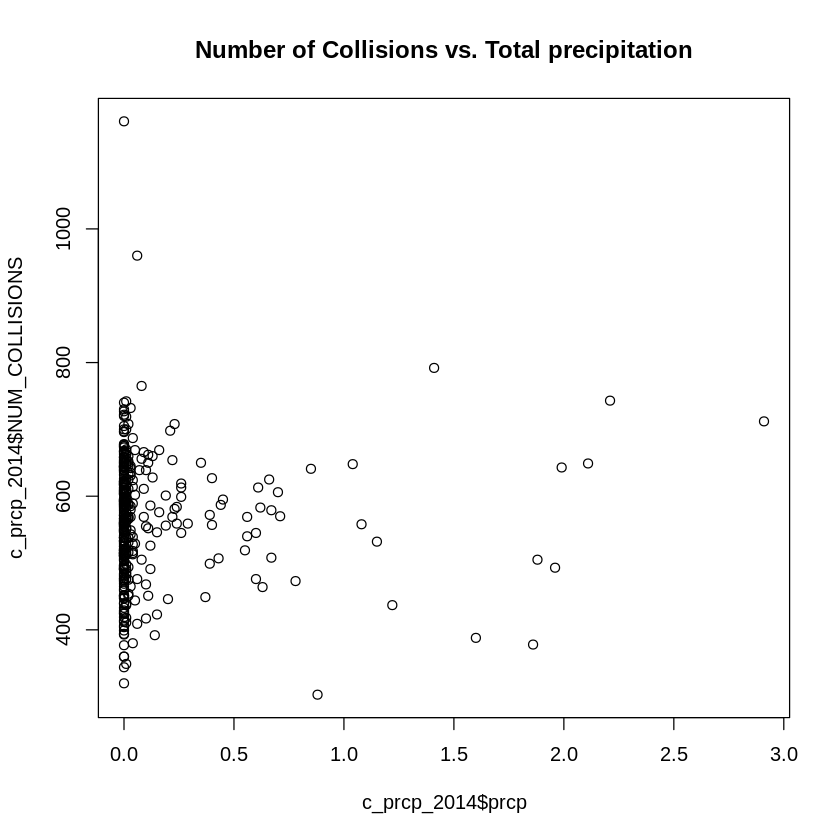

[1] 0.01656872

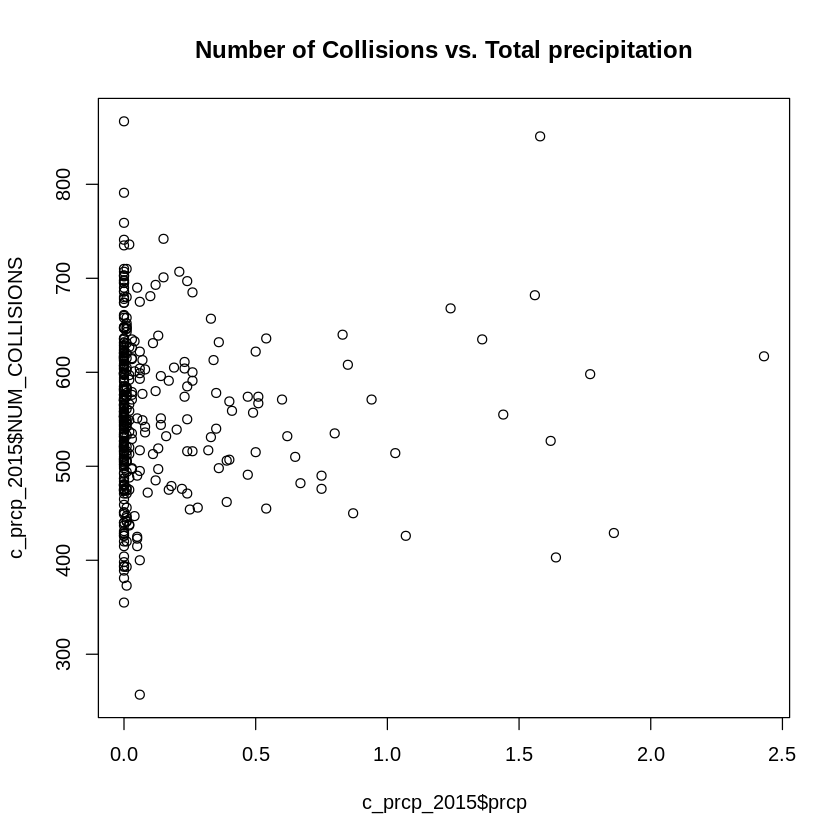

[1] -0.06659525

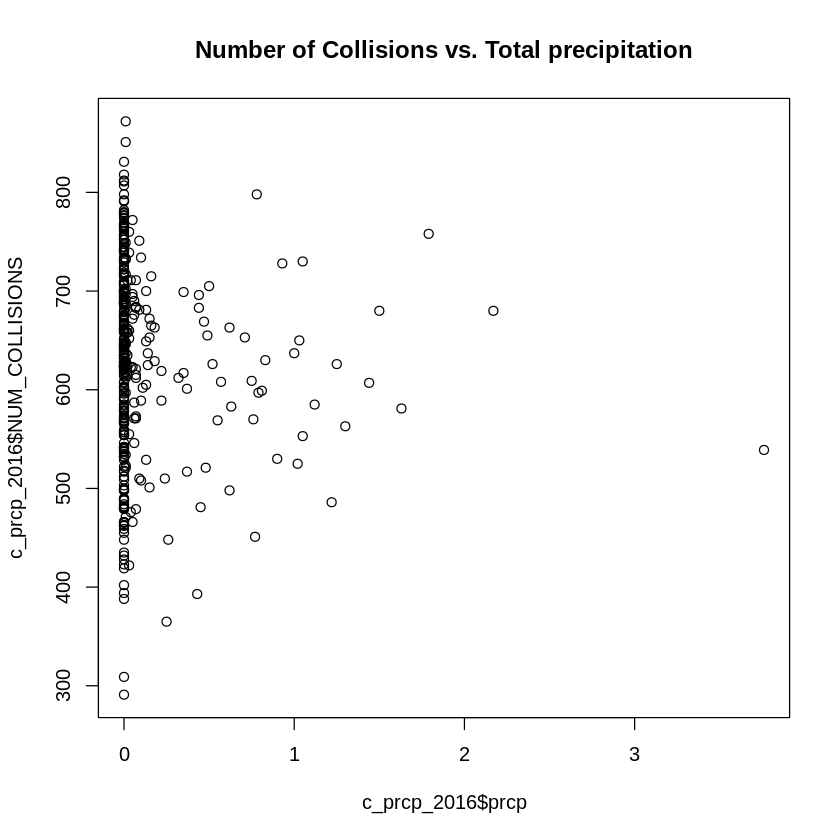

[1] -0.01140763

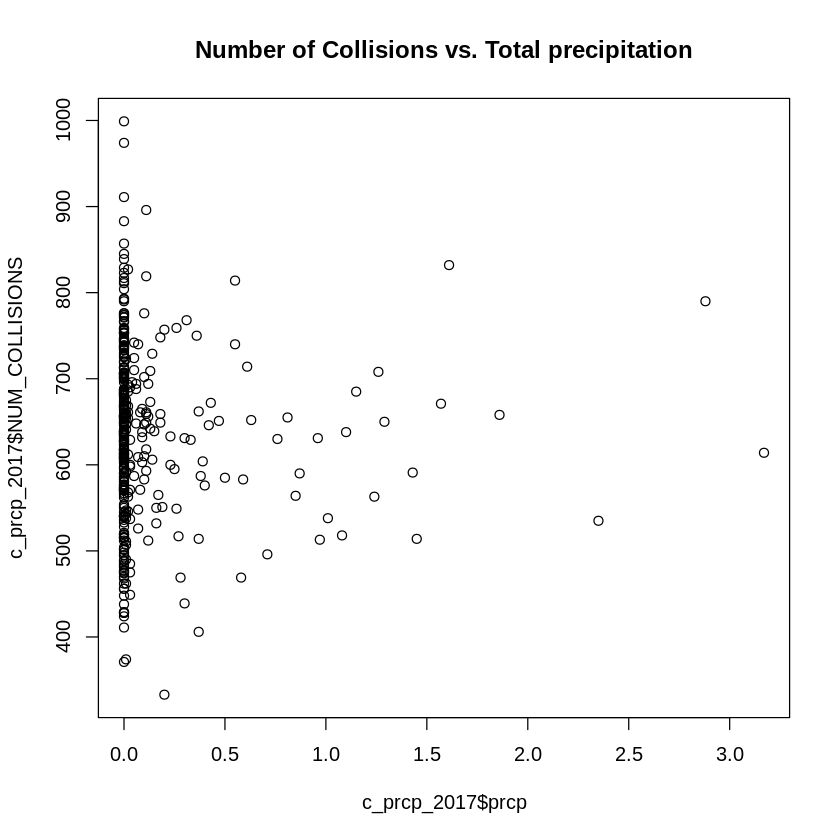

[1] 0.004645025

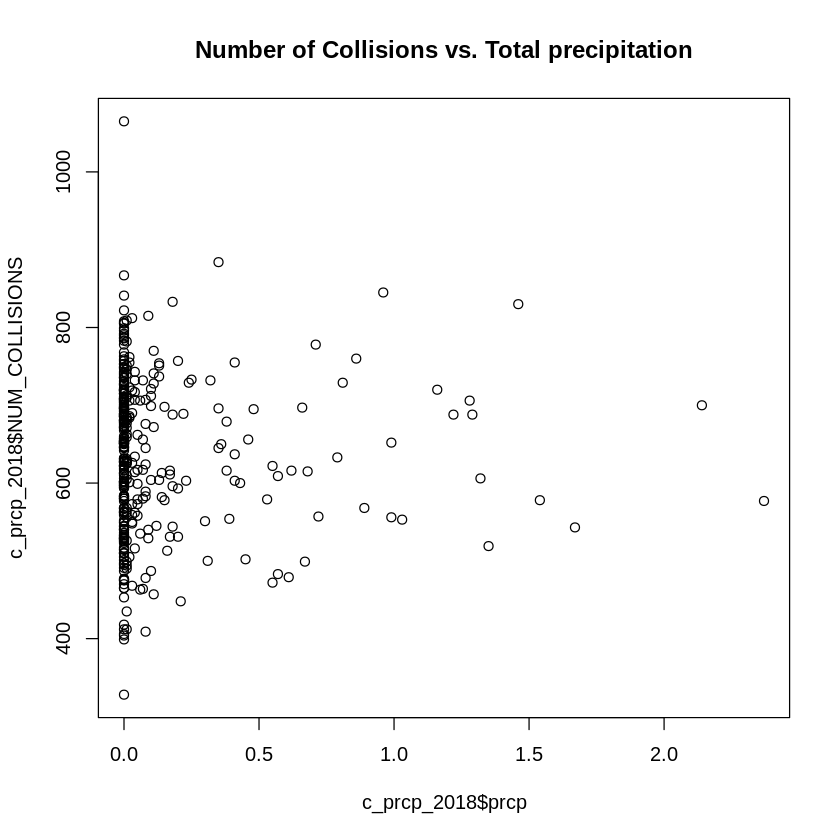

[1] 0.05496833

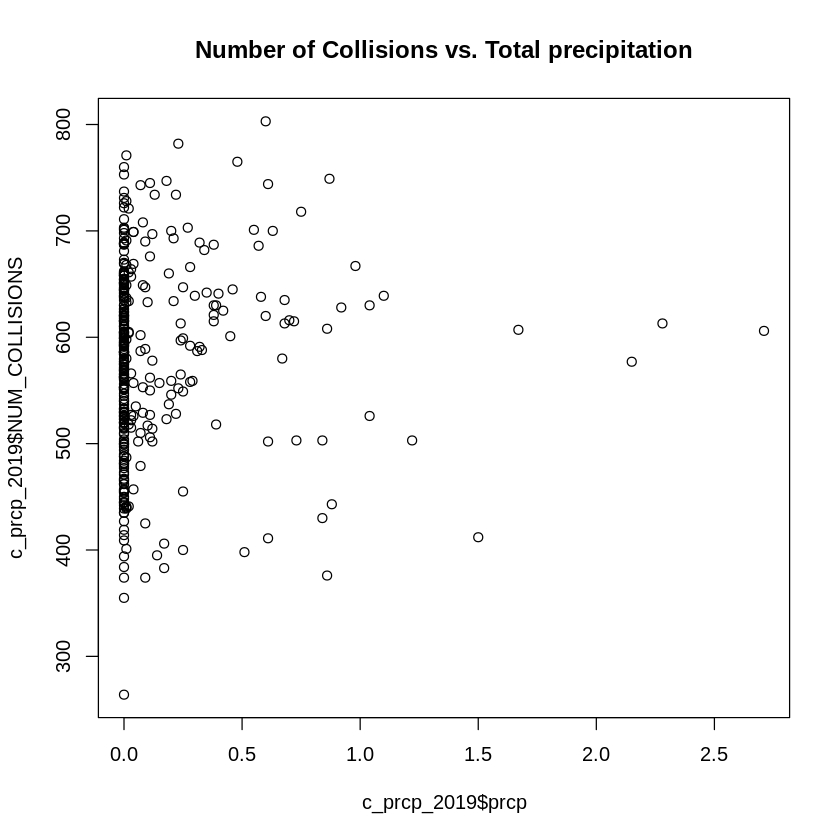

[1] -0.0277219

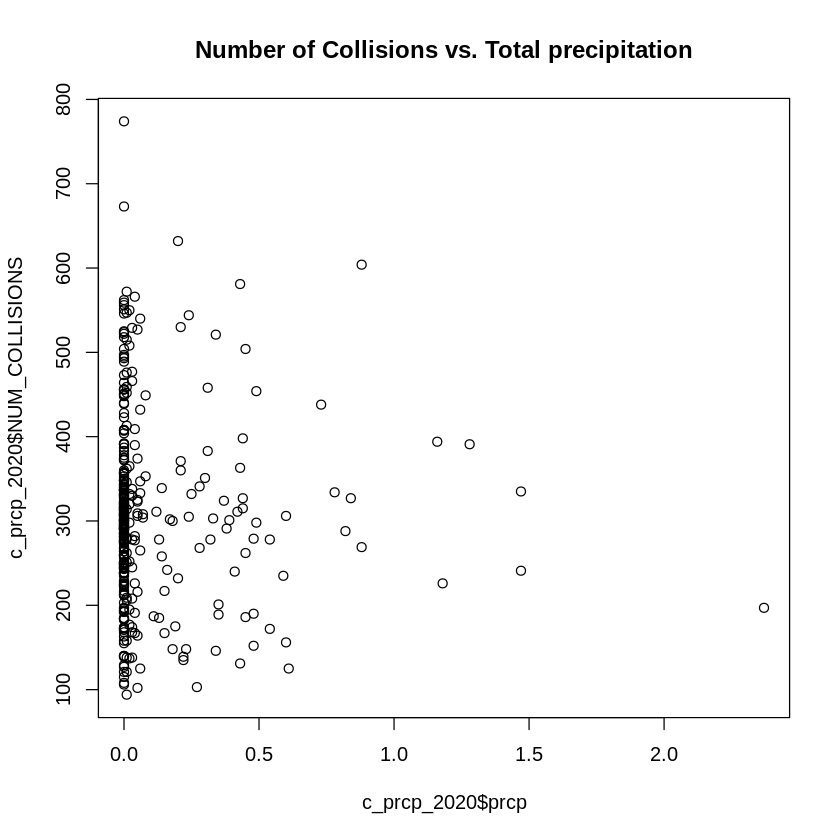

[1] -0.03862726

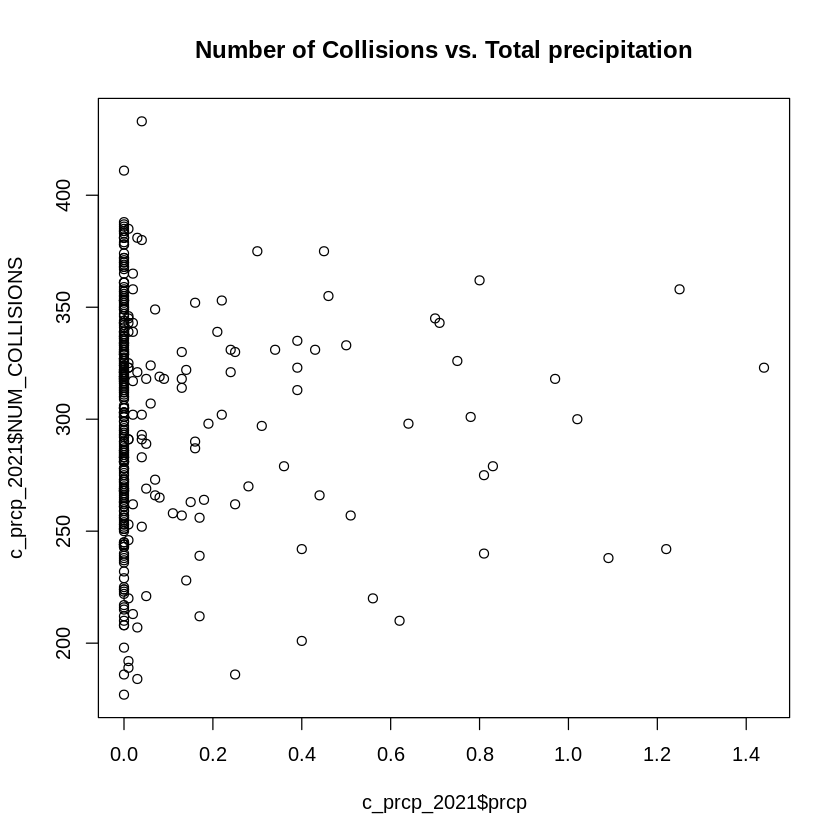

In [76]:
summary(coldata$prcp)
c_prcp_2013 <- subset(cols2013, prcp != 99.99)
c_prcp_2014 <- subset(cols2014, prcp != 99.99)
c_prcp_2015 <- subset(cols2013, prcp != 99.99)
c_prcp_2016 <- subset(cols2016, prcp != 99.99)
c_prcp_2017 <- subset(cols2017, prcp != 99.99)
c_prcp_2018 <- subset(cols2018, prcp != 99.99)
c_prcp_2019 <- subset(cols2019, prcp != 99.99)
c_prcp_2020 <- subset(cols2020, prcp != 99.99)
c_prcp_2021 <- subset(cols2021, prcp != 99.99)

pr <- ggplot() +
  geom_point(data=c_prcp_2013, aes(prcp, NUM_COLLISIONS, color="2013")) +
  geom_point(data=c_prcp_2014, aes(prcp, NUM_COLLISIONS, color="2014")) +
  geom_point(data=c_prcp_2015, aes(prcp, NUM_COLLISIONS, color="2015")) +
  geom_point(data=c_prcp_2016, aes(prcp, NUM_COLLISIONS, color="2016")) +
  geom_point(data=c_prcp_2017, aes(prcp, NUM_COLLISIONS, color="2017")) +
  geom_point(data=c_prcp_2018, aes(prcp, NUM_COLLISIONS, color="2018")) +
  geom_point(data=c_prcp_2019, aes(prcp, NUM_COLLISIONS, color="2019")) +
  geom_point(data=c_prcp_2020, aes(prcp, NUM_COLLISIONS, color="2020")) +
  geom_point(data=c_prcp_2021, aes(prcp, NUM_COLLISIONS, color="2021"))

pr+xlim(0,1.5)

plot(c_prcp_2013$prcp, c_prcp_2013$NUM_COLLISIONS, main="Number of Collisions vs. Total precipitation")
cor(c_prcp_2013$prcp,c_prcp_2013$NUM_COLLISIONS)
plot(c_prcp_2014$prcp, c_prcp_2014$NUM_COLLISIONS, main="Number of Collisions vs. Total precipitation")
cor(c_prcp_2014$prcp,c_prcp_2014$NUM_COLLISIONS)
plot(c_prcp_2015$prcp, c_prcp_2015$NUM_COLLISIONS, main="Number of Collisions vs. Total precipitation")
cor(c_prcp_2015$prcp,c_prcp_2015$NUM_COLLISIONS)
plot(c_prcp_2016$prcp, c_prcp_2016$NUM_COLLISIONS, main="Number of Collisions vs. Total precipitation")
cor(c_prcp_2016$prcp,c_prcp_2016$NUM_COLLISIONS)
plot(c_prcp_2017$prcp, c_prcp_2017$NUM_COLLISIONS, main="Number of Collisions vs. Total precipitation")
cor(c_prcp_2017$prcp,c_prcp_2017$NUM_COLLISIONS)
plot(c_prcp_2018$prcp, c_prcp_2018$NUM_COLLISIONS, main="Number of Collisions vs. Total precipitation")
cor(c_prcp_2018$prcp,c_prcp_2018$NUM_COLLISIONS)
plot(c_prcp_2019$prcp, c_prcp_2019$NUM_COLLISIONS, main="Number of Collisions vs. Total precipitation")
cor(c_prcp_2019$prcp,c_prcp_2019$NUM_COLLISIONS)
plot(c_prcp_2020$prcp, c_prcp_2020$NUM_COLLISIONS, main="Number of Collisions vs. Total precipitation")
cor(c_prcp_2020$prcp,c_prcp_2020$NUM_COLLISIONS)
plot(c_prcp_2021$prcp, c_prcp_2021$NUM_COLLISIONS, main="Number of Collisions vs. Total precipitation")
cor(c_prcp_2021$prcp,c_prcp_2021$NUM_COLLISIONS)

As there is a signifcant number of collisions take place when zero precipitation is recorded it is unlikely there is a linear relationship between the volume of precipitation and the number of collisions.

To further explore a possible link between precipitation and the category of percipition will be inclued.

This data shows that for all types of preciptation the majority of volumes odserved tred towards zero. It is also clear that there is no linear relationship between precipitation and the number of collisions. There is a strong relationship between the number of collisions and the volume of preciptiation where the types is snow or ice pellets. Due to the lack of data points it is uclear whether this relationship is relable or coinclidental.

,day,year,mo,da,collision_date,NUM_COLLISIONS,temp,dewp,slp,visib,⋯,max,min,prcp,sndp,fog,rain_drizzle,snow_ice_pellets,hail,thunder,tornado_funnel_cloud
,<int>,<int>,<int>,<int>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>
1,5,2020,1,24,2020-01-24,524,37.3,33.7,1028.5,6.5,⋯,46.0,19.9,0.00,999.9,1,0,0,0,0,0
2,2,2021,1,12,2021-01-12,278,37.0,29.1,1019.0,10.0,⋯,44.1,21.0,0.00,999.9,0,0,0,0,0,0
3,5,2021,1,22,2021-01-22,254,36.5,28.4,1003.1,10.0,⋯,44.1,19.9,0.00,999.9,0,0,0,0,0,0
4,3,2021,1,27,2021-01-27,262,34.6,33.8,1012.8,8.0,⋯,41.0,28.9,0.25,999.9,1,1,0,0,0,11000
5,2,2021,1,26,2021-01-26,263,31.9,23.4,1016.9,9.0,⋯,37.9,21.0,0.00,999.9,1,0,0,0,1000,1000
6,1,2022,1,24,2022-01-24,237,34.5,23.8,1010.6,9.7,⋯,39.9,25.0,0.00,999.9,1,0,0,0,1000,1000


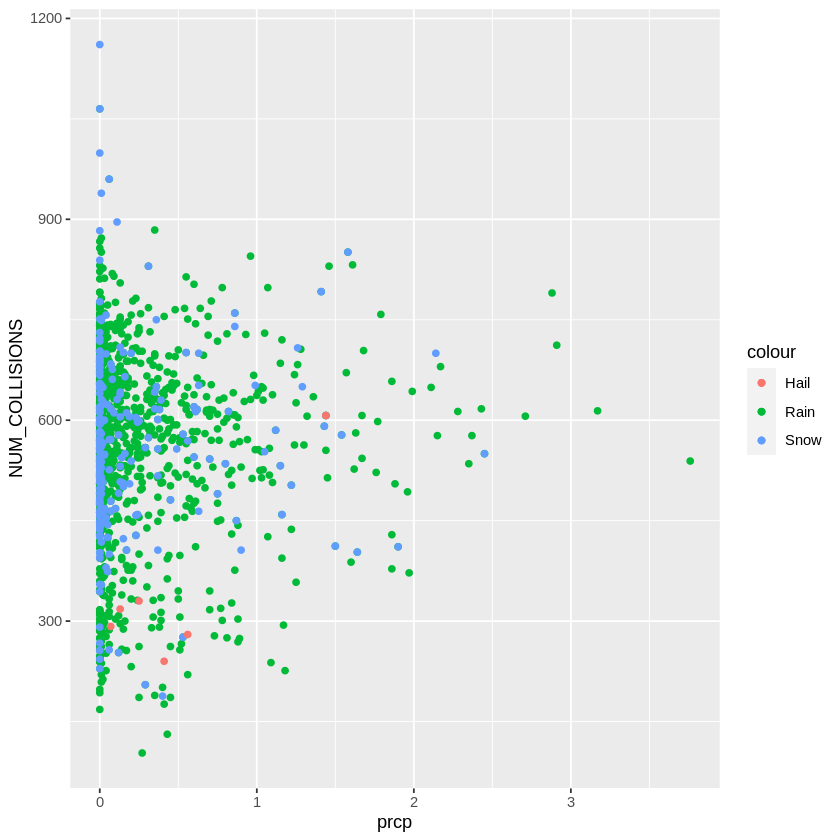

[1] -0.004952391

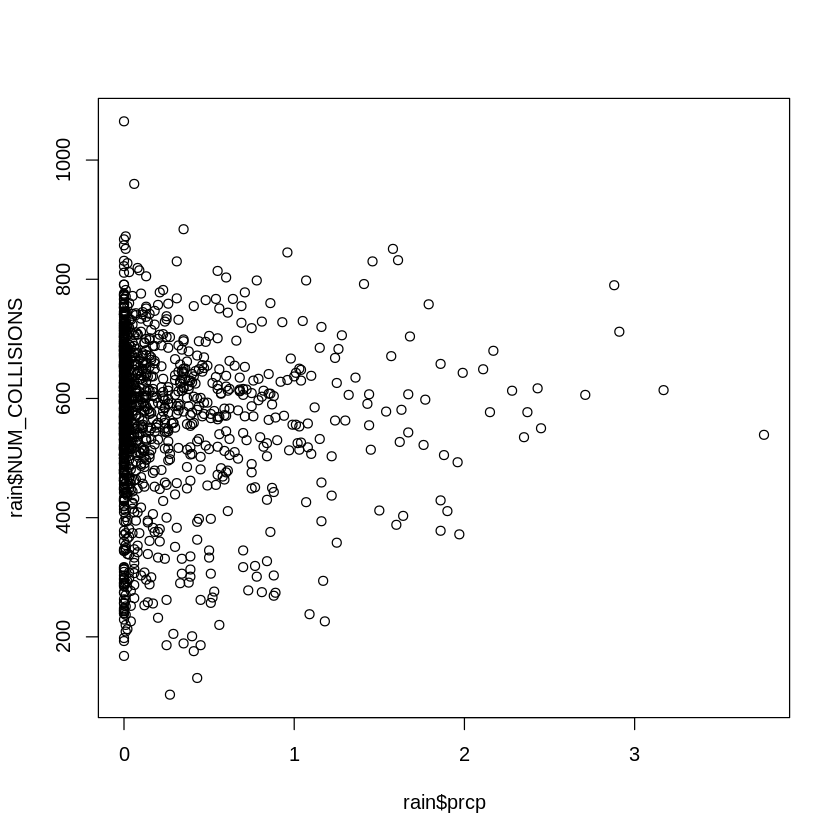

[1] 0.03720336

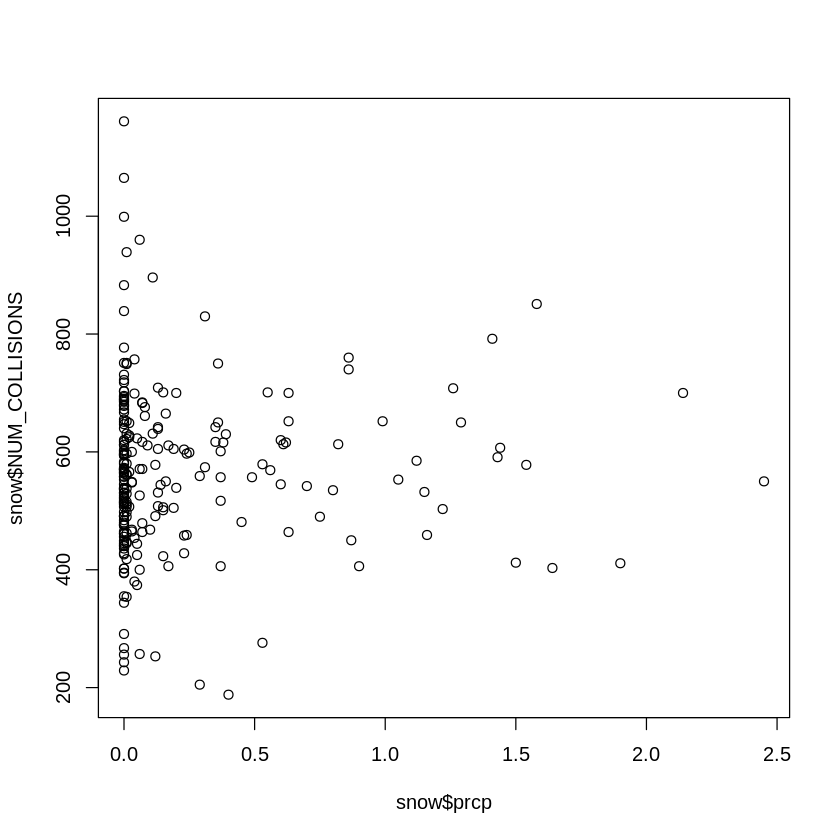

[1] 0.8619021

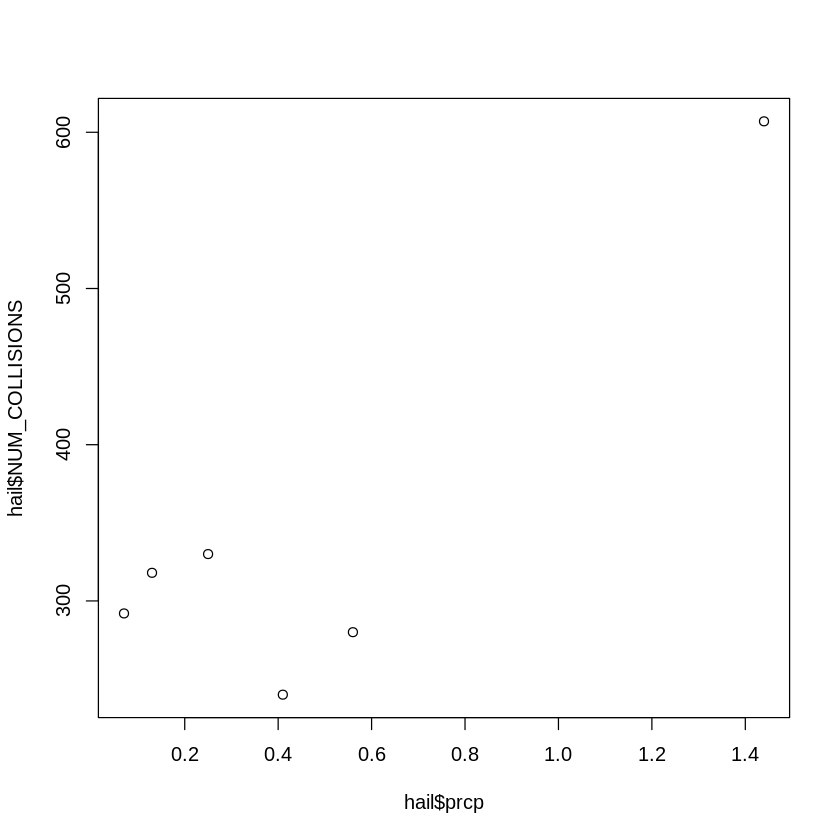

In [77]:
head(coldata)
prcpData <- coldata[ c("year","NUM_COLLISIONS","prcp","rain_drizzle","snow_ice_pellets","hail") ]
prcpData <- subset(prcpData, prcp != 99.99)

hail <- subset(prcpData, hail == 1)
snow <- subset(prcpData, snow_ice_pellets == 1)
rain <- subset(prcpData, rain_drizzle == 1)

ggplot() +
  geom_point(data=rain, aes(prcp, NUM_COLLISIONS, color="Rain")) +
  geom_point(data=snow, aes(prcp, NUM_COLLISIONS, color="Snow")) +
  geom_point(data=hail, aes(prcp, NUM_COLLISIONS, color="Hail"))

plot(rain$prcp,rain$NUM_COLLISIONS)
cor(rain$prcp,rain$NUM_COLLISIONS)

plot(snow$prcp,snow$NUM_COLLISIONS)
cor(snow$prcp,snow$NUM_COLLISIONS)

plot(hail$prcp,hail$NUM_COLLISIONS)
cor(hail$prcp,hail$NUM_COLLISIONS)

##Location Data
In order to investigate the data in more detail, a new dataset has been created. This follows the same structure as the original dataset, with the addition of the borough, latitude and longitude collumn.

As the adding in bourough, latitude and longitude has added complexity to the grouping of the data. This has resulted in multiple rows existing for particular dates as collisions generally do not take place at the same locations multiple times each day. This has resulted in the 

In [78]:
library(readr)
download.file("https://github.com/matthew110395/12004210_DataAnalytics/blob/main/Collisions_with_location.zip?raw=true", destfile = "Collisions_with_location.zip")

loccoldata <- read.csv(unzip("Collisions_with_location.zip","Collisions_with_location.csv"), stringsAsFactors = TRUE)



In [79]:
head(loccoldata)
summary(loccoldata)

,day,year,mo,da,collision_date,NUM_COLLISIONS,borough,latitude,longitude,temp,⋯,max,min,prcp,sndp,fog,rain_drizzle,snow_ice_pellets,hail,thunder,tornado_funnel_cloud
,<int>,<int>,<int>,<int>,<fct>,<int>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>
1,2,2018,1,2,2018-01-02,1,,40.68175,-73.96748,14.7,⋯,18,5,0,999.9,0,0,0,0,0,0
2,2,2018,1,2,2018-01-02,1,BROOKLYN,40.64537,-73.94511,14.7,⋯,18,5,0,999.9,0,0,0,0,0,0
3,2,2018,1,2,2018-01-02,1,,40.61483,-73.99838,14.7,⋯,18,5,0,999.9,0,0,0,0,0,0
4,2,2018,1,2,2018-01-02,1,,40.59219,-74.08740,14.7,⋯,18,5,0,999.9,0,0,0,0,0,0
5,2,2018,1,2,2018-01-02,1,,40.76982,-73.78237,14.7,⋯,18,5,0,999.9,0,0,0,0,0,0
6,2,2018,1,2,2018-01-02,1,BROOKLYN,40.66018,-73.92820,14.7,⋯,18,5,0,999.9,0,0,0,0,0,0


      day             year            mo               da       
 Min.   :1.000   Min.   :2012   Min.   : 1.000   Min.   : 1.00  
 1st Qu.:2.000   1st Qu.:2014   1st Qu.: 4.000   1st Qu.: 8.00  
 Median :4.000   Median :2017   Median : 7.000   Median :16.00  
 Mean   :3.915   Mean   :2017   Mean   : 6.687   Mean   :15.65  
 3rd Qu.:6.000   3rd Qu.:2019   3rd Qu.:10.000   3rd Qu.:23.00  
 Max.   :7.000   Max.   :2022   Max.   :12.000   Max.   :31.00  
                                                                
    collision_date    NUM_COLLISIONS             borough          latitude    
 2018-11-15:    978   Min.   :  1.000                :395954   Min.   : 0.00  
 2017-12-15:    934   1st Qu.:  1.000   BRONX        :184939   1st Qu.:40.67  
 2014-01-21:    884   Median :  1.000   BROOKLYN     :400778   Median :40.72  
 2017-05-19:    882   Mean   :  1.152   MANHATTAN    :283614   Mean   :40.70  
 2017-05-18:    825   3rd Qu.:  1.000   QUEENS       :341341   3rd Qu.:40.77  
 2017-

[1] 40.68175 40.64537 40.61483 40.59219 40.76982 40.66018

[1] -73.96748 -73.94511 -73.99838 -74.08740 -73.78237 -73.92820

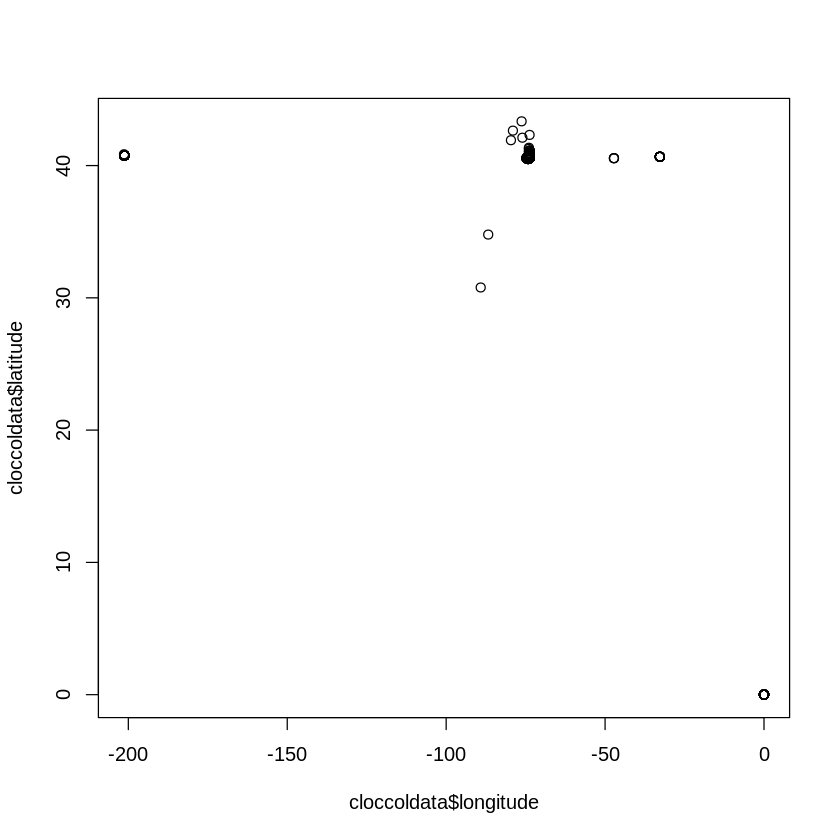

In [80]:
cloccoldata <-na.omit(loccoldata)
head(cloccoldata$latitude)
head(cloccoldata$longitude)
plot(cloccoldata$longitude,cloccoldata$latitude)

It is evident that some of the latitude and longitude values recorded are "error" values after 12,036 NA values have been removed prior to the plot above being produced.

The latitude and longitude of New York city is 40.730610, -73.935242 (REF https://www.latlong.net/place/new-york-city-ny-usa-1848.html 19/09)

Any longitude values of -200 and 0 are definite errors as these are outwith the bounds of New York city. Values greater than -50 for longitude are outwith the bounds of the city

Latitude values less than 40 and greater than 41 are outwith the bounds of New York city.

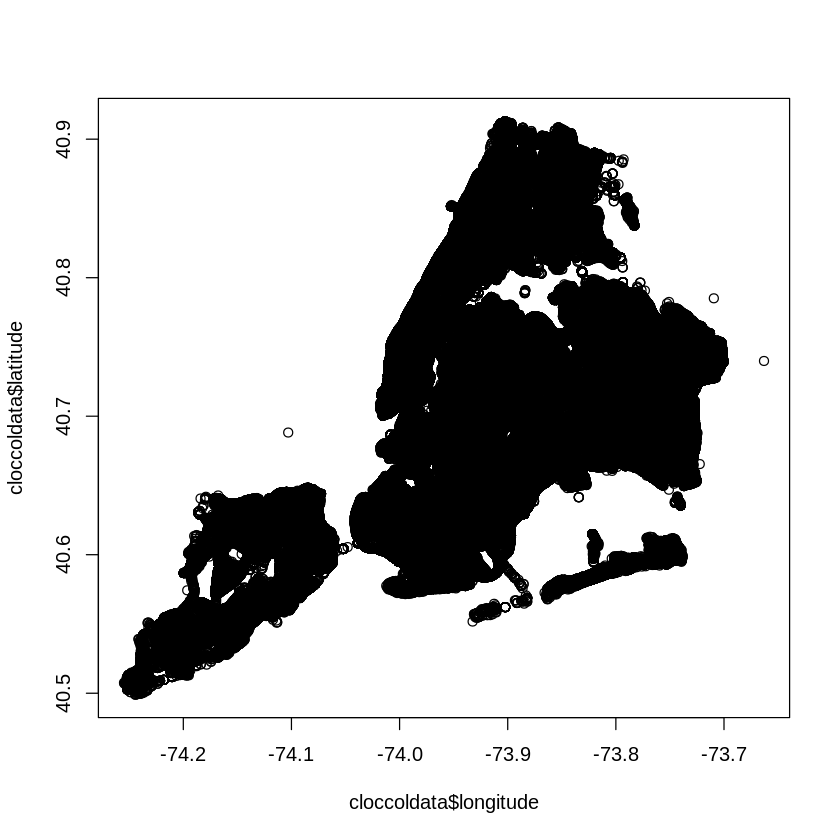

In [81]:
cloccoldata <- subset(cloccoldata, longitude < -50)
cloccoldata <- subset(cloccoldata, longitude > -74.4)
cloccoldata <- subset(cloccoldata, latitude > 40)
cloccoldata <- subset(cloccoldata, latitude < 41)
plot(cloccoldata$longitude,cloccoldata$latitude)

The plot produced above has created a shape similar to that of New York City, there are still outlyers indicating error values. 

[1] -74.25485 -73.66301

[1] -74.25485 -74.05757 -73.86029 -73.66301

[1] 40.49895 40.63693 40.77491 40.91288

[1] -74.25485 -74.05757 -73.86029 -73.66301

long,lat
<dbl>,<dbl>
-74.25485,40.49895
-74.05757,40.49895
-73.86029,40.49895
-73.66301,40.49895
-74.25485,40.63693
-74.05757,40.63693
-73.86029,40.63693
-73.66301,40.63693
-74.25485,40.77491


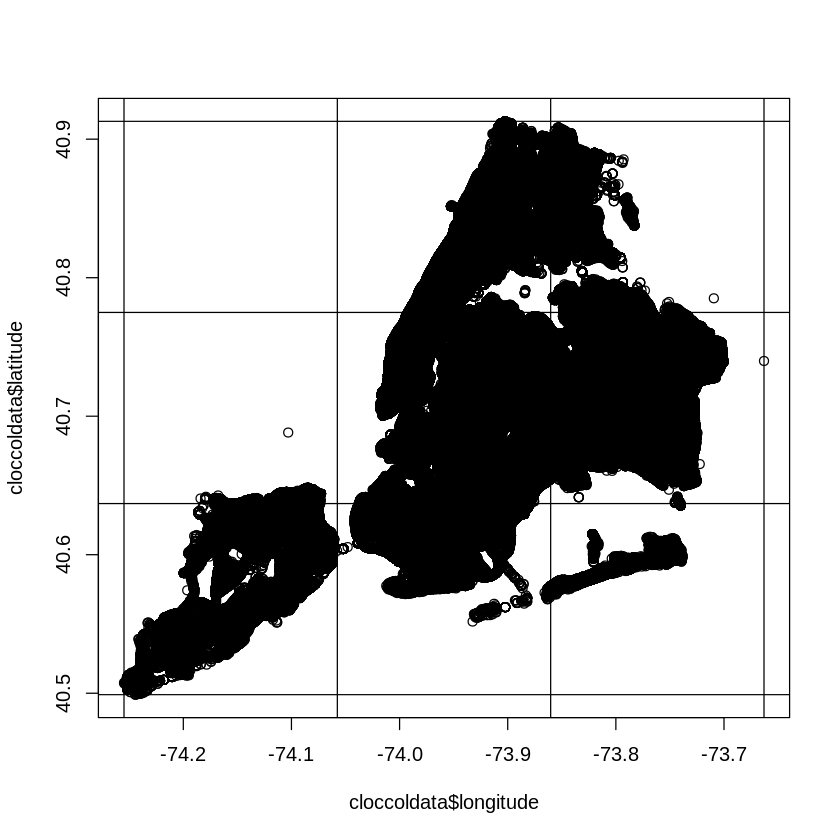

In [82]:
range(cloccoldata$longitude)
gridx <- seq(from=min(cloccoldata$longitude),to=max(cloccoldata$longitude),length.out=4)
gridx
gridy <- seq(from=min(cloccoldata$latitude),to=max(cloccoldata$latitude),length.out=4)
gridy
grid <- expand.grid(long=gridx,lat=gridy)

grid

plot(cloccoldata$longitude,cloccoldata$latitude)
for(x in gridx){
  abline(v = x)
}
for(y in gridy){
  abline(h = y)
}



To break the city of new york into smaller areas, longitude and latitude have been used to segment new york into 9 equal sized squares. This is shown above by the 3x3 grid created, 

https://stackoverflow.com/questions/39435852/create-a-square-grid-in-a-dataframe-in-r

#Conclusion